## Using `archive`, for a wider set of SSO metrics (using the summary statistics CSV file)

This notebook takes the solar system metrics and plots more of them for more families. 
It's a bit of a demo and a bit of a 'make a bunch of plots' notebook. 

In [1]:
# Some useful packages
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import IPython

import rubin_sim.maf as maf

The `archive` module (from `rubin_sim.maf.archive.py`) provides functions to help deal with json/pandas data frames containing lists of the simulations in a given run, as well as typical sets of metrics. With these lists of simulations in each family, it's easier to isolate those metric results to compare the effect of varying that survey strategy. `archive` works with additional functions in `summary_plots` to then normalize and plot metric summary statistics.
(`archive` and `summary_plots` are the evolution of the family_infos and metric_infos classes).

In [2]:
# Download a dataframe of the archive information -- 
# this is a multi-index DF, and can be read in in multiple "versions"
# This version of the dataframe has one row per family, with multiple runs in lists in each row
# note that you can 'explode' this dataframe to be one row per run by doing families.explode('run')
families = maf.archive.get_family_descriptions('runs_v2.1.json')
families.head()

,description,version,reference,run,brief,filepath,url
family,,,,,,,
baseline,**baseline** : The v2 baseline simulations. V2...,--,baseline_v2.1_10yrs,"[baseline_v2.1_10yrs, baseline_v2.0_10yrs, bas...","[v2.1 baseline (+Virgo, good seeing), v2.0 bas...","[baseline/baseline_v2.1_10yrs.db, baseline/bas...",[http://epyc.astro.washington.edu/~lynnej/opsi...
rolling,**rolling** : The rolling family covers a wide...,2.0,baseline_v2.0_10yrs,"[noroll_v2.0_10yrs, rolling_ns2_rw0.5_v2.0_10y...","[v2.0 baseline with no rolling, Rolling half-s...","[noroll/noroll_v2.0_10yrs.db, rolling/rolling_...",[http://epyc.astro.washington.edu/~lynnej/opsi...
triplets,**triplets** : These simulations add a third v...,2.0,baseline_v2.0_10yrs,"[presto_gap1.5_v2.0_10yrs, presto_gap2.0_v2.0_...","[Triples spaced 1.5 hours apart g+r,r+i,i+z in...","[presto/presto_gap1.5_v2.0_10yrs.db, presto/pr...",[http://epyc.astro.washington.edu/~lynnej/opsi...
long gaps no pairs,**long gaps no pairs** : The baseline survey s...,2.0,baseline_v2.0_10yrs,[long_gaps_np_nightsoff7_delayed1827_v2.0_10yr...,[Long gaps pairs every 7 nights starting after...,[long_gaps_nopair/long_gaps_np_nightsoff7_dela...,[http://epyc.astro.washington.edu/~lynnej/opsi...
bluer balance,**bluer balance** : The standard filter balanc...,2.0,baseline_v2.0_10yrs,"[bluer_indx0_v2.0_10yrs, bluer_indx1_v2.0_10yrs]","[More g - filter ratio in WFD of {'u': 0.07, '...","[bluer/bluer_indx0_v2.0_10yrs.db, bluer/bluer_...",[http://epyc.astro.washington.edu/~lynnej/opsi...


Read the summary stat csv file. 

These are the standard MAF summary stats (which may include something you use!) 
but you could join your own dataframe, as long as it covered all the relevant runs.
This gives us metric results to compare between the runs.

In [3]:
# Read the summary stat csv file
url_source = 'https://raw.githubusercontent.com/lsst-pst/survey_strategy/main/fbs_2.0/summary_2022_04_23.csv'
file_source = 'summary_2022_04_23.csv'
summaries = maf.archive.get_metric_summaries(summary_source=file_source)

In [4]:
# And get the metric subset lists that can help with pulling information out of the big summary dataframe
metrics_url = "https://raw.githubusercontent.com/lsst-pst/survey_strategy/main/fbs_2.0/metric_sets.json"
file_source = 'metric_sets.json'
metrics = maf.archive.get_metric_sets(file_source)
metrics.head()

metric  \
metric set metric                                                                                                  
radar      fONv MedianNvis fO All visits HealpixSlicer               fONv MedianNvis fO All visits HealpixSlicer   
           Mean WeakLensingNvisits fiveSigmaDepth, visitEx...  Mean WeakLensingNvisits fiveSigmaDepth, visitE...   
           3x2ptFoM ExgalM5_with_cuts i band non-DD year 1...  3x2ptFoM ExgalM5_with_cuts i band non-DD year ...   
           SNIa_PrePeak non-DD UserPointsSlicer                             SNIa_PrePeak non-DD UserPointsSlicer   
           TDEsPopMetric__some_color_pu  UserPointsSlicer         TDEsPopMetric__some_color_pu  UserPointsSlicer   

                                                              short_name  \
metric set metric                                                          
radar      fONv MedianNvis fO All visits HealpixSlicer          fONv_med   
           Mean WeakLensingNvisits fiveSigmaDepth, visitEx...         WL   
           3x2ptFoM ExgalM5_with_cuts i band non-DD year 1...  3x2pt FoM   
           SNIa_PrePeak non-DD UserPointsSlicer                     SNIa   
           TDEsPopMetric__some_color_pu  UserPointsSlicer            TDE   

                                                              short_names_norm  \
metric set metric                                                                
radar      fONv MedianNvis fO All visits HealpixSlicer                fONv_med   
           Mean WeakLensingNvisits fiveSigmaDepth, visitEx...               WL   
           3x2ptFoM ExgalM5_with_cuts i band non-DD year 1...        3x2pt FoM   
           SNIa_PrePeak non-DD UserPointsSlicer                           SNIa   
           TDEsPopMetric__some_color_pu  UserPointsSlicer                  TDE   

                                                              style  invert  \
metric set metric                                                             
radar      fONv MedianNvis fO All visits HealpixSlicer         None   False   
           Mean WeakLensingNvisits fiveSigmaDepth, visitEx...  None   False   
           3x2ptFoM ExgalM5_with_cuts i band non-DD year 1...  None   False   
           SNIa_PrePeak non-DD UserPointsSlicer                None   False   
           TDEsPopMetric__some_color_pu  UserPointsSlicer      None   False   

                                                                 mag  
metric set metric                                                     
radar      fONv MedianNvis fO All visits HealpixSlicer         False  
           Mean WeakLensingNvisits fiveSigmaDepth, visitEx...  False  
           3x2ptFoM ExgalM5_with_cuts i band non-DD year 1...  False  
           SNIa_PrePeak non-DD UserPointsSlicer                False  
           TDEsPopMetric__some_color_pu  UserPointsSlicer      False

In [5]:
# What are the 'sets' of metrics?
metrics.groupby('metric set').first().index

Index(['Fraction Pop 3 bands', 'Fraction Pop 4 bands', 'Fraction Pop 5 bands',
       'Fraction Pop 6 bands', 'Lightcurve Inversion', 'Nvis', 'SSO NOBJ',
       'SSO discovery', 'area', 'cadence', 'descWFD', 'galaxies', 'radar',
       'short', 'srd', 'sso disc options', 'tvs'],
      dtype='object', name='metric set')

### Solar system metrics

Using utilities from `archive` (to normalize the data frame and plot metrics), combined with the family information dataframe with the simulations in each family, we can pull up some plots for each family.

In [6]:
sso_metrics = ['SSO discovery', 
               'SSO NOBJ',
               'Fraction Pop 3 bands', 
               'Fraction Pop 4 bands',
               'Fraction Pop 5 bands',
               'Fraction Pop 6 bands', 
               'Lightcurve Inversion']

outDir = 'sso_plots'
if not os.path.exists(outDir):
    os.mkdir(outDir)

def describe_family(family):
    if not isinstance(family, list):
        family = [family]
    baseline_run = families['reference'].loc[['baseline']].iloc[0]
    result = maf.archive.describe_families(
        families.loc[family, :],
        summary=summaries,
        table_metric_set=metrics.loc["short"],
        plot_metric_set=metrics.loc["area"],
        baseline_run=baseline_run,
    )

# Show and plot set of solar system specific metric outputs
def sso_family(family, mset):
    if not isinstance(family, list):
        family = [family]
    these_runs = families.explode('run').loc[family, 'run'].values
    baseline_run = families['reference'].loc[family].iloc[0]
    if baseline_run not in these_runs:
        these_runs = np.concatenate([[baseline_run], these_runs])
    fig, ax = maf.plot_run_metric(  # pylint: disable=invalid-name
            summaries.loc[these_runs, :], 
            metric_set=metrics.loc[mset],
            baseline_run=baseline_run,
            vertical_quantity="value",
            horizontal_quantity="run",
            metric_label_map=metrics.loc[mset]['short_name']
        )
    lgd = plt.legend(loc=(1.01, 0.2), fancybox=True, numpoints=1, fontsize='medium')
    figwidth = min(10, len(these_runs))
    figwidth = max(figwidth, 15)
    fig.set_figwidth(figwidth)
    d = summaries.loc[these_runs, metrics.loc[mset]['metric']]
    d = d.rename(columns=metrics.loc[mset]['short_name'], inplace=False)
    return d

---
**baseline** : The v2 baseline simulations. V2.0 and V2.1 feature a survey footprint with expanded dust-free area and WFD-level visits in the Galactic Bulge and Magellanic Clouds. Coverage of the Northern Ecliptic Spur, South Celestial Pole, and remainder of the Galactic Plane is maintained, at lower levels. Filter balance is modified in different areas of the sky. A 2-region rolling cadence is used in the dust-free WFD sky, to improve cadence. The v2.1 simulation adds coverage in the Virgo cluster and acquisition of good seeing images in r&i bands. The retro simulations are intended to provide a bridge from v1.X to v2.X, introducing modifications to the footprint and scheduler code separately and in stages.  
**version**: --  
**runs**:  


,brief,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band
run,,,,,,,,,,,
baseline_v2.1_10yrs,"v2.1 baseline (+Virgo, good seeing)",12434.14,16842.94,2081749.0,838.0,54.0,68.0,179.0,181.0,159.0,165.0
baseline_v2.0_10yrs,v2.0 baseline,12893.23,16711.18,2086980.0,839.0,54.0,70.0,178.0,180.0,160.0,166.0
baseline_retrofoot_v2.0_10yrs,v1.x footprint but new code capabilities,17510.18,14959.57,2086534.0,875.0,56.0,79.0,185.0,188.0,166.0,173.0
retro_baseline_v2.0_10yrs,v1.x baseline with rubin_sim (without new code capabilities),14611.26,15095.54,2048566.0,848.0,53.0,74.0,180.0,180.0,161.0,172.0


metric,Completeness PHA H<16.0,Completeness PHA H<22.0,Completeness NEO H<16.0,Completeness NEO H<22.0,Completeness MBA H<16.0,Completeness MBA H<21.0,Completeness Trojan H<14.0,Completeness Trojan H<18.0,Completeness TNO H<6.0,Completeness TNO H<8.0,Completeness OCC_r5 H<8.0,Completeness OCC_r5 H<17.0,Completeness OCC_r20 H<8.0,Completeness OCC_r20 H<12.0
run,,,,,,,,,,,,,,
baseline_v2.1_10yrs,0.9394,0.596009,0.9296,0.581853,1.0,0.542863,1.0,0.437629,0.699244,0.479611,0.938400,0.640160,0.855200,0.604698
baseline_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0,0.534662,1.0,0.427171,0.695976,0.471819,0.937400,0.629774,0.853935,0.598074
baseline_retrofoot_v2.0_10yrs,0.9400,0.580009,0.9260,0.566718,1.0,0.521977,1.0,0.424528,0.676619,0.454312,0.931804,0.617430,0.842669,0.584535
retro_baseline_v2.0_10yrs,0.9130,0.586427,0.9094,0.567183,1.0,0.570506,1.0,0.480267,0.682227,0.474403,0.933400,0.647957,0.843219,0.599542


metric,NEO Nobj <= 22 (3x2x15),NEO Nobj <= 25 (3x2x15),NEO Nobj <= 22 (3x2x30),NEO Nobj <= 25 (3x2x30),NEO Nobj <= 22 (6x60),NEO Nobj <= 25 (6x60)
run,,,,,,
baseline_v2.1_10yrs,15837.376542,57914.501791,17040.210805,67295.599983,18997.647487,98395.324798
baseline_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
baseline_retrofoot_v2.0_10yrs,15433.932501,54931.434095,16584.534108,64332.904482,18658.710148,94313.838051
retro_baseline_v2.0_10yrs,15440.123475,61060.572243,16644.678738,72879.425179,18715.390923,101918.006132


metric,Fraction 3 of g and (r or i) and (z or y) PHA H=16.0,Fraction 3 of g and (r or i) and (z or y) PHA H=19.0,Fraction 3 of g and (r or i) and (z or y) NEO H=16.0,Fraction 3 of g and (r or i) and (z or y) NEO H=19.0,Fraction 3 of g and (r or i) and (z or y) MBA H=16.0,Fraction 3 of g and (r or i) and (z or y) MBA H=18.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=14.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=15.0,Fraction 3 filters TNO H=6.0,Fraction 3 filters TNO H=7.0,Fraction 3 filters OCC_r5 H=8.0,Fraction 3 filters OCC_r5 H=14.0,Fraction 3 filters OCC_r20 H=8.0,Fraction 3 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.1_10yrs,0.8408,0.5236,0.8540,0.5246,1.0,0.896179,1.0,1.0000,0.6146,0.4678,0.8474,0.4706,0.7782,0.6412
baseline_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0,0.901780,1.0,0.9996,0.6168,0.4794,0.8478,0.4718,0.7804,0.6418
baseline_retrofoot_v2.0_10yrs,0.8296,0.5178,0.8416,0.5148,1.0,0.887578,1.0,0.9988,0.5996,0.4540,0.8346,0.4798,0.7646,0.6174
retro_baseline_v2.0_10yrs,0.8094,0.5208,0.8272,0.5182,1.0,0.934587,1.0,1.0000,0.6048,0.4766,0.8358,0.5120,0.7620,0.6474


metric,Fraction 4 of grizy PHA H=16.0,Fraction 4 of grizy PHA H=19.0,Fraction 4 of grizy NEO H=16.0,Fraction 4 of grizy NEO H=19.0,Fraction 4 of grizy MBA H=16.0,Fraction 4 of grizy MBA H=18.0,Fraction 4 of grizy Trojan H=14.0,Fraction 4 of grizy Trojan H=15.0,Fraction 4 filters TNO H=6.0,Fraction 4 filters TNO H=7.0,Fraction 4 filters OCC_r5 H=8.0,Fraction 4 filters OCC_r5 H=14.0,Fraction 4 filters OCC_r20 H=8.0,Fraction 4 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.1_10yrs,0.8402,0.5234,0.8538,0.5242,1.0,0.896179,1.0,1.0000,0.5982,0.4150,0.8294,0.3340,0.7630,0.3838
baseline_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0,0.901780,1.0,0.9996,0.5978,0.4248,0.8302,0.3372,0.7608,0.3906
baseline_retrofoot_v2.0_10yrs,0.8296,0.5176,0.8416,0.5144,1.0,0.887578,1.0,0.9988,0.5826,0.3924,0.8142,0.3442,0.7418,0.3896
retro_baseline_v2.0_10yrs,0.8090,0.5202,0.8270,0.5178,1.0,0.934587,1.0,1.0000,0.5940,0.4304,0.8196,0.3586,0.7462,0.4220


metric,Fraction with grizy PHA H=16.0,Fraction with grizy PHA H=19.0,Fraction with grizy NEO H=16.0,Fraction with grizy NEO H=19.0,Fraction with grizy MBA H=16.0,Fraction with grizy MBA H=18.0,Fraction with grizy Trojan H=14.0,Fraction with grizy Trojan H=15.0,Fraction with 5 filters TNO H=6.0,Fraction with 5 filters TNO H=7.0,Fraction 5 filters OCC_r5 H=8.0,Fraction 5 filters OCC_r5 H=14.0,Fraction 5 filters OCC_r20 H=8.0,Fraction 5 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.1_10yrs,0.7144,0.2988,0.7454,0.3116,0.994999,0.405681,1.0000,0.4578,0.3988,0.1612,0.7480,0.1784,0.6966,0.1576
baseline_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786,0.7554,0.1826,0.6998,0.1658
baseline_retrofoot_v2.0_10yrs,0.6910,0.3192,0.7302,0.3288,0.993599,0.427686,0.9992,0.5568,0.3612,0.1746,0.7238,0.1936,0.6586,0.1662
retro_baseline_v2.0_10yrs,0.6690,0.3112,0.7076,0.3294,0.997800,0.455291,0.9996,0.5854,0.3680,0.1848,0.7296,0.1874,0.6600,0.1730


metric,Fraction with ugrizy PHA H=16.0,Fraction with ugrizy PHA H=19.0,Fraction with ugrizy NEO H=16.0,Fraction with ugrizy NEO H=19.0,Fraction with ugrizy MBA H=16.0,Fraction with ugrizy MBA H=18.0,Fraction with ugrizy Trojan H=14.0,Fraction with ugrizy Trojan H=15.0,Fraction with 6 filters TNO H=6.0,Fraction with 6 filters TNO H=7.0,Fraction 6 filters OCC_r5 H=8.0,Fraction 6 filters OCC_r5 H=14.0,Fraction 6 filters OCC_r20 H=8.0,Fraction 6 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.1_10yrs,0.4386,0.0476,0.4500,0.0454,0.884777,0.042809,0.9182,0.0020,0.0136,0.0002,0.5988,0.0056,0.6056,0.0278
baseline_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,0.0002,0.5992,0.0068,0.6104,0.0296
baseline_retrofoot_v2.0_10yrs,0.4438,0.0458,0.4526,0.0498,0.876375,0.051810,0.9068,0.0018,0.0180,0.0006,0.5866,0.0064,0.5822,0.0330
retro_baseline_v2.0_10yrs,0.3796,0.0332,0.3914,0.0372,0.866973,0.034407,0.8370,0.0020,0.0108,0.0002,0.5816,0.0044,0.5832,0.0266


metric,Fraction LC Inversion PHA H=16.0,Fraction LC Inversion PHA H=19.0,Fraction LC Inversion NEO H=16.0,Fraction LC Inversion NEO H=19.0,Fraction LC Inversion MBA H=16.0,Fraction LC Inversion MBA H=18.0,Fraction LC Inversion Trojan H=14.0,Fraction LC Inversion Trojan H=15.0
run,,,,,,,,
baseline_v2.1_10yrs,0.4662,0.0546,0.4812,0.0548,0.946789,0.155031,0.9428,0.1186
baseline_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
baseline_retrofoot_v2.0_10yrs,0.4690,0.0550,0.4822,0.0546,0.926985,0.129426,0.8984,0.1092
retro_baseline_v2.0_10yrs,0.4450,0.0470,0.4650,0.0438,0.964793,0.152831,0.9786,0.0836


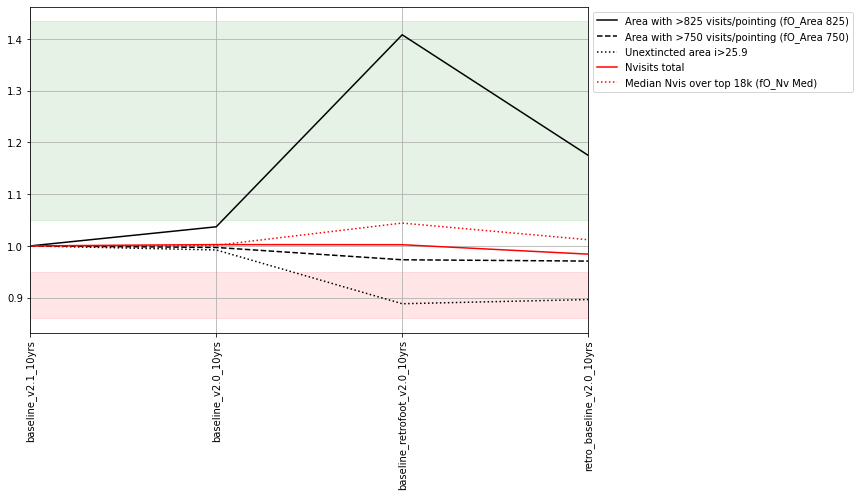

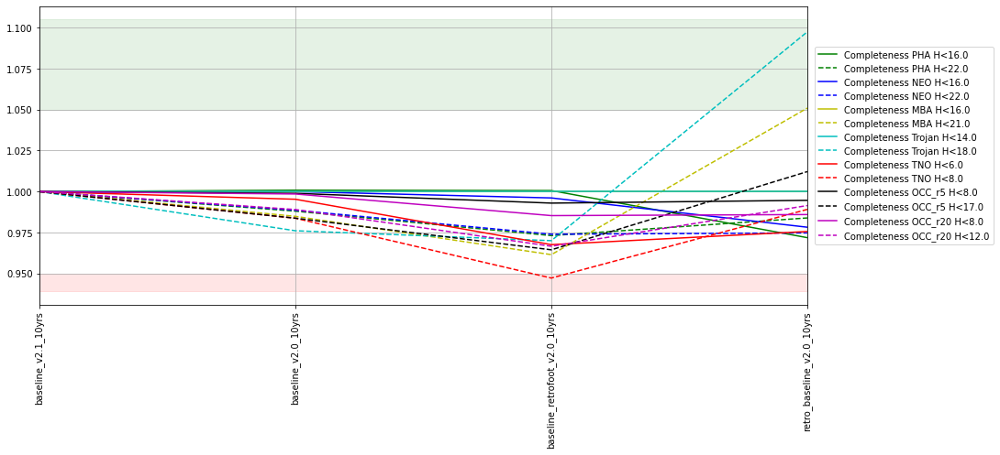

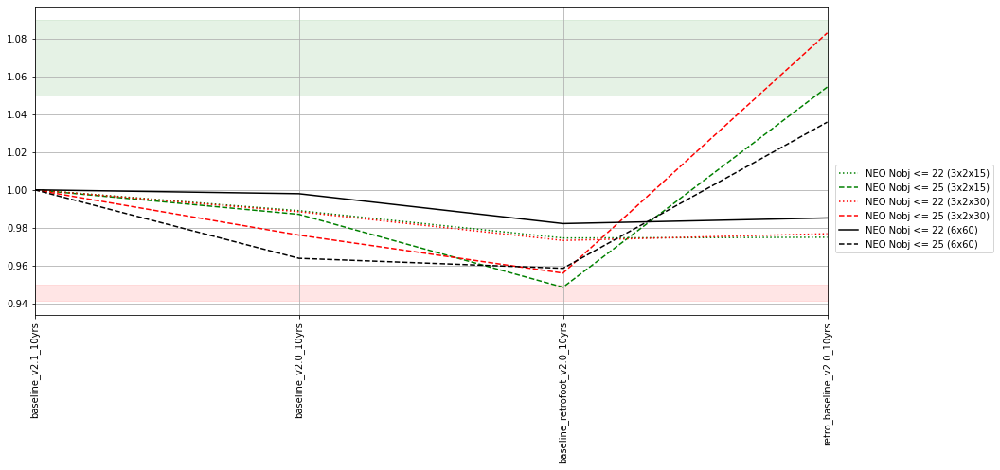

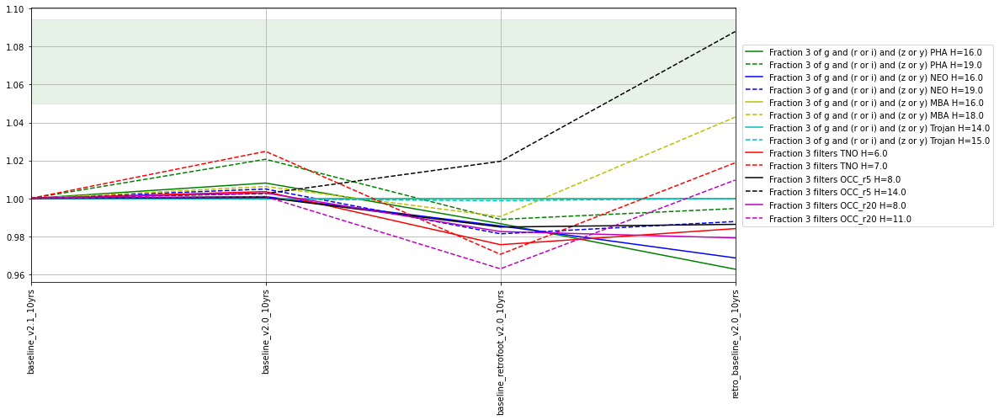

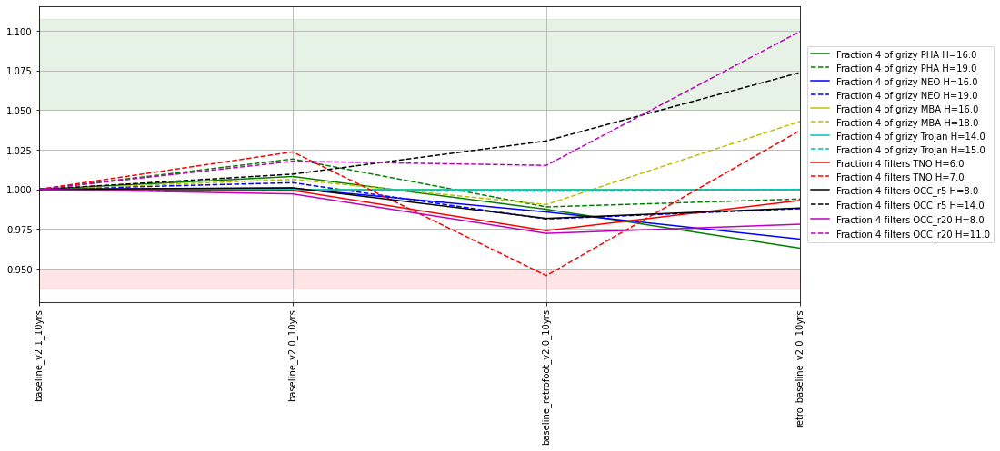

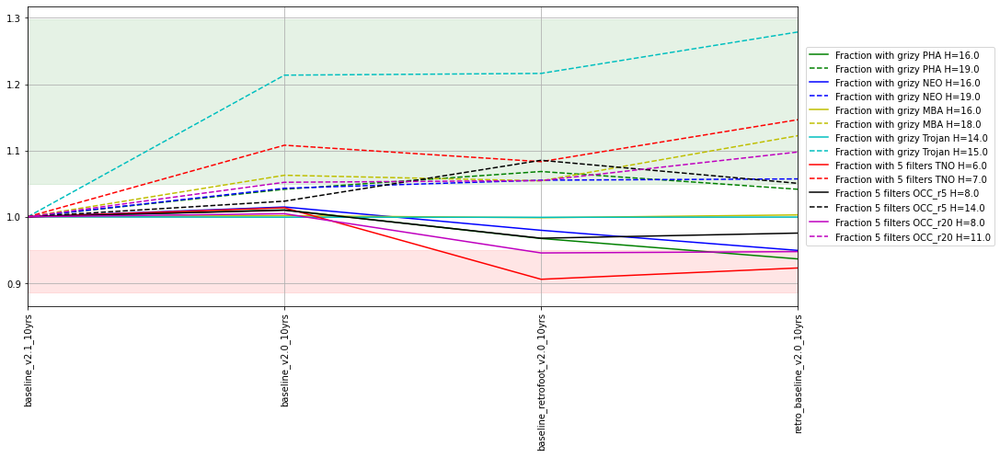

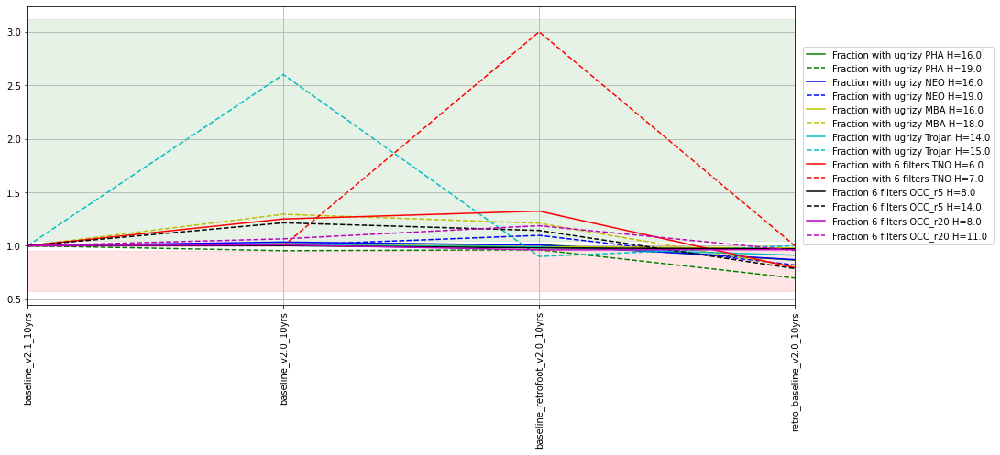

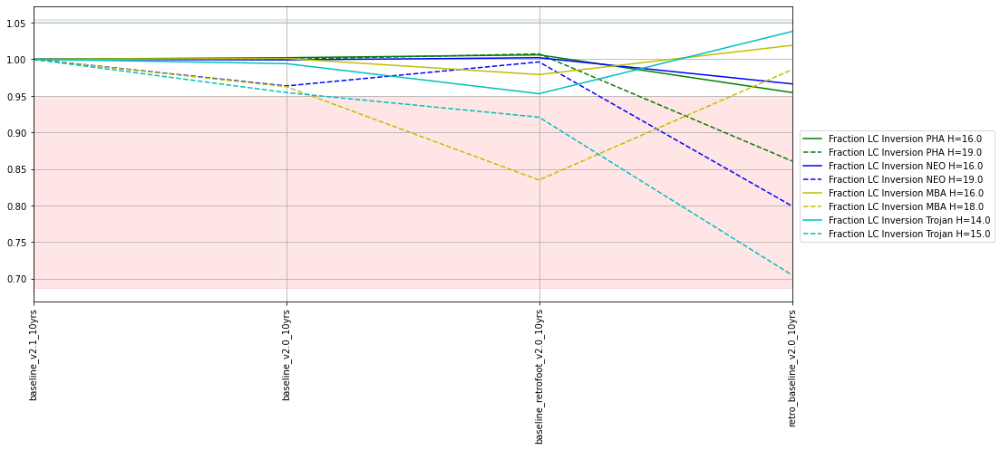

In [7]:
fam = 'baseline'
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

---
**vary nes** : These simulations investigate the effect of varying the amount of survey time spent on covering the North Ecliptic Spur area. The baseline characteristics, including the ratio of visits over the remainder of the footprint, are kept the same.   
**version**: 2.0  
**runs**:  


,brief,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band
run,,,,,,,,,,,
vary_nes_nesfrac0.01_v2.0_10yrs,NES at 1% WFD level,17534.52,16896.66,2087392.0,869.0,55.0,72.0,184.0,187.0,167.0,172.0
vary_nes_nesfrac0.05_v2.0_10yrs,NES at 5% WFD level,17223.14,16868.96,2087572.0,865.0,55.0,71.0,183.0,186.0,166.0,172.0
vary_nes_nesfrac0.10_v2.0_10yrs,NES at 10% WFD level,16779.16,16769.09,2087761.0,861.0,55.0,71.0,182.0,185.0,165.0,171.0
vary_nes_nesfrac0.15_v2.0_10yrs,NES at 15% WFD level,16146.33,16760.69,2087741.0,856.0,55.0,71.0,181.0,184.0,164.0,170.0
vary_nes_nesfrac0.20_v2.0_10yrs,NES at 20% WFD level,15380.06,16815.25,2087462.0,851.0,55.0,71.0,180.0,183.0,163.0,169.0
vary_nes_nesfrac0.25_v2.0_10yrs,NES at 25% WFD level,14228.55,16691.03,2087377.0,845.0,54.0,70.0,179.0,181.0,161.0,168.0
vary_nes_nesfrac0.30_v2.0_10yrs,NES at 30% WFD level,12893.23,16711.18,2086980.0,839.0,54.0,70.0,178.0,180.0,160.0,166.0
vary_nes_nesfrac0.35_v2.0_10yrs,NES at 35% WFD level,11059.37,16583.60,2087488.0,832.0,53.0,69.0,176.0,178.0,159.0,165.0
vary_nes_nesfrac0.40_v2.0_10yrs,NES at 40% WFD level,9061.01,16561.78,2087857.0,825.0,53.0,69.0,174.0,177.0,157.0,164.0


metric,Completeness PHA H<16.0,Completeness PHA H<22.0,Completeness NEO H<16.0,Completeness NEO H<22.0,Completeness MBA H<16.0,Completeness MBA H<21.0,Completeness Trojan H<14.0,Completeness Trojan H<18.0,Completeness TNO H<6.0,Completeness TNO H<8.0,Completeness OCC_r5 H<8.0,Completeness OCC_r5 H<17.0,Completeness OCC_r20 H<8.0,Completeness OCC_r20 H<12.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0,0.534662,1.0,0.427171,0.695976,0.471819,0.937400,0.629774,0.853935,0.598074
vary_nes_nesfrac0.01_v2.0_10yrs,0.9288,0.582260,0.9204,0.571490,1.0,0.519912,1.0,0.420827,0.646536,0.430100,0.927200,0.621526,0.821600,0.574007
vary_nes_nesfrac0.05_v2.0_10yrs,0.9292,0.578065,0.9238,0.566988,1.0,0.522519,1.0,0.423186,0.683730,0.450519,0.933400,0.616459,0.836800,0.581820
vary_nes_nesfrac0.10_v2.0_10yrs,0.9352,0.576135,0.9256,0.568213,1.0,0.518835,1.0,0.420995,0.691674,0.457132,0.935935,0.619471,0.846000,0.586804
vary_nes_nesfrac0.15_v2.0_10yrs,0.9396,0.585770,0.9262,0.570950,1.0,0.525441,1.0,0.421213,0.693704,0.460856,0.937800,0.623886,0.851135,0.589166
vary_nes_nesfrac0.20_v2.0_10yrs,0.9384,0.586042,0.9292,0.573157,1.0,0.529549,1.0,0.418937,0.694224,0.469233,0.938800,0.626169,0.849690,0.591829
vary_nes_nesfrac0.25_v2.0_10yrs,0.9368,0.579744,0.9282,0.571837,1.0,0.532602,1.0,0.426423,0.696000,0.469920,0.938000,0.628826,0.854200,0.594396
vary_nes_nesfrac0.30_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0,0.534662,1.0,0.427171,0.695976,0.471819,0.937400,0.629774,0.853935,0.598074
vary_nes_nesfrac0.35_v2.0_10yrs,0.9402,0.589964,0.9310,0.574886,1.0,0.530026,1.0,0.425618,0.696167,0.472005,0.939535,0.631851,0.856800,0.596988


metric,NEO Nobj <= 22 (3x2x15),NEO Nobj <= 25 (3x2x15),NEO Nobj <= 22 (3x2x30),NEO Nobj <= 25 (3x2x30),NEO Nobj <= 22 (6x60),NEO Nobj <= 25 (6x60)
run,,,,,,
baseline_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
vary_nes_nesfrac0.01_v2.0_10yrs,15558.429678,55908.021643,16586.765316,64515.652943,18563.463349,92250.779020
vary_nes_nesfrac0.05_v2.0_10yrs,15440.861187,55758.437549,16513.562673,63237.726074,18584.871339,91295.542630
vary_nes_nesfrac0.10_v2.0_10yrs,15475.016771,54820.818941,16592.537985,63268.910641,18663.529586,91774.594523
vary_nes_nesfrac0.15_v2.0_10yrs,15546.809383,55790.041994,16628.540280,64567.318762,18761.277772,93477.592749
vary_nes_nesfrac0.20_v2.0_10yrs,15608.429868,56830.914038,16775.545650,65188.300909,18854.023874,94959.046581
vary_nes_nesfrac0.25_v2.0_10yrs,15572.667617,56542.783448,16675.875418,65872.992427,18794.158475,94417.631207
vary_nes_nesfrac0.30_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
vary_nes_nesfrac0.35_v2.0_10yrs,15655.004160,57538.124272,16844.377119,66348.847883,18969.885835,95697.531906


metric,Fraction 3 of g and (r or i) and (z or y) PHA H=16.0,Fraction 3 of g and (r or i) and (z or y) PHA H=19.0,Fraction 3 of g and (r or i) and (z or y) NEO H=16.0,Fraction 3 of g and (r or i) and (z or y) NEO H=19.0,Fraction 3 of g and (r or i) and (z or y) MBA H=16.0,Fraction 3 of g and (r or i) and (z or y) MBA H=18.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=14.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=15.0,Fraction 3 filters TNO H=6.0,Fraction 3 filters TNO H=7.0,Fraction 3 filters OCC_r5 H=8.0,Fraction 3 filters OCC_r5 H=14.0,Fraction 3 filters OCC_r20 H=8.0,Fraction 3 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0000,0.901780,1.0000,0.9996,0.6168,0.4794,0.8478,0.4718,0.7804,0.6418
vary_nes_nesfrac0.01_v2.0_10yrs,0.8128,0.5092,0.8362,0.5202,0.9998,0.883977,0.9998,0.9990,0.4766,0.3910,0.8072,0.4628,0.7256,0.6126
vary_nes_nesfrac0.05_v2.0_10yrs,0.8174,0.5052,0.8368,0.5150,0.9998,0.880776,0.9998,0.9988,0.4792,0.3914,0.8102,0.4564,0.7270,0.6126
vary_nes_nesfrac0.10_v2.0_10yrs,0.8228,0.5116,0.8452,0.5250,0.9998,0.887978,1.0000,0.9988,0.4902,0.3938,0.8208,0.4604,0.7358,0.6168
vary_nes_nesfrac0.15_v2.0_10yrs,0.8334,0.5244,0.8460,0.5210,1.0000,0.894579,1.0000,0.9994,0.5964,0.4246,0.8364,0.4630,0.7608,0.6240
vary_nes_nesfrac0.20_v2.0_10yrs,0.8378,0.5236,0.8502,0.5260,1.0000,0.895179,1.0000,0.9994,0.6128,0.4532,0.8434,0.4674,0.7660,0.6260
vary_nes_nesfrac0.25_v2.0_10yrs,0.8408,0.5282,0.8540,0.5320,1.0000,0.905381,1.0000,0.9998,0.6164,0.4692,0.8458,0.4630,0.7760,0.6308
vary_nes_nesfrac0.30_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0000,0.901780,1.0000,0.9996,0.6168,0.4794,0.8478,0.4718,0.7804,0.6418
vary_nes_nesfrac0.35_v2.0_10yrs,0.8504,0.5336,0.8564,0.5328,1.0000,0.905781,1.0000,0.9996,0.6190,0.4878,0.8488,0.4736,0.7838,0.6444


metric,Fraction 4 of grizy PHA H=16.0,Fraction 4 of grizy PHA H=19.0,Fraction 4 of grizy NEO H=16.0,Fraction 4 of grizy NEO H=19.0,Fraction 4 of grizy MBA H=16.0,Fraction 4 of grizy MBA H=18.0,Fraction 4 of grizy Trojan H=14.0,Fraction 4 of grizy Trojan H=15.0,Fraction 4 filters TNO H=6.0,Fraction 4 filters TNO H=7.0,Fraction 4 filters OCC_r5 H=8.0,Fraction 4 filters OCC_r5 H=14.0,Fraction 4 filters OCC_r20 H=8.0,Fraction 4 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0000,0.901780,1.0000,0.9996,0.5978,0.4248,0.8302,0.3372,0.7608,0.3906
vary_nes_nesfrac0.01_v2.0_10yrs,0.8124,0.5086,0.8356,0.5202,0.9998,0.883977,0.9998,0.9990,0.4606,0.3680,0.7906,0.3374,0.7176,0.3768
vary_nes_nesfrac0.05_v2.0_10yrs,0.8168,0.5040,0.8362,0.5142,0.9998,0.880776,0.9998,0.9988,0.4644,0.3690,0.7948,0.3368,0.7174,0.3794
vary_nes_nesfrac0.10_v2.0_10yrs,0.8208,0.5104,0.8446,0.5244,0.9998,0.887978,1.0000,0.9988,0.4650,0.3712,0.7982,0.3318,0.7224,0.3806
vary_nes_nesfrac0.15_v2.0_10yrs,0.8330,0.5238,0.8456,0.5204,1.0000,0.894579,1.0000,0.9994,0.4832,0.3706,0.8082,0.3350,0.7292,0.3852
vary_nes_nesfrac0.20_v2.0_10yrs,0.8374,0.5230,0.8498,0.5252,1.0000,0.895179,1.0000,0.9994,0.5608,0.3850,0.8184,0.3382,0.7466,0.3856
vary_nes_nesfrac0.25_v2.0_10yrs,0.8408,0.5274,0.8538,0.5316,1.0000,0.905381,1.0000,0.9998,0.5926,0.4062,0.8262,0.3386,0.7558,0.3874
vary_nes_nesfrac0.30_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0000,0.901780,1.0000,0.9996,0.5978,0.4248,0.8302,0.3372,0.7608,0.3906
vary_nes_nesfrac0.35_v2.0_10yrs,0.8504,0.5334,0.8564,0.5322,1.0000,0.905781,1.0000,0.9996,0.6016,0.4380,0.8330,0.3390,0.7684,0.3950


metric,Fraction with grizy PHA H=16.0,Fraction with grizy PHA H=19.0,Fraction with grizy NEO H=16.0,Fraction with grizy NEO H=19.0,Fraction with grizy MBA H=16.0,Fraction with grizy MBA H=18.0,Fraction with grizy Trojan H=14.0,Fraction with grizy Trojan H=15.0,Fraction with 5 filters TNO H=6.0,Fraction with 5 filters TNO H=7.0,Fraction 5 filters OCC_r5 H=8.0,Fraction 5 filters OCC_r5 H=14.0,Fraction 5 filters OCC_r20 H=8.0,Fraction 5 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786,0.7554,0.1826,0.6998,0.1658
vary_nes_nesfrac0.01_v2.0_10yrs,0.6972,0.3052,0.7306,0.3204,0.996199,0.434087,0.9994,0.6060,0.4034,0.1840,0.7330,0.1848,0.6800,0.1656
vary_nes_nesfrac0.05_v2.0_10yrs,0.7060,0.3080,0.7406,0.3288,0.994799,0.432286,0.9992,0.5684,0.4028,0.1782,0.7356,0.1854,0.6830,0.1682
vary_nes_nesfrac0.10_v2.0_10yrs,0.7122,0.3074,0.7414,0.3284,0.996399,0.428486,0.9998,0.5648,0.4036,0.1808,0.7416,0.1864,0.6884,0.1670
vary_nes_nesfrac0.15_v2.0_10yrs,0.7160,0.3142,0.7496,0.3256,0.994999,0.430086,0.9996,0.5720,0.4070,0.1804,0.7454,0.1820,0.6938,0.1658
vary_nes_nesfrac0.20_v2.0_10yrs,0.7206,0.3178,0.7534,0.3286,0.995599,0.427085,0.9998,0.5928,0.4072,0.1802,0.7500,0.1898,0.6928,0.1678
vary_nes_nesfrac0.25_v2.0_10yrs,0.7180,0.3134,0.7478,0.3298,0.995799,0.427686,0.9994,0.5584,0.4096,0.1808,0.7528,0.1858,0.6956,0.1650
vary_nes_nesfrac0.30_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786,0.7554,0.1826,0.6998,0.1658
vary_nes_nesfrac0.35_v2.0_10yrs,0.7290,0.3208,0.7506,0.3238,0.995399,0.418484,0.9994,0.5604,0.4068,0.1778,0.7554,0.1832,0.7000,0.1658


metric,Fraction with ugrizy PHA H=16.0,Fraction with ugrizy PHA H=19.0,Fraction with ugrizy NEO H=16.0,Fraction with ugrizy NEO H=19.0,Fraction with ugrizy MBA H=16.0,Fraction with ugrizy MBA H=18.0,Fraction with ugrizy Trojan H=14.0,Fraction with ugrizy Trojan H=15.0,Fraction with 6 filters TNO H=6.0,Fraction with 6 filters TNO H=7.0,Fraction 6 filters OCC_r5 H=8.0,Fraction 6 filters OCC_r5 H=14.0,Fraction 6 filters OCC_r20 H=8.0,Fraction 6 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,0.0002,0.5992,0.0068,0.6104,0.0296
vary_nes_nesfrac0.01_v2.0_10yrs,0.4646,0.0498,0.4814,0.0500,0.902781,0.053011,0.9500,0.0040,0.0164,0.0002,0.6004,0.0070,0.6050,0.0330
vary_nes_nesfrac0.05_v2.0_10yrs,0.4566,0.0474,0.4786,0.0506,0.910982,0.057211,0.9288,0.0036,0.0170,0.0002,0.6018,0.0068,0.6062,0.0354
vary_nes_nesfrac0.10_v2.0_10yrs,0.4526,0.0512,0.4784,0.0488,0.901380,0.052210,0.9408,0.0034,0.0180,0.0002,0.6030,0.0074,0.6102,0.0350
vary_nes_nesfrac0.15_v2.0_10yrs,0.4578,0.0504,0.4732,0.0486,0.901580,0.054011,0.9372,0.0030,0.0174,0.0002,0.6014,0.0048,0.6060,0.0330
vary_nes_nesfrac0.20_v2.0_10yrs,0.4548,0.0492,0.4682,0.0476,0.897980,0.053411,0.9370,0.0030,0.0164,0.0002,0.6092,0.0062,0.6140,0.0316
vary_nes_nesfrac0.25_v2.0_10yrs,0.4446,0.0518,0.4670,0.0492,0.898980,0.048610,0.9382,0.0038,0.0154,0.0002,0.5992,0.0054,0.6090,0.0310
vary_nes_nesfrac0.30_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,0.0002,0.5992,0.0068,0.6104,0.0296
vary_nes_nesfrac0.35_v2.0_10yrs,0.4462,0.0456,0.4592,0.0458,0.891778,0.051810,0.9346,0.0036,0.0160,0.0002,0.5996,0.0048,0.6080,0.0298


metric,Fraction LC Inversion PHA H=16.0,Fraction LC Inversion PHA H=19.0,Fraction LC Inversion NEO H=16.0,Fraction LC Inversion NEO H=19.0,Fraction LC Inversion MBA H=16.0,Fraction LC Inversion MBA H=18.0,Fraction LC Inversion Trojan H=14.0,Fraction LC Inversion Trojan H=15.0
run,,,,,,,,
baseline_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
vary_nes_nesfrac0.01_v2.0_10yrs,0.4316,0.0538,0.4536,0.0508,0.892979,0.116623,0.8854,0.0866
vary_nes_nesfrac0.05_v2.0_10yrs,0.4366,0.0538,0.4620,0.0532,0.906181,0.117423,0.8918,0.1030
vary_nes_nesfrac0.10_v2.0_10yrs,0.4412,0.0534,0.4640,0.0530,0.913383,0.122024,0.9068,0.0956
vary_nes_nesfrac0.15_v2.0_10yrs,0.4450,0.0524,0.4594,0.0522,0.923985,0.128826,0.9172,0.1084
vary_nes_nesfrac0.20_v2.0_10yrs,0.4482,0.0506,0.4750,0.0522,0.930786,0.133627,0.9210,0.1172
vary_nes_nesfrac0.25_v2.0_10yrs,0.4618,0.0552,0.4746,0.0508,0.940188,0.145629,0.9398,0.1076
vary_nes_nesfrac0.30_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
vary_nes_nesfrac0.35_v2.0_10yrs,0.4766,0.0532,0.4910,0.0516,0.953791,0.149430,0.9394,0.1134


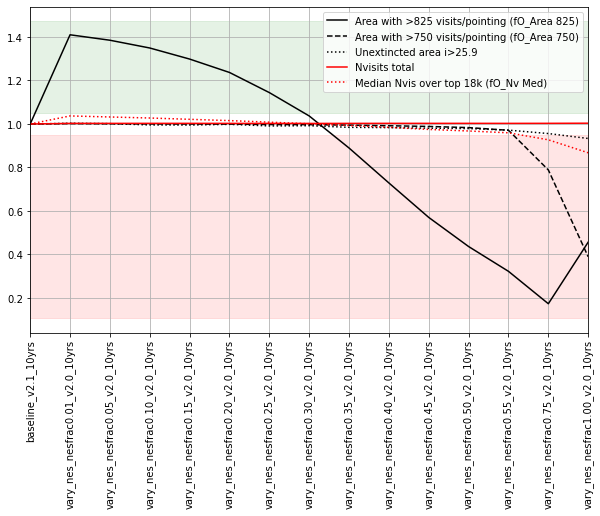

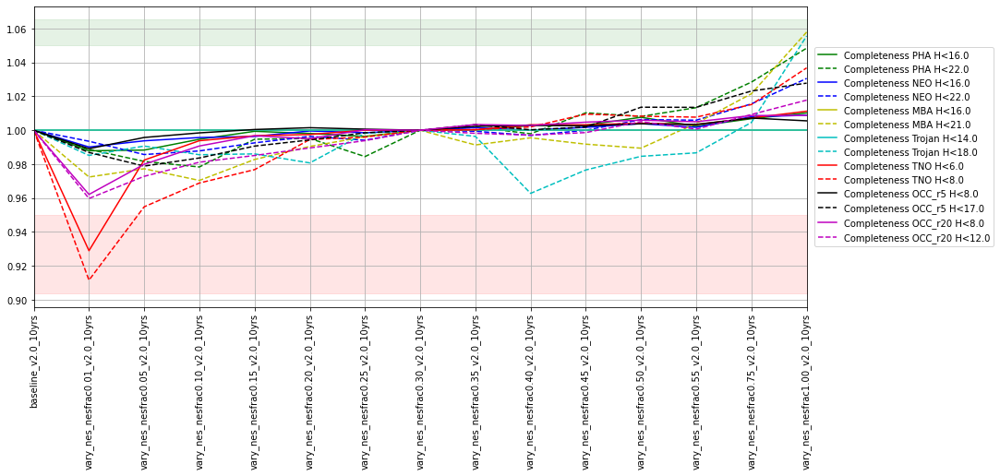

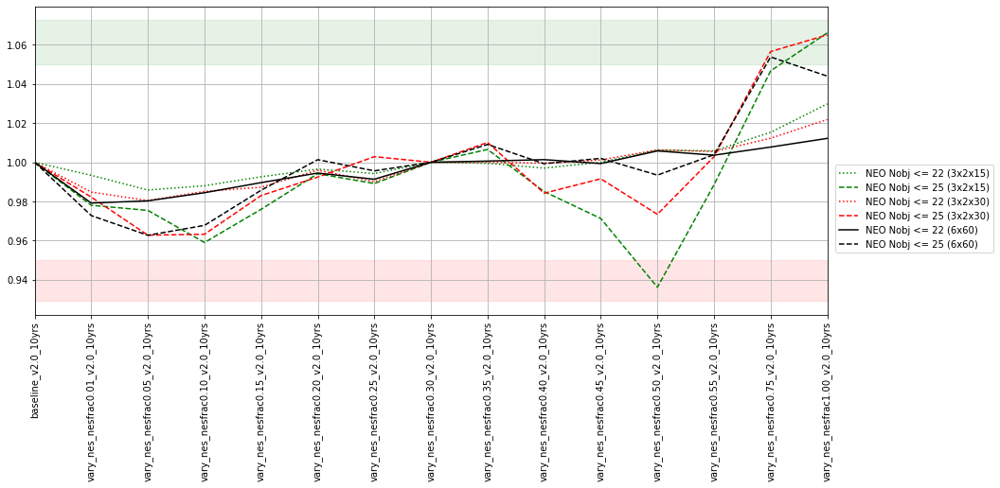

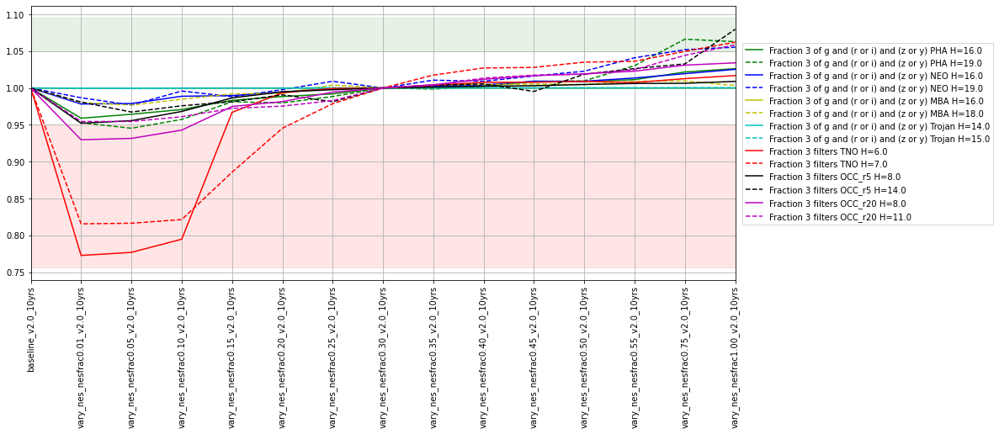

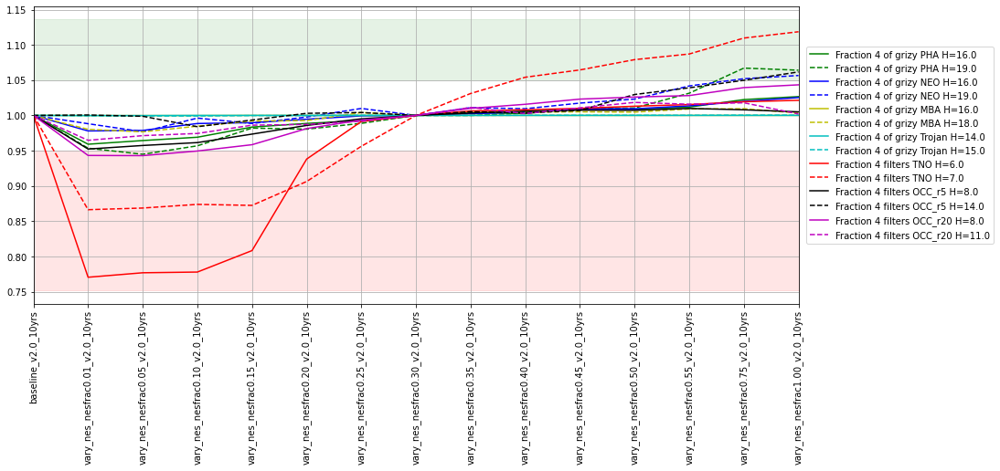

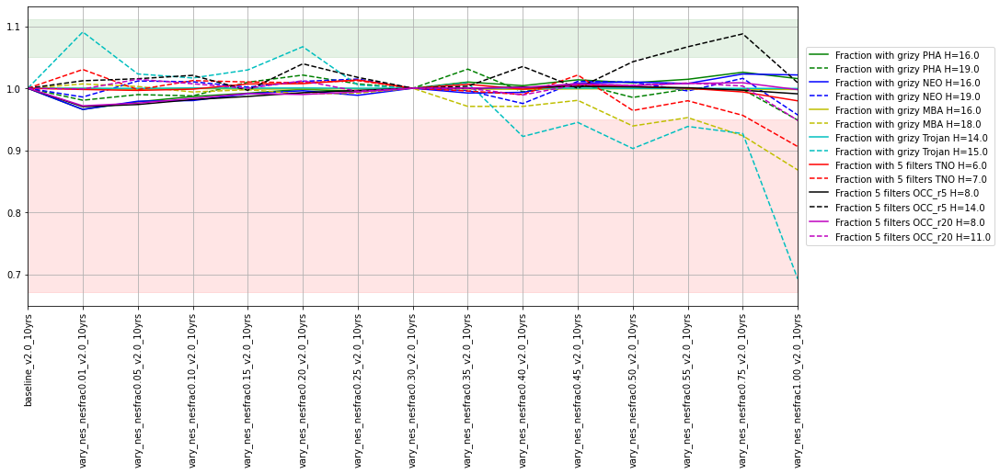

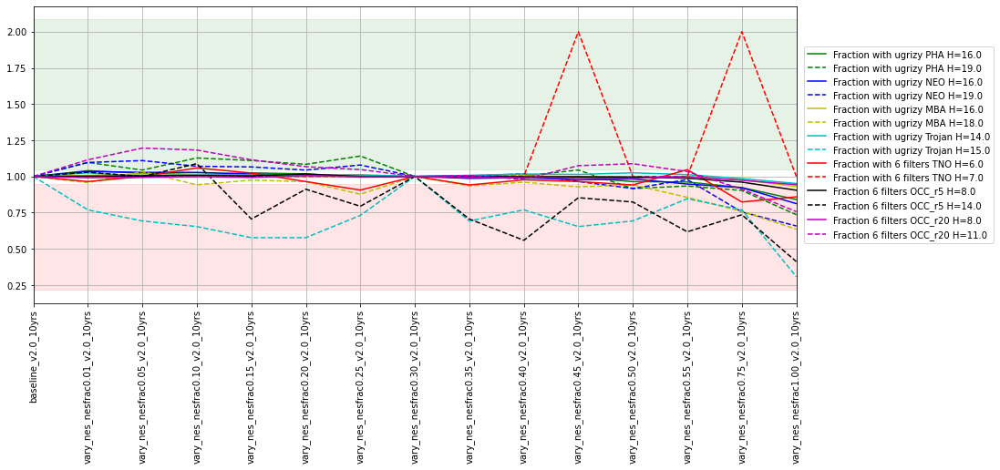

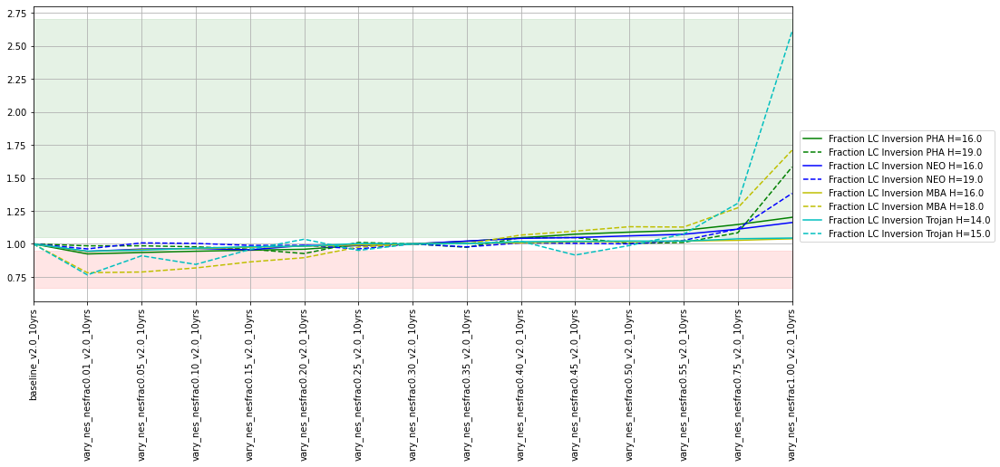

In [8]:
fam = 'vary nes'
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

---
**rolling** : The rolling family covers a wide variety of rolling cadence variations. These are arranged in general estimation of the impact of the rolling cadence, from "least" to "most" - no_roll has no rolling cadence at all, then variations on the number of stripes (ns=2/3/6) are added, as as which areas of the sky (WFD only, adding the bulge WFD-area, all-sky). The strength of rolling is also varied (rw=50,80 or 90%).  
**version**: 2.0  
**runs**:  


,brief,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band
run,,,,,,,,,,,
noroll_v2.0_10yrs,v2.0 baseline with no rolling,12558.35,17005.77,2083375.0,837.0,54.0,70.0,177.0,180.0,160.0,166.0
rolling_ns2_rw0.5_v2.0_10yrs,Rolling half-sky (2 regions) 50%,12614.58,16807.69,2084510.0,838.0,54.0,69.0,177.0,180.0,160.0,166.0
rolling_ns3_rw0.5_v2.0_10yrs,Rolling third-sky (3 regions) 50%,12729.57,16873.16,2085499.0,838.0,54.0,70.0,177.0,180.0,160.0,166.0
rolling_ns2_rw0.9_v2.0_10yrs,Rolling half-sky (2 regions) 90%,12893.23,16711.18,2086980.0,839.0,54.0,70.0,178.0,180.0,160.0,166.0
rolling_ns3_rw0.9_v2.0_10yrs,Rolling third-sky (3 regions) 90%,13255.80,16568.50,2090909.0,841.0,54.0,70.0,178.0,181.0,160.0,167.0
rolling_bulge_ns2_rw0.5_v2.0_10yrs,"Roll in the bulge with 2 regions, 50%",12600.32,16868.96,2084413.0,838.0,54.0,69.0,177.0,180.0,160.0,166.0
rolling_bulge_ns2_rw0.8_v2.0_10yrs,"Roll in the bulge with 2 regions, 80%",12733.76,16664.18,2086550.0,838.0,54.0,70.0,178.0,180.0,161.0,166.0
rolling_bulge_ns2_rw0.9_v2.0_10yrs,"Roll in the bulge with 2 regions, 90%",12940.23,16706.14,2087907.0,840.0,54.0,70.0,178.0,180.0,160.0,166.0
rolling_all_sky_ns2_rw0.9_v2.0_10yrs,Roll on all parts of the sky,12900.78,16599.55,2088105.0,839.0,54.0,69.0,178.0,180.0,160.0,166.0


metric,Completeness PHA H<16.0,Completeness PHA H<22.0,Completeness NEO H<16.0,Completeness NEO H<22.0,Completeness MBA H<16.0,Completeness MBA H<21.0,Completeness Trojan H<14.0,Completeness Trojan H<18.0,Completeness TNO H<6.0,Completeness TNO H<8.0,Completeness OCC_r5 H<8.0,Completeness OCC_r5 H<17.0,Completeness OCC_r20 H<8.0,Completeness OCC_r20 H<12.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0000,0.534662,1.0,0.427171,0.695976,0.471819,0.937400,0.629774,0.853935,0.598074
noroll_v2.0_10yrs,0.9336,0.594035,0.9254,0.580079,1.0000,0.531578,1.0,0.416040,0.694019,0.466134,0.937600,0.643694,0.852535,0.589424
rolling_ns2_rw0.5_v2.0_10yrs,0.9356,0.590608,0.9282,0.574481,1.0000,0.532391,1.0,0.416318,0.694734,0.468886,0.938600,0.637636,0.853000,0.591561
rolling_ns3_rw0.5_v2.0_10yrs,0.9340,0.585846,0.9292,0.578934,1.0000,0.528978,1.0,0.415417,0.696531,0.473095,0.938200,0.632478,0.854935,0.595616
rolling_ns2_rw0.9_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0000,0.534662,1.0,0.427171,0.695976,0.471819,0.937400,0.629774,0.853935,0.598074
rolling_ns3_rw0.9_v2.0_10yrs,0.9444,0.581618,0.9324,0.566985,1.0000,0.525043,1.0,0.417641,0.697595,0.476506,0.938200,0.615599,0.854800,0.596484
rolling_bulge_ns2_rw0.5_v2.0_10yrs,0.9358,0.594242,0.9272,0.578730,1.0000,0.531585,1.0,0.423320,0.694457,0.469262,0.937200,0.637948,0.853335,0.591770
rolling_bulge_ns2_rw0.8_v2.0_10yrs,0.9396,0.586697,0.9312,0.575349,1.0000,0.534771,1.0,0.424635,0.696074,0.471744,0.937600,0.632759,0.854735,0.595702
rolling_bulge_ns2_rw0.9_v2.0_10yrs,0.9426,0.588636,0.9318,0.574934,1.0000,0.534093,1.0,0.419650,0.695751,0.472651,0.939200,0.627703,0.851800,0.595794


metric,NEO Nobj <= 22 (3x2x15),NEO Nobj <= 25 (3x2x15),NEO Nobj <= 22 (3x2x30),NEO Nobj <= 25 (3x2x30),NEO Nobj <= 22 (6x60),NEO Nobj <= 25 (6x60)
run,,,,,,
baseline_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
noroll_v2.0_10yrs,15788.717921,57815.990897,17138.683964,68326.759581,19172.020394,99271.776571
rolling_ns2_rw0.5_v2.0_10yrs,15642.651174,59729.542587,16910.413086,69880.358652,19062.957642,97970.173134
rolling_ns3_rw0.5_v2.0_10yrs,15758.386132,56291.844221,16984.087874,66534.493520,19073.401430,97921.292300
rolling_ns2_rw0.9_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
rolling_ns3_rw0.9_v2.0_10yrs,15444.638048,55450.306678,16547.246025,63871.367530,18756.522687,92015.414085
rolling_bulge_ns2_rw0.5_v2.0_10yrs,15753.971823,57080.500256,16976.590514,67169.098009,19053.896446,97649.716294
rolling_bulge_ns2_rw0.8_v2.0_10yrs,15667.624192,57083.289206,16833.496591,66415.978716,18942.904383,95332.160710
rolling_bulge_ns2_rw0.9_v2.0_10yrs,15654.974460,59142.404297,16824.020112,67917.452450,18909.544935,96114.523096


metric,Fraction 3 of g and (r or i) and (z or y) PHA H=16.0,Fraction 3 of g and (r or i) and (z or y) PHA H=19.0,Fraction 3 of g and (r or i) and (z or y) NEO H=16.0,Fraction 3 of g and (r or i) and (z or y) NEO H=19.0,Fraction 3 of g and (r or i) and (z or y) MBA H=16.0,Fraction 3 of g and (r or i) and (z or y) MBA H=18.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=14.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=15.0,Fraction 3 filters TNO H=6.0,Fraction 3 filters TNO H=7.0,Fraction 3 filters OCC_r5 H=8.0,Fraction 3 filters OCC_r5 H=14.0,Fraction 3 filters OCC_r20 H=8.0,Fraction 3 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0000,0.901780,1.0000,0.9996,0.6168,0.4794,0.8478,0.4718,0.7804,0.6418
noroll_v2.0_10yrs,0.8436,0.5404,0.8550,0.5400,1.0000,0.930386,1.0000,0.9998,0.6186,0.4842,0.8524,0.5070,0.7790,0.6504
rolling_ns2_rw0.5_v2.0_10yrs,0.8472,0.5394,0.8556,0.5322,1.0000,0.922384,1.0000,0.9998,0.6188,0.4840,0.8486,0.4930,0.7792,0.6468
rolling_ns3_rw0.5_v2.0_10yrs,0.8456,0.5382,0.8546,0.5312,1.0000,0.908782,1.0000,1.0000,0.6162,0.4788,0.8474,0.4724,0.7804,0.6426
rolling_ns2_rw0.9_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0000,0.901780,1.0000,0.9996,0.6168,0.4794,0.8478,0.4718,0.7804,0.6418
rolling_ns3_rw0.9_v2.0_10yrs,0.8462,0.5188,0.8506,0.5216,1.0000,0.874575,1.0000,0.9990,0.6146,0.4744,0.8450,0.4368,0.7758,0.6216
rolling_bulge_ns2_rw0.5_v2.0_10yrs,0.8450,0.5346,0.8564,0.5324,1.0000,0.917784,1.0000,0.9998,0.6190,0.4850,0.8510,0.4900,0.7792,0.6464
rolling_bulge_ns2_rw0.8_v2.0_10yrs,0.8428,0.5306,0.8544,0.5260,1.0000,0.902981,1.0000,0.9998,0.6162,0.4790,0.8490,0.4762,0.7796,0.6408
rolling_bulge_ns2_rw0.9_v2.0_10yrs,0.8446,0.5270,0.8568,0.5312,1.0000,0.900380,1.0000,0.9994,0.6188,0.4764,0.8480,0.4686,0.7804,0.6372


metric,Fraction 4 of grizy PHA H=16.0,Fraction 4 of grizy PHA H=19.0,Fraction 4 of grizy NEO H=16.0,Fraction 4 of grizy NEO H=19.0,Fraction 4 of grizy MBA H=16.0,Fraction 4 of grizy MBA H=18.0,Fraction 4 of grizy Trojan H=14.0,Fraction 4 of grizy Trojan H=15.0,Fraction 4 filters TNO H=6.0,Fraction 4 filters TNO H=7.0,Fraction 4 filters OCC_r5 H=8.0,Fraction 4 filters OCC_r5 H=14.0,Fraction 4 filters OCC_r20 H=8.0,Fraction 4 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0000,0.901780,1.0000,0.9996,0.5978,0.4248,0.8302,0.3372,0.7608,0.3906
noroll_v2.0_10yrs,0.8434,0.5402,0.8548,0.5398,1.0000,0.930386,1.0000,0.9998,0.6026,0.4320,0.8334,0.3518,0.7678,0.4054
rolling_ns2_rw0.5_v2.0_10yrs,0.8466,0.5390,0.8550,0.5318,1.0000,0.922384,1.0000,0.9998,0.5990,0.4302,0.8316,0.3474,0.7638,0.3948
rolling_ns3_rw0.5_v2.0_10yrs,0.8452,0.5382,0.8546,0.5312,1.0000,0.908782,1.0000,1.0000,0.5998,0.4264,0.8294,0.3298,0.7644,0.3920
rolling_ns2_rw0.9_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0000,0.901780,1.0000,0.9996,0.5978,0.4248,0.8302,0.3372,0.7608,0.3906
rolling_ns3_rw0.9_v2.0_10yrs,0.8454,0.5180,0.8498,0.5204,1.0000,0.874575,1.0000,0.9990,0.5960,0.4156,0.8224,0.3144,0.7580,0.3768
rolling_bulge_ns2_rw0.5_v2.0_10yrs,0.8450,0.5344,0.8564,0.5322,1.0000,0.917784,1.0000,0.9998,0.6004,0.4312,0.8322,0.3442,0.7640,0.3992
rolling_bulge_ns2_rw0.8_v2.0_10yrs,0.8424,0.5302,0.8540,0.5258,1.0000,0.902981,1.0000,0.9998,0.5990,0.4228,0.8326,0.3402,0.7620,0.3884
rolling_bulge_ns2_rw0.9_v2.0_10yrs,0.8444,0.5266,0.8568,0.5306,1.0000,0.900380,1.0000,0.9994,0.5968,0.4236,0.8296,0.3350,0.7640,0.3894


metric,Fraction with grizy PHA H=16.0,Fraction with grizy PHA H=19.0,Fraction with grizy NEO H=16.0,Fraction with grizy NEO H=19.0,Fraction with grizy MBA H=16.0,Fraction with grizy MBA H=18.0,Fraction with grizy Trojan H=14.0,Fraction with grizy Trojan H=15.0,Fraction with 5 filters TNO H=6.0,Fraction with 5 filters TNO H=7.0,Fraction 5 filters OCC_r5 H=8.0,Fraction 5 filters OCC_r5 H=14.0,Fraction 5 filters OCC_r20 H=8.0,Fraction 5 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786,0.7554,0.1826,0.6998,0.1658
noroll_v2.0_10yrs,0.7204,0.3184,0.7548,0.3362,0.997399,0.440688,0.9998,0.6312,0.4118,0.1810,0.7572,0.1862,0.7006,0.1696
rolling_ns2_rw0.5_v2.0_10yrs,0.7270,0.3204,0.7512,0.3228,0.996999,0.437087,0.9994,0.5748,0.4076,0.1830,0.7556,0.1874,0.7022,0.1706
rolling_ns3_rw0.5_v2.0_10yrs,0.7160,0.3122,0.7460,0.3244,0.997600,0.441488,0.9998,0.6084,0.4086,0.1824,0.7540,0.1806,0.7014,0.1672
rolling_ns2_rw0.9_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786,0.7554,0.1826,0.6998,0.1658
rolling_ns3_rw0.9_v2.0_10yrs,0.7196,0.3060,0.7506,0.3248,0.996399,0.411482,0.9986,0.5262,0.4062,0.1782,0.7476,0.1752,0.6924,0.1608
rolling_bulge_ns2_rw0.5_v2.0_10yrs,0.7246,0.3144,0.7518,0.3272,0.997199,0.431886,0.9996,0.5748,0.4066,0.1786,0.7538,0.1844,0.7030,0.1698
rolling_bulge_ns2_rw0.8_v2.0_10yrs,0.7196,0.3078,0.7520,0.3216,0.995599,0.424485,0.9988,0.5692,0.4062,0.1820,0.7530,0.1850,0.6994,0.1678
rolling_bulge_ns2_rw0.9_v2.0_10yrs,0.7282,0.3158,0.7540,0.3286,0.995599,0.427285,0.9990,0.5544,0.4054,0.1808,0.7532,0.1852,0.6992,0.1658


metric,Fraction with ugrizy PHA H=16.0,Fraction with ugrizy PHA H=19.0,Fraction with ugrizy NEO H=16.0,Fraction with ugrizy NEO H=19.0,Fraction with ugrizy MBA H=16.0,Fraction with ugrizy MBA H=18.0,Fraction with ugrizy Trojan H=14.0,Fraction with ugrizy Trojan H=15.0,Fraction with 6 filters TNO H=6.0,Fraction with 6 filters TNO H=7.0,Fraction 6 filters OCC_r5 H=8.0,Fraction 6 filters OCC_r5 H=14.0,Fraction 6 filters OCC_r20 H=8.0,Fraction 6 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,0.0002,0.5992,0.0068,0.6104,0.0296
noroll_v2.0_10yrs,0.4384,0.0456,0.4598,0.0506,0.927385,0.056611,0.9528,0.0042,0.0186,0.0002,0.6054,0.0056,0.6112,0.0334
rolling_ns2_rw0.5_v2.0_10yrs,0.4488,0.0496,0.4646,0.0482,0.918584,0.059812,0.9470,0.0036,0.0188,0.0004,0.6030,0.0046,0.6078,0.0340
rolling_ns3_rw0.5_v2.0_10yrs,0.4538,0.0476,0.4704,0.0476,0.901780,0.053411,0.9336,0.0062,0.0174,0.0004,0.5994,0.0046,0.6046,0.0334
rolling_ns2_rw0.9_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,0.0002,0.5992,0.0068,0.6104,0.0296
rolling_ns3_rw0.9_v2.0_10yrs,0.4556,0.0460,0.4756,0.0496,0.859172,0.041608,0.8930,0.0040,0.0158,0.0002,0.5902,0.0080,0.6026,0.0274
rolling_bulge_ns2_rw0.5_v2.0_10yrs,0.4406,0.0486,0.4580,0.0494,0.912583,0.051410,0.9402,0.0052,0.0164,0.0004,0.6072,0.0056,0.6090,0.0344
rolling_bulge_ns2_rw0.8_v2.0_10yrs,0.4522,0.0476,0.4640,0.0480,0.904781,0.051610,0.9490,0.0048,0.0168,0.0002,0.6016,0.0052,0.6062,0.0300
rolling_bulge_ns2_rw0.9_v2.0_10yrs,0.4516,0.0472,0.4674,0.0462,0.899180,0.049010,0.9434,0.0042,0.0180,0.0002,0.5964,0.0064,0.6072,0.0302


metric,Fraction LC Inversion PHA H=16.0,Fraction LC Inversion PHA H=19.0,Fraction LC Inversion NEO H=16.0,Fraction LC Inversion NEO H=19.0,Fraction LC Inversion MBA H=16.0,Fraction LC Inversion MBA H=18.0,Fraction LC Inversion Trojan H=14.0,Fraction LC Inversion Trojan H=15.0
run,,,,,,,,
baseline_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
noroll_v2.0_10yrs,0.4712,0.0512,0.4920,0.0510,0.975995,0.157832,0.9850,0.0720
rolling_ns2_rw0.5_v2.0_10yrs,0.4678,0.0500,0.4866,0.0516,0.966993,0.154831,0.9692,0.0902
rolling_ns3_rw0.5_v2.0_10yrs,0.4664,0.0518,0.4896,0.0502,0.957191,0.146429,0.9602,0.1002
rolling_ns2_rw0.9_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
rolling_ns3_rw0.9_v2.0_10yrs,0.4614,0.0532,0.4804,0.0530,0.913983,0.138828,0.8984,0.1446
rolling_bulge_ns2_rw0.5_v2.0_10yrs,0.4708,0.0526,0.4892,0.0522,0.961992,0.154831,0.9636,0.0830
rolling_bulge_ns2_rw0.8_v2.0_10yrs,0.4672,0.0528,0.4860,0.0508,0.948390,0.151030,0.9416,0.0928
rolling_bulge_ns2_rw0.9_v2.0_10yrs,0.4686,0.0534,0.4840,0.0526,0.943789,0.148230,0.9294,0.0952


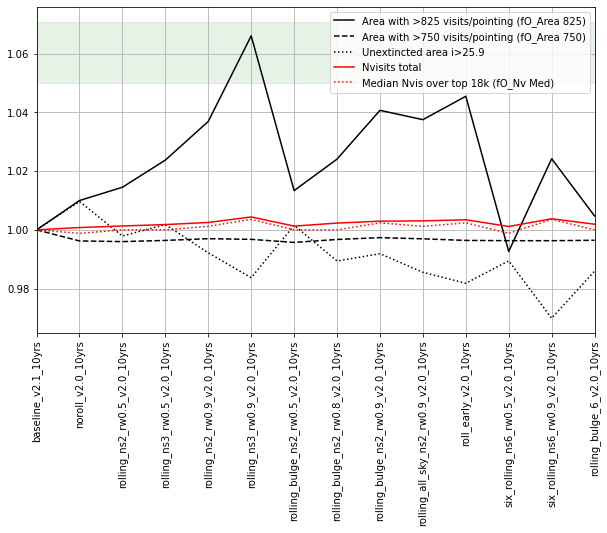

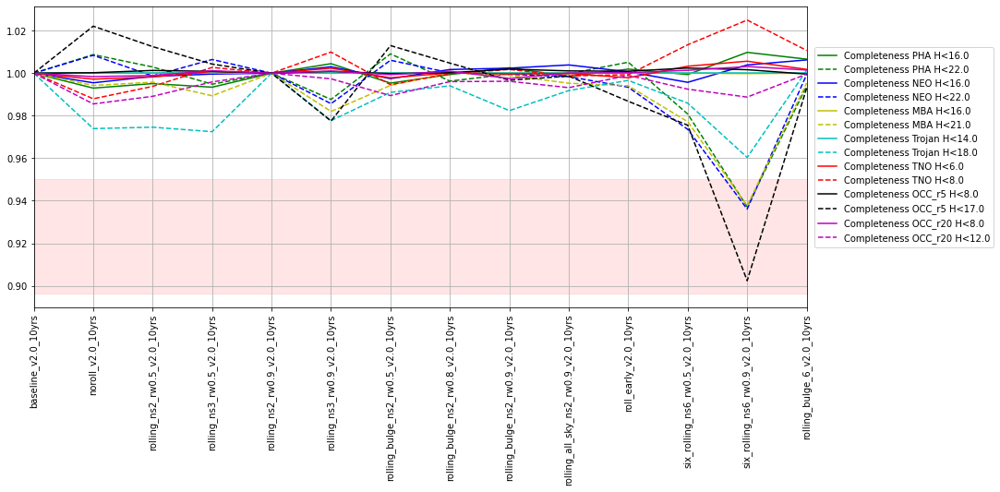

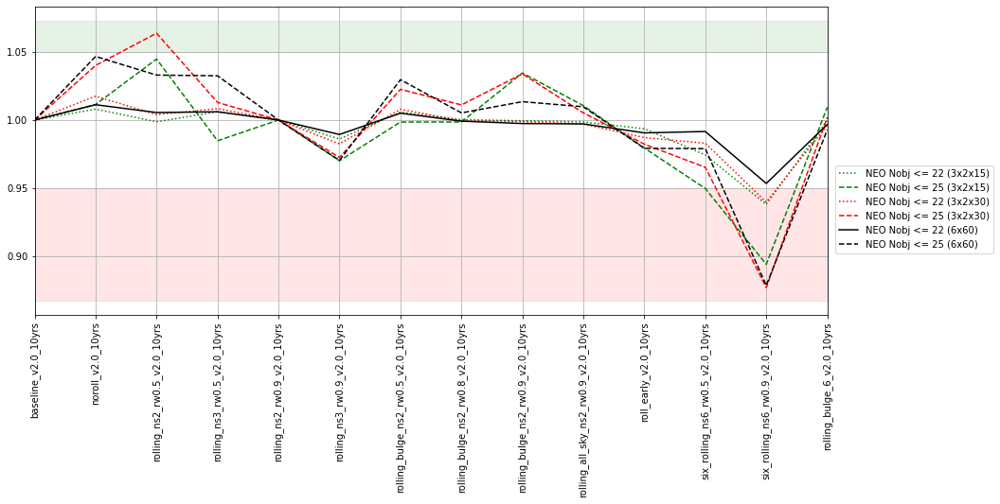

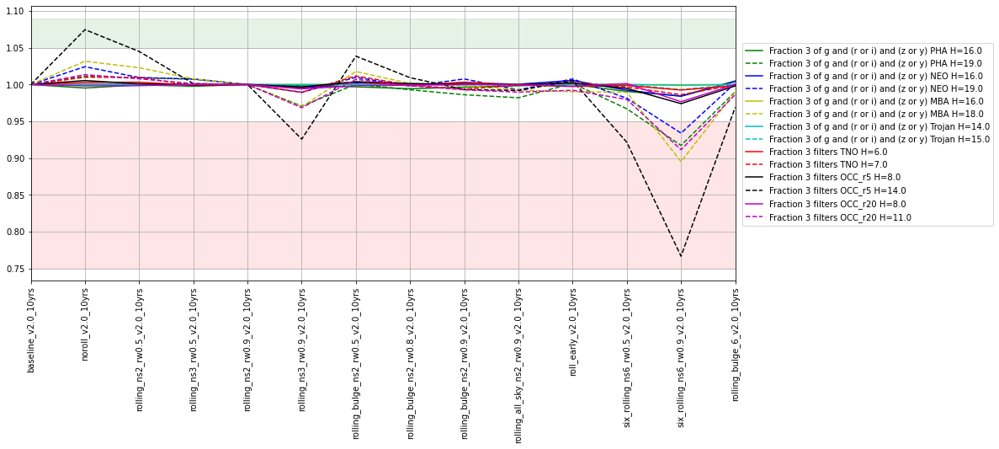

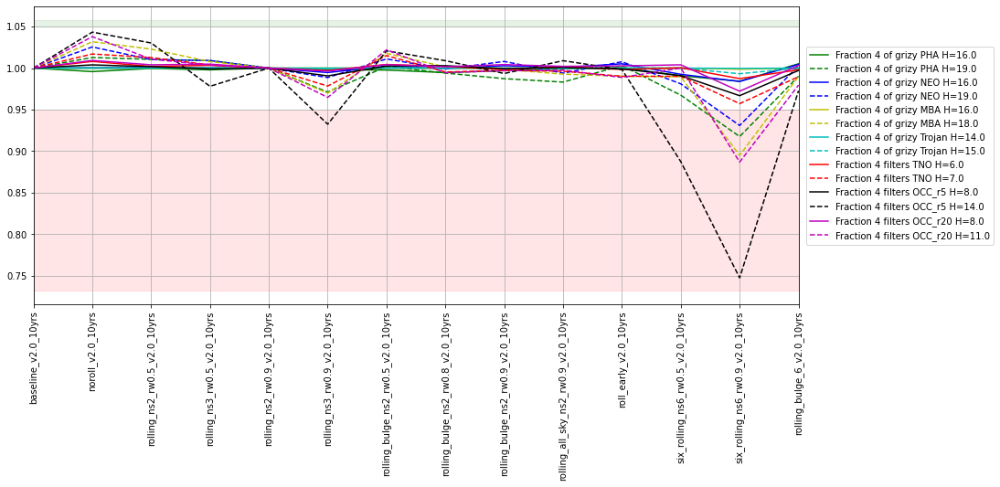

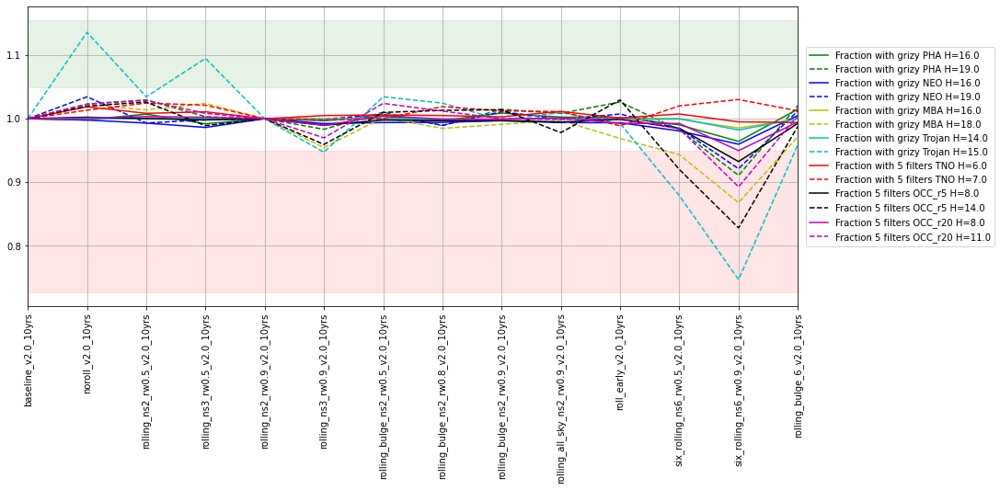

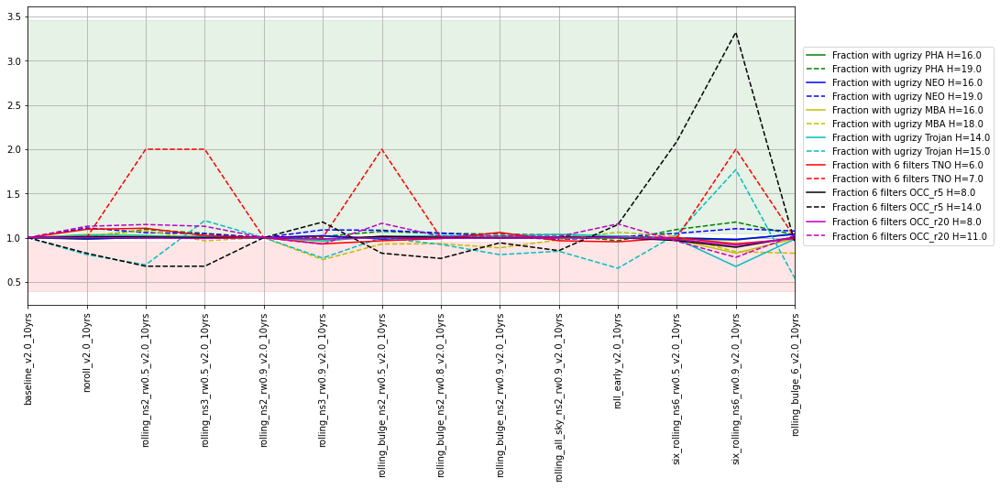

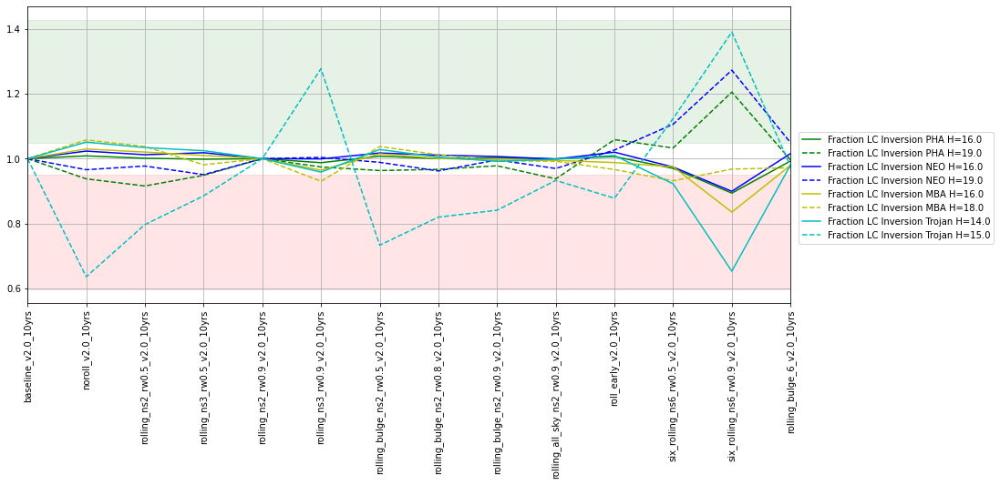

In [9]:
fam = 'rolling'
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

---
**triplets** : These simulations add a third visit within each night, with variations on the time interval between the first pair of visits (standard separation of 33 minutes) to the third visit. The third visit is always acquired in the same filter as one of the earlier visits in the pair. The "presto_gap" runs take triplets all the time, at a set interval to the third visit and in the filter pairs described in the brief descriptions. The "presto_half" runs are similar, but only take triplets of visits about half of the time. The "long_gaps" runs vary the interval to the third visit, and generally have longer gaps of 2 to 7 hours. The long_gaps run take triplets at a variety of frequencies, ranging from every night to every few nights; in some simulations the triplets do not start until year 5.  
**version**: 2.0  
**runs**:  


,brief,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band
run,,,,,,,,,,,
presto_gap1.5_v2.0_10yrs,"Triples spaced 1.5 hours apart g+r,r+i,i+z initial pairs",2177.97,12137.03,1991926.0,790.0,17.0,76.0,173.0,183.0,154.0,152.0
presto_gap2.0_v2.0_10yrs,"Triples spaced 2.0 hours apart g+r,r+i,i+z initial pairs",3255.62,11658.63,2004698.0,798.0,25.0,75.0,173.0,182.0,154.0,153.0
presto_gap2.5_v2.0_10yrs,"Triples spaced 2.5 hours apart g+r,r+i,i+z initial pairs",2386.95,12485.33,1986054.0,792.0,28.0,74.0,172.0,179.0,152.0,152.0
presto_gap3.0_v2.0_10yrs,"Triples spaced 3.0 hours apart g+r,r+i,i+z initial pairs",2732.74,12722.01,1986782.0,794.0,30.0,73.0,172.0,178.0,153.0,152.0
presto_gap3.5_v2.0_10yrs,"Triples spaced 3.5 hours apart g+r,r+i,i+z initial pairs",3034.05,12541.56,1992713.0,796.0,31.0,73.0,172.0,177.0,153.0,153.0
presto_gap4.0_v2.0_10yrs,"Triples spaced 4.0 hours apart g+r,r+i,i+z initial pairs",3530.07,12735.44,1998152.0,799.0,36.0,72.0,173.0,177.0,153.0,153.0
presto_gap1.5_mix_v2.0_10yrs,"Triples spaced 1.5 hours apart g+i,r+z,i+y initial pairs",1400.78,15687.24,1977886.0,787.0,19.0,71.0,171.0,176.0,159.0,159.0
presto_gap2.0_mix_v2.0_10yrs,"Triples spaced 2.0 hours apart g+i,r+z,i+y initial pairs",2426.40,15796.35,1995049.0,795.0,26.0,71.0,172.0,176.0,158.0,160.0
presto_gap2.5_mix_v2.0_10yrs,"Triples spaced 2.5 hours apart g+i,r+z,i+y initial pairs",1822.11,15860.13,1978530.0,790.0,30.0,70.0,170.0,173.0,156.0,158.0


metric,Completeness PHA H<16.0,Completeness PHA H<22.0,Completeness NEO H<16.0,Completeness NEO H<22.0,Completeness MBA H<16.0,Completeness MBA H<21.0,Completeness Trojan H<14.0,Completeness Trojan H<18.0,Completeness TNO H<6.0,Completeness TNO H<8.0,Completeness OCC_r5 H<8.0,Completeness OCC_r5 H<17.0,Completeness OCC_r20 H<8.0,Completeness OCC_r20 H<12.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0,0.534662,1.0,0.427171,0.695976,0.471819,0.937400,0.629774,0.853935,0.598074
presto_gap1.5_v2.0_10yrs,0.9542,0.581475,0.9422,0.565987,1.0,0.548435,1.0,0.421306,0.695079,0.468285,0.937000,0.632978,0.856800,0.586503
presto_gap2.0_v2.0_10yrs,0.9428,0.574399,0.9362,0.553365,1.0,0.551739,1.0,0.432224,0.692194,0.461624,0.937600,0.630556,0.855800,0.580414
presto_gap2.5_v2.0_10yrs,0.9424,0.540942,0.9332,0.527826,1.0,0.528277,1.0,0.405122,0.688488,0.448025,0.935200,0.607429,0.853200,0.565122
presto_gap3.0_v2.0_10yrs,0.9364,0.538333,0.9262,0.524281,1.0,0.522615,1.0,0.395710,0.687170,0.442550,0.936400,0.605793,0.854200,0.560732
presto_gap3.5_v2.0_10yrs,0.9344,0.539897,0.9244,0.519760,1.0,0.525825,1.0,0.402754,0.686824,0.437539,0.936000,0.605546,0.853335,0.559492
presto_gap4.0_v2.0_10yrs,0.9318,0.540844,0.9218,0.523934,1.0,0.531867,1.0,0.401665,0.685545,0.437710,0.935469,0.609399,0.854000,0.560926
presto_gap1.5_mix_v2.0_10yrs,0.9588,0.567013,0.9504,0.548176,1.0,0.486369,1.0,0.369160,0.689628,0.447753,0.936600,0.605171,0.852400,0.552961
presto_gap2.0_mix_v2.0_10yrs,0.9520,0.554998,0.9412,0.536213,1.0,0.494380,1.0,0.378940,0.688358,0.441044,0.936800,0.605455,0.851800,0.551314


metric,NEO Nobj <= 22 (3x2x15),NEO Nobj <= 25 (3x2x15),NEO Nobj <= 22 (3x2x30),NEO Nobj <= 25 (3x2x30),NEO Nobj <= 22 (6x60),NEO Nobj <= 25 (6x60)
run,,,,,,
baseline_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
presto_gap1.5_v2.0_10yrs,15427.423614,59006.529254,16405.770563,66487.640937,18161.294498,88313.976269
presto_gap2.0_v2.0_10yrs,15090.897676,55910.411398,16044.831051,63164.730748,18041.339844,88416.991278
presto_gap2.5_v2.0_10yrs,14414.874075,51953.878227,15435.808673,57997.581517,18076.145889,89221.572487
presto_gap3.0_v2.0_10yrs,14316.031552,50497.543507,15316.237160,57313.196002,18101.808563,90369.277259
presto_gap3.5_v2.0_10yrs,14197.605445,49915.356524,15202.477573,56022.517876,17989.240116,90120.290450
presto_gap4.0_v2.0_10yrs,14305.846838,52318.476800,15217.017995,58158.282205,17954.929026,89781.331805
presto_gap1.5_mix_v2.0_10yrs,14964.380880,49940.360314,16088.174761,56449.375642,18137.084002,78982.750647
presto_gap2.0_mix_v2.0_10yrs,14642.969403,46383.295814,15744.323649,52862.768268,18048.906706,79812.839114


metric,Fraction 3 of g and (r or i) and (z or y) PHA H=16.0,Fraction 3 of g and (r or i) and (z or y) PHA H=19.0,Fraction 3 of g and (r or i) and (z or y) NEO H=16.0,Fraction 3 of g and (r or i) and (z or y) NEO H=19.0,Fraction 3 of g and (r or i) and (z or y) MBA H=16.0,Fraction 3 of g and (r or i) and (z or y) MBA H=18.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=14.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=15.0,Fraction 3 filters TNO H=6.0,Fraction 3 filters TNO H=7.0,Fraction 3 filters OCC_r5 H=8.0,Fraction 3 filters OCC_r5 H=14.0,Fraction 3 filters OCC_r20 H=8.0,Fraction 3 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0000,0.901780,1.0,0.9996,0.6168,0.4794,0.8478,0.4718,0.7804,0.6418
presto_gap1.5_v2.0_10yrs,0.8572,0.5140,0.8592,0.5016,1.0000,0.866973,1.0,0.9994,0.6044,0.4488,0.8534,0.4544,0.7786,0.5712
presto_gap2.0_v2.0_10yrs,0.8384,0.5100,0.8542,0.4944,1.0000,0.875375,1.0,0.9994,0.6034,0.4466,0.8476,0.4496,0.7792,0.5700
presto_gap2.5_v2.0_10yrs,0.8290,0.4924,0.8440,0.4910,1.0000,0.892979,1.0,0.9998,0.6060,0.4514,0.8460,0.4352,0.7780,0.5760
presto_gap3.0_v2.0_10yrs,0.8228,0.4952,0.8370,0.4884,1.0000,0.904381,1.0,0.9998,0.6054,0.4540,0.8456,0.4304,0.7782,0.5798
presto_gap3.5_v2.0_10yrs,0.8226,0.4898,0.8314,0.4840,1.0000,0.908982,1.0,0.9996,0.6044,0.4472,0.8462,0.4286,0.7780,0.5770
presto_gap4.0_v2.0_10yrs,0.8182,0.4862,0.8290,0.4854,1.0000,0.908182,1.0,0.9996,0.6062,0.4544,0.8436,0.4286,0.7762,0.5822
presto_gap1.5_mix_v2.0_10yrs,0.8778,0.5434,0.8766,0.5302,1.0000,0.897179,1.0,0.9996,0.6070,0.4554,0.8510,0.4444,0.7816,0.5890
presto_gap2.0_mix_v2.0_10yrs,0.8624,0.5298,0.8696,0.5166,1.0000,0.901180,1.0,0.9996,0.6052,0.4562,0.8492,0.4396,0.7794,0.5956


metric,Fraction 4 of grizy PHA H=16.0,Fraction 4 of grizy PHA H=19.0,Fraction 4 of grizy NEO H=16.0,Fraction 4 of grizy NEO H=19.0,Fraction 4 of grizy MBA H=16.0,Fraction 4 of grizy MBA H=18.0,Fraction 4 of grizy Trojan H=14.0,Fraction 4 of grizy Trojan H=15.0,Fraction 4 filters TNO H=6.0,Fraction 4 filters TNO H=7.0,Fraction 4 filters OCC_r5 H=8.0,Fraction 4 filters OCC_r5 H=14.0,Fraction 4 filters OCC_r20 H=8.0,Fraction 4 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0000,0.901780,1.0,0.9996,0.5978,0.4248,0.8302,0.3372,0.7608,0.3906
presto_gap1.5_v2.0_10yrs,0.8566,0.5132,0.8592,0.5016,1.0000,0.866973,1.0,0.9994,0.5828,0.3834,0.8342,0.3082,0.7628,0.3370
presto_gap2.0_v2.0_10yrs,0.8376,0.5100,0.8534,0.4940,1.0000,0.875375,1.0,0.9994,0.5840,0.3834,0.8282,0.3020,0.7612,0.3372
presto_gap2.5_v2.0_10yrs,0.8290,0.4920,0.8438,0.4902,1.0000,0.892979,1.0,0.9998,0.5818,0.3852,0.8252,0.2938,0.7582,0.3476
presto_gap3.0_v2.0_10yrs,0.8224,0.4950,0.8360,0.4876,1.0000,0.904381,1.0,0.9998,0.5832,0.3860,0.8252,0.2976,0.7604,0.3540
presto_gap3.5_v2.0_10yrs,0.8224,0.4894,0.8310,0.4828,1.0000,0.908982,1.0,0.9996,0.5804,0.3826,0.8228,0.2964,0.7596,0.3522
presto_gap4.0_v2.0_10yrs,0.8174,0.4858,0.8284,0.4846,1.0000,0.908182,1.0,0.9996,0.5830,0.3830,0.8246,0.2908,0.7582,0.3504
presto_gap1.5_mix_v2.0_10yrs,0.8776,0.5430,0.8766,0.5298,1.0000,0.897179,1.0,0.9996,0.5860,0.3980,0.8354,0.3206,0.7654,0.3626
presto_gap2.0_mix_v2.0_10yrs,0.8620,0.5292,0.8690,0.5160,1.0000,0.900980,1.0,0.9996,0.5876,0.3942,0.8322,0.3172,0.7658,0.3552


metric,Fraction with grizy PHA H=16.0,Fraction with grizy PHA H=19.0,Fraction with grizy NEO H=16.0,Fraction with grizy NEO H=19.0,Fraction with grizy MBA H=16.0,Fraction with grizy MBA H=18.0,Fraction with grizy Trojan H=14.0,Fraction with grizy Trojan H=15.0,Fraction with 5 filters TNO H=6.0,Fraction with 5 filters TNO H=7.0,Fraction 5 filters OCC_r5 H=8.0,Fraction 5 filters OCC_r5 H=14.0,Fraction 5 filters OCC_r20 H=8.0,Fraction 5 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786,0.7554,0.1826,0.6998,0.1658
presto_gap1.5_v2.0_10yrs,0.7170,0.2686,0.7378,0.2682,0.989398,0.267654,0.9992,0.1238,0.3884,0.1474,0.7486,0.1552,0.6954,0.1446
presto_gap2.0_v2.0_10yrs,0.7078,0.2686,0.7302,0.2674,0.992198,0.296859,0.9996,0.2066,0.3936,0.1570,0.7436,0.1572,0.6958,0.1508
presto_gap2.5_v2.0_10yrs,0.6926,0.2574,0.7168,0.2672,0.991798,0.316263,0.9998,0.2212,0.3970,0.1574,0.7404,0.1524,0.6930,0.1524
presto_gap3.0_v2.0_10yrs,0.6898,0.2608,0.7096,0.2686,0.992398,0.330266,0.9998,0.2842,0.3948,0.1640,0.7412,0.1520,0.6952,0.1562
presto_gap3.5_v2.0_10yrs,0.6878,0.2612,0.7000,0.2680,0.992999,0.343269,0.9992,0.3252,0.3930,0.1634,0.7390,0.1540,0.6930,0.1528
presto_gap4.0_v2.0_10yrs,0.6888,0.2674,0.7074,0.2694,0.993599,0.361872,0.9992,0.3932,0.3910,0.1658,0.7364,0.1502,0.6914,0.1552
presto_gap1.5_mix_v2.0_10yrs,0.7482,0.3132,0.7698,0.3150,0.996199,0.386477,0.9998,0.4680,0.4104,0.1676,0.7594,0.1686,0.7006,0.1590
presto_gap2.0_mix_v2.0_10yrs,0.7310,0.3022,0.7564,0.3018,0.995599,0.395079,0.9996,0.4484,0.4076,0.1668,0.7542,0.1644,0.6990,0.1588


metric,Fraction with ugrizy PHA H=16.0,Fraction with ugrizy PHA H=19.0,Fraction with ugrizy NEO H=16.0,Fraction with ugrizy NEO H=19.0,Fraction with ugrizy MBA H=16.0,Fraction with ugrizy MBA H=18.0,Fraction with ugrizy Trojan H=14.0,Fraction with ugrizy Trojan H=15.0,Fraction with 6 filters TNO H=6.0,Fraction with 6 filters TNO H=7.0,Fraction 6 filters OCC_r5 H=8.0,Fraction 6 filters OCC_r5 H=14.0,Fraction 6 filters OCC_r20 H=8.0,Fraction 6 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,2.000000e-04,0.5992,0.0068,0.6104,0.0296
presto_gap1.5_v2.0_10yrs,0.0902,0.0056,0.0898,0.0042,0.073215,0.001000,0.0262,0.0004,0.0006,0.000000e+00,0.0762,0.0024,0.0920,0.0016
presto_gap2.0_v2.0_10yrs,0.1892,0.0084,0.1892,0.0072,0.192438,0.001400,0.0474,0.0010,0.0022,0.000000e+00,0.2446,0.0030,0.2858,0.0026
presto_gap2.5_v2.0_10yrs,0.2006,0.0120,0.2012,0.0088,0.255251,0.001200,0.0760,0.0002,0.0024,0.000000e+00,0.2998,0.0030,0.3422,0.0032
presto_gap3.0_v2.0_10yrs,0.2224,0.0138,0.2174,0.0116,0.322064,0.001200,0.1034,0.0008,0.0036,0.000000e+00,0.3450,0.0028,0.3840,0.0058
presto_gap3.5_v2.0_10yrs,0.2376,0.0140,0.2452,0.0116,0.361072,0.002801,0.1152,0.0012,0.0038,0.000000e+00,0.3716,0.0022,0.4162,0.0058
presto_gap4.0_v2.0_10yrs,0.2772,0.0174,0.2790,0.0160,0.474695,0.003801,0.2160,0.0006,0.0054,0.000000e+00,0.4336,0.0030,0.4842,0.0096
presto_gap1.5_mix_v2.0_10yrs,0.0886,0.0070,0.0882,0.0034,0.089218,0.000800,0.0320,0.0014,0.0008,0.000000e+00,0.0974,0.0022,0.1262,0.0014
presto_gap2.0_mix_v2.0_10yrs,0.1780,0.0096,0.1766,0.0086,0.228246,0.002200,0.0678,0.0004,0.0022,0.000000e+00,0.2530,0.0036,0.2914,0.0026


metric,Fraction LC Inversion PHA H=16.0,Fraction LC Inversion PHA H=19.0,Fraction LC Inversion NEO H=16.0,Fraction LC Inversion NEO H=19.0,Fraction LC Inversion MBA H=16.0,Fraction LC Inversion MBA H=18.0,Fraction LC Inversion Trojan H=14.0,Fraction LC Inversion Trojan H=15.0
run,,,,,,,,
baseline_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
presto_gap1.5_v2.0_10yrs,0.4872,0.0494,0.4990,0.0392,0.953191,0.131226,0.9498,0.0432
presto_gap2.0_v2.0_10yrs,0.4614,0.0440,0.4752,0.0354,0.958592,0.135027,0.9444,0.0592
presto_gap2.5_v2.0_10yrs,0.4424,0.0398,0.4610,0.0362,0.955391,0.143029,0.9540,0.0554
presto_gap3.0_v2.0_10yrs,0.4256,0.0408,0.4396,0.0366,0.954791,0.151630,0.9482,0.0554
presto_gap3.5_v2.0_10yrs,0.4234,0.0412,0.4284,0.0364,0.952791,0.154031,0.9432,0.0762
presto_gap4.0_v2.0_10yrs,0.4130,0.0368,0.4248,0.0362,0.951990,0.152030,0.9568,0.0642
presto_gap1.5_mix_v2.0_10yrs,0.5004,0.0378,0.5190,0.0348,0.917183,0.062212,0.8056,0.0188
presto_gap2.0_mix_v2.0_10yrs,0.4686,0.0378,0.4860,0.0314,0.929186,0.073215,0.8406,0.0194


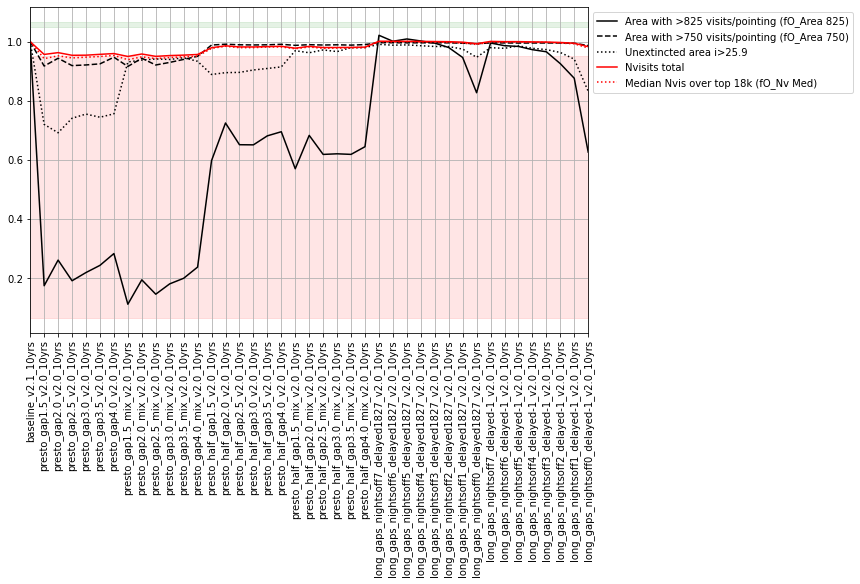

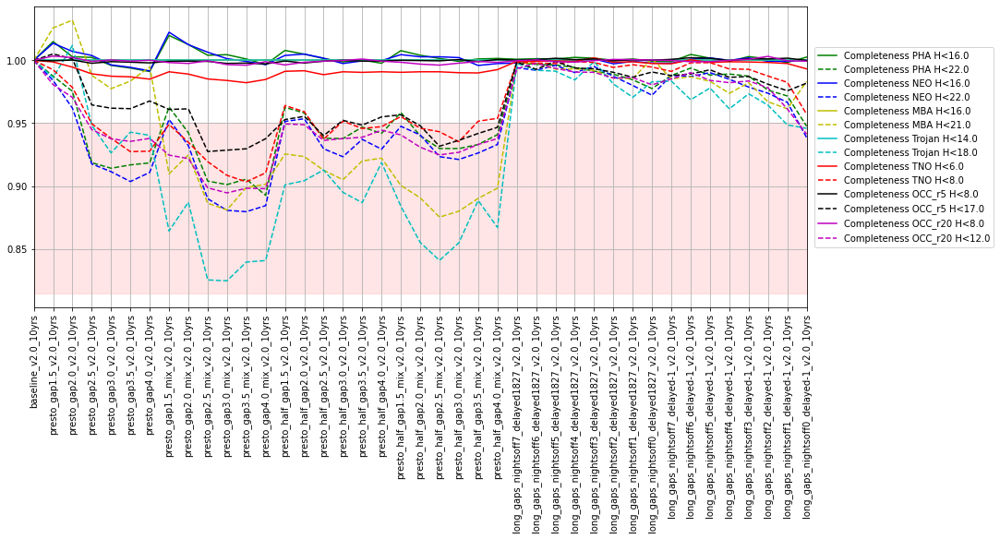

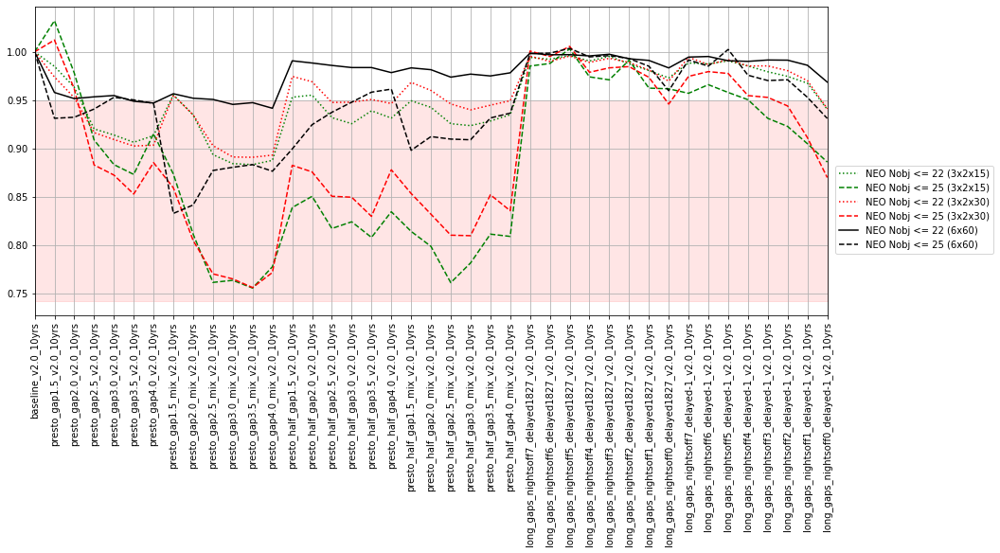

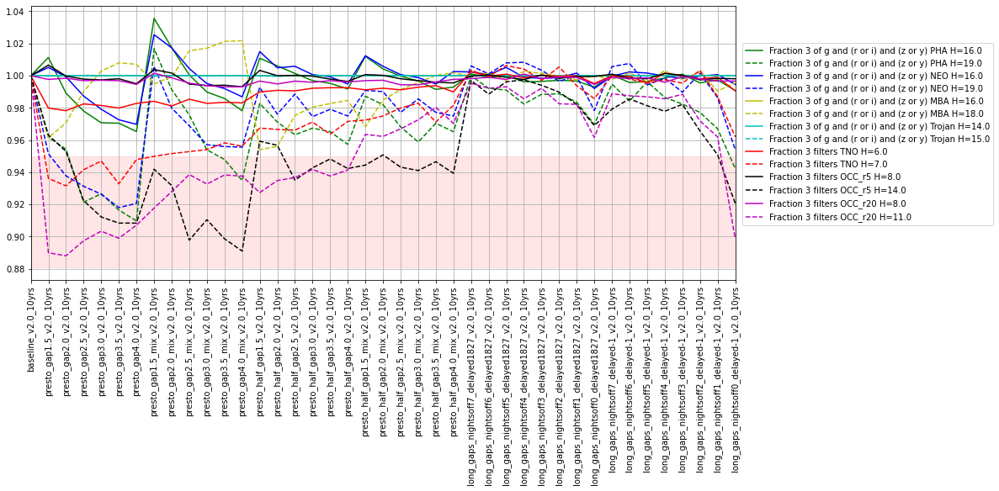

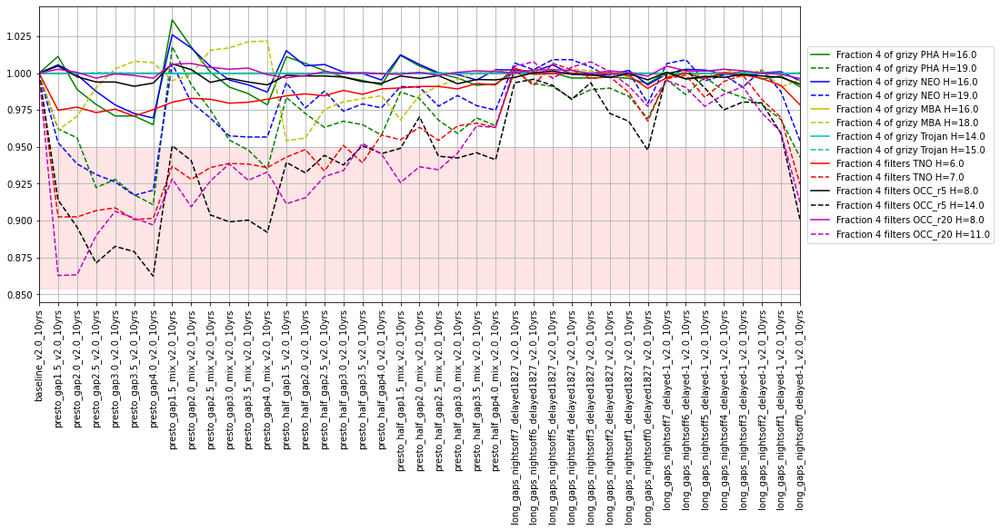

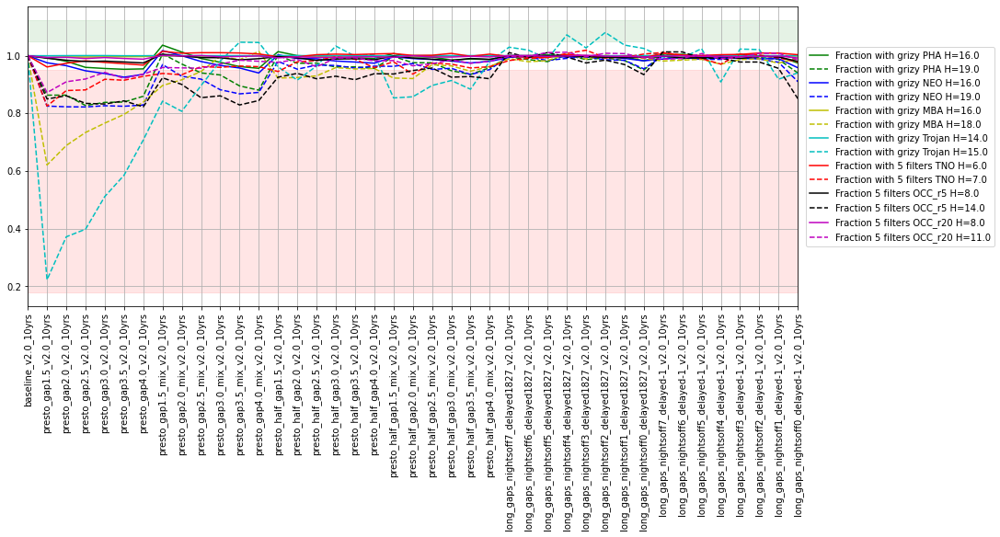

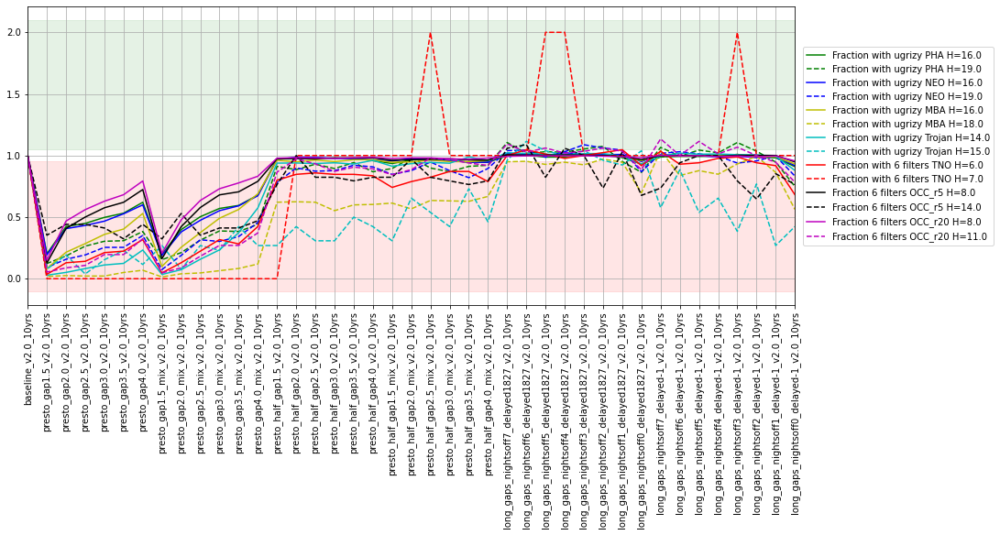

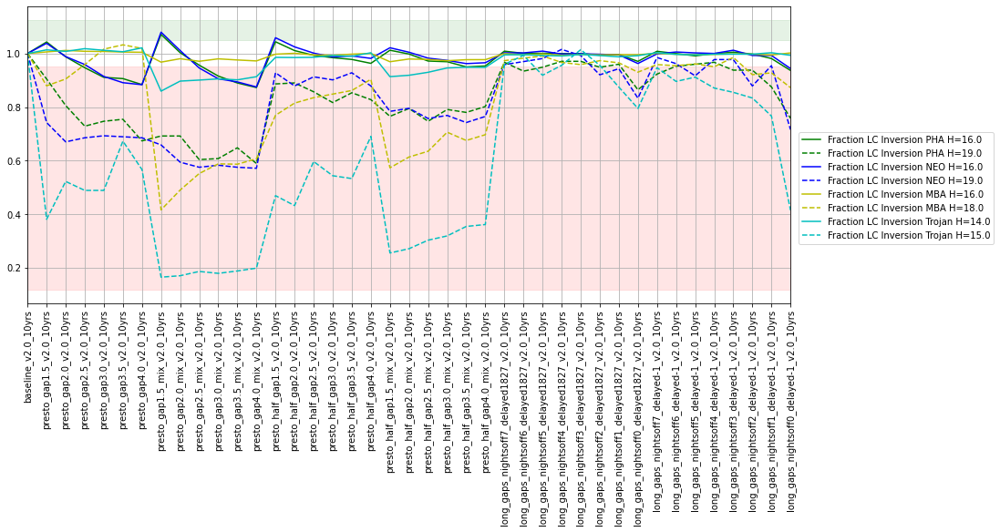

In [10]:
fam = 'triplets'
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

---
**long gaps no pairs** : The baseline survey strategy takes pairs of visits every few nights, wherethe pair is separated by about 33 minutes. The pairs are taken in mixed filters, for color measurements. These simulations extend the gap between the pair of visits, modifying it to a variable time period of between 2 to 7 hours. The pair of visits are both in the same filter, in any of griz (g+r, r+i, or i+z pairs). In some of the simulations, these long gap visits are obtained throughout the survey, while for other simulations the longer time separations do not start until year 5.  
**version**: 2.0  
**runs**:  


,brief,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band
run,,,,,,,,,,,
long_gaps_np_nightsoff7_delayed1827_v2.0_10yrs,Long gaps pairs every 7 nights starting after year 5,12520.58,16675.93,2084679.0,837.0,53.0,70.0,177.0,179.0,160.0,166.0
long_gaps_np_nightsoff6_delayed1827_v2.0_10yrs,Long gaps pairs every 6 nights starting after year 5,12443.37,16766.57,2083998.0,837.0,53.0,69.0,177.0,179.0,160.0,166.0
long_gaps_np_nightsoff5_delayed1827_v2.0_10yrs,Long gap pairs every 5 nights starting after year 5,12414.83,16655.78,2083679.0,837.0,53.0,70.0,177.0,179.0,160.0,166.0
long_gaps_np_nightsoff4_delayed1827_v2.0_10yrs,Long gap pairs every 4 nights starting after year 5,12335.94,16678.44,2082707.0,837.0,53.0,70.0,177.0,179.0,160.0,166.0
long_gaps_np_nightsoff3_delayed1827_v2.0_10yrs,Long gap pairs every 3 nights starting after year 5,12362.80,16618.85,2082329.0,837.0,53.0,70.0,177.0,179.0,160.0,165.0
long_gaps_np_nightsoff2_delayed1827_v2.0_10yrs,Long gap pairs every 2 nights starting after year 5,12073.24,16607.10,2080554.0,836.0,53.0,70.0,177.0,179.0,160.0,165.0
long_gaps_np_nightsoff1_delayed1827_v2.0_10yrs,Long gap pairs every other night starting after year 5,11339.70,16539.12,2075040.0,833.0,52.0,69.0,177.0,178.0,160.0,164.0
long_gaps_np_nightsoff0_delayed1827_v2.0_10yrs,Long gap pairs every night starting after year 5,9217.12,15952.45,2059335.0,825.0,48.0,70.0,176.0,176.0,159.0,160.0
long_gaps_np_nightsoff7_delayed-1_v2.0_10yrs,Long gaps pairs every 7 nights,12246.97,16623.89,2082384.0,837.0,53.0,69.0,177.0,179.0,160.0,166.0


metric,Completeness PHA H<16.0,Completeness PHA H<22.0,Completeness NEO H<16.0,Completeness NEO H<22.0,Completeness MBA H<16.0,Completeness MBA H<21.0,Completeness Trojan H<14.0,Completeness Trojan H<18.0,Completeness TNO H<6.0,Completeness TNO H<8.0,Completeness OCC_r5 H<8.0,Completeness OCC_r5 H<17.0,Completeness OCC_r20 H<8.0,Completeness OCC_r20 H<12.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0,0.534662,1.0,0.427171,0.695976,0.471819,0.937400,0.629774,0.853935,0.598074
long_gaps_np_nightsoff7_delayed1827_v2.0_10yrs,0.9406,0.584432,0.9314,0.571143,1.0,0.531656,1.0,0.421749,0.696165,0.471400,0.938069,0.623317,0.852200,0.591533
long_gaps_np_nightsoff6_delayed1827_v2.0_10yrs,0.9392,0.582092,0.9302,0.570255,1.0,0.531766,1.0,0.421755,0.695805,0.472795,0.937200,0.629153,0.853535,0.593120
long_gaps_np_nightsoff5_delayed1827_v2.0_10yrs,0.9378,0.581347,0.9294,0.570071,1.0,0.534389,1.0,0.426139,0.695404,0.471910,0.937135,0.624379,0.852935,0.593268
long_gaps_np_nightsoff4_delayed1827_v2.0_10yrs,0.9394,0.580846,0.9300,0.569868,1.0,0.529861,1.0,0.421378,0.695987,0.470337,0.937335,0.625027,0.854000,0.590593
long_gaps_np_nightsoff3_delayed1827_v2.0_10yrs,0.9394,0.580839,0.9282,0.568076,1.0,0.529994,1.0,0.425889,0.694365,0.470542,0.937400,0.625511,0.853800,0.590739
long_gaps_np_nightsoff2_delayed1827_v2.0_10yrs,0.9384,0.579987,0.9292,0.565355,1.0,0.528902,1.0,0.420311,0.695375,0.471464,0.936535,0.622175,0.852800,0.589860
long_gaps_np_nightsoff1_delayed1827_v2.0_10yrs,0.9412,0.573136,0.9310,0.557841,1.0,0.522116,1.0,0.414874,0.694946,0.469958,0.936800,0.618306,0.852600,0.587411
long_gaps_np_nightsoff0_delayed1827_v2.0_10yrs,0.9360,0.562478,0.9282,0.546030,1.0,0.525946,1.0,0.410816,0.694403,0.468116,0.937600,0.609893,0.855000,0.580878


metric,NEO Nobj <= 22 (3x2x15),NEO Nobj <= 25 (3x2x15),NEO Nobj <= 22 (3x2x30),NEO Nobj <= 25 (3x2x30),NEO Nobj <= 22 (6x60),NEO Nobj <= 25 (6x60)
run,,,,,,
baseline_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
long_gaps_np_nightsoff7_delayed1827_v2.0_10yrs,15555.918652,56424.913486,16769.705269,64778.204918,18934.728734,94582.856848
long_gaps_np_nightsoff6_delayed1827_v2.0_10yrs,15532.426777,55988.560399,16727.041426,64785.635914,18872.110397,94680.309301
long_gaps_np_nightsoff5_delayed1827_v2.0_10yrs,15527.272541,56478.495806,16746.510956,65310.397366,18911.839404,94133.178498
long_gaps_np_nightsoff4_delayed1827_v2.0_10yrs,15521.525712,56853.219036,16683.897405,65209.916819,18878.706009,95118.220097
long_gaps_np_nightsoff3_delayed1827_v2.0_10yrs,15472.770973,55963.701493,16663.160598,64744.690695,18830.795519,94036.370631
long_gaps_np_nightsoff2_delayed1827_v2.0_10yrs,15402.690995,55714.703612,16587.053264,64217.916513,18777.056276,92846.634904
long_gaps_np_nightsoff1_delayed1827_v2.0_10yrs,15205.109206,53559.147451,16409.920138,62339.388942,18774.751015,93098.039807
long_gaps_np_nightsoff0_delayed1827_v2.0_10yrs,14891.602589,52226.946702,16068.704488,60199.427557,18542.171441,90738.777592


metric,Fraction 3 of g and (r or i) and (z or y) PHA H=16.0,Fraction 3 of g and (r or i) and (z or y) PHA H=19.0,Fraction 3 of g and (r or i) and (z or y) NEO H=16.0,Fraction 3 of g and (r or i) and (z or y) NEO H=19.0,Fraction 3 of g and (r or i) and (z or y) MBA H=16.0,Fraction 3 of g and (r or i) and (z or y) MBA H=18.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=14.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=15.0,Fraction 3 filters TNO H=6.0,Fraction 3 filters TNO H=7.0,Fraction 3 filters OCC_r5 H=8.0,Fraction 3 filters OCC_r5 H=14.0,Fraction 3 filters OCC_r20 H=8.0,Fraction 3 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0000,0.901780,1.0,0.9996,0.6168,0.4794,0.8478,0.4718,0.7804,0.6418
long_gaps_np_nightsoff7_delayed1827_v2.0_10yrs,0.8452,0.5292,0.8546,0.5258,1.0000,0.904781,1.0,0.9998,0.6164,0.4804,0.8466,0.4686,0.7788,0.6376
long_gaps_np_nightsoff6_delayed1827_v2.0_10yrs,0.8462,0.5300,0.8554,0.5274,1.0000,0.901780,1.0,0.9996,0.6164,0.4786,0.8488,0.4726,0.7788,0.6390
long_gaps_np_nightsoff5_delayed1827_v2.0_10yrs,0.8460,0.5302,0.8564,0.5252,1.0000,0.901580,1.0,0.9998,0.6176,0.4818,0.8470,0.4714,0.7784,0.6338
long_gaps_np_nightsoff4_delayed1827_v2.0_10yrs,0.8468,0.5278,0.8550,0.5218,1.0000,0.902380,1.0,0.9998,0.6164,0.4764,0.8482,0.4710,0.7792,0.6354
long_gaps_np_nightsoff3_delayed1827_v2.0_10yrs,0.8458,0.5300,0.8564,0.5232,1.0000,0.904581,1.0,0.9996,0.6168,0.4798,0.8466,0.4654,0.7778,0.6366
long_gaps_np_nightsoff2_delayed1827_v2.0_10yrs,0.8458,0.5266,0.8538,0.5236,1.0000,0.903381,1.0,0.9998,0.6166,0.4814,0.8464,0.4636,0.7792,0.6334
long_gaps_np_nightsoff1_delayed1827_v2.0_10yrs,0.8422,0.5178,0.8512,0.5226,1.0000,0.901580,1.0,0.9996,0.6152,0.4784,0.8474,0.4622,0.7804,0.6274
long_gaps_np_nightsoff0_delayed1827_v2.0_10yrs,0.8348,0.5092,0.8468,0.5062,1.0000,0.905381,1.0,0.9998,0.6122,0.4686,0.8444,0.4498,0.7772,0.6122


metric,Fraction 4 of grizy PHA H=16.0,Fraction 4 of grizy PHA H=19.0,Fraction 4 of grizy NEO H=16.0,Fraction 4 of grizy NEO H=19.0,Fraction 4 of grizy MBA H=16.0,Fraction 4 of grizy MBA H=18.0,Fraction 4 of grizy Trojan H=14.0,Fraction 4 of grizy Trojan H=15.0,Fraction 4 filters TNO H=6.0,Fraction 4 filters TNO H=7.0,Fraction 4 filters OCC_r5 H=8.0,Fraction 4 filters OCC_r5 H=14.0,Fraction 4 filters OCC_r20 H=8.0,Fraction 4 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0000,0.901780,1.0,0.9996,0.5978,0.4248,0.8302,0.3372,0.7608,0.3906
long_gaps_np_nightsoff7_delayed1827_v2.0_10yrs,0.8446,0.5286,0.8546,0.5248,1.0000,0.904781,1.0,0.9998,0.5986,0.4262,0.8284,0.3336,0.7634,0.3922
long_gaps_np_nightsoff6_delayed1827_v2.0_10yrs,0.8462,0.5294,0.8548,0.5270,1.0000,0.901780,1.0,0.9996,0.5976,0.4252,0.8284,0.3340,0.7624,0.3876
long_gaps_np_nightsoff5_delayed1827_v2.0_10yrs,0.8454,0.5296,0.8562,0.5240,1.0000,0.901580,1.0,0.9998,0.5990,0.4256,0.8292,0.3340,0.7628,0.3888
long_gaps_np_nightsoff4_delayed1827_v2.0_10yrs,0.8464,0.5272,0.8550,0.5214,1.0000,0.902380,1.0,0.9998,0.5960,0.4174,0.8298,0.3356,0.7602,0.3856
long_gaps_np_nightsoff3_delayed1827_v2.0_10yrs,0.8454,0.5292,0.8562,0.5226,1.0000,0.904381,1.0,0.9996,0.5968,0.4254,0.8296,0.3348,0.7610,0.3884
long_gaps_np_nightsoff2_delayed1827_v2.0_10yrs,0.8454,0.5256,0.8534,0.5222,1.0000,0.903181,1.0,0.9998,0.5960,0.4252,0.8288,0.3304,0.7632,0.3860
long_gaps_np_nightsoff1_delayed1827_v2.0_10yrs,0.8416,0.5170,0.8510,0.5218,1.0000,0.901580,1.0,0.9996,0.5942,0.4198,0.8274,0.3276,0.7616,0.3842
long_gaps_np_nightsoff0_delayed1827_v2.0_10yrs,0.8342,0.5078,0.8466,0.5056,1.0000,0.905381,1.0,0.9998,0.5912,0.4070,0.8246,0.3134,0.7570,0.3750


metric,Fraction with grizy PHA H=16.0,Fraction with grizy PHA H=19.0,Fraction with grizy NEO H=16.0,Fraction with grizy NEO H=19.0,Fraction with grizy MBA H=16.0,Fraction with grizy MBA H=18.0,Fraction with grizy Trojan H=14.0,Fraction with grizy Trojan H=15.0,Fraction with 5 filters TNO H=6.0,Fraction with 5 filters TNO H=7.0,Fraction 5 filters OCC_r5 H=8.0,Fraction 5 filters OCC_r5 H=14.0,Fraction 5 filters OCC_r20 H=8.0,Fraction 5 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786,0.7554,0.1826,0.6998,0.1658
long_gaps_np_nightsoff7_delayed1827_v2.0_10yrs,0.7222,0.3108,0.7506,0.3244,0.995999,0.420884,0.9992,0.5508,0.4034,0.1812,0.7546,0.1808,0.7006,0.1644
long_gaps_np_nightsoff6_delayed1827_v2.0_10yrs,0.7186,0.3072,0.7536,0.3228,0.995999,0.429886,0.9992,0.5700,0.4044,0.1790,0.7518,0.1792,0.6972,0.1658
long_gaps_np_nightsoff5_delayed1827_v2.0_10yrs,0.7196,0.3116,0.7490,0.3186,0.995199,0.424085,0.9992,0.5498,0.4012,0.1788,0.7560,0.1832,0.6998,0.1648
long_gaps_np_nightsoff4_delayed1827_v2.0_10yrs,0.7222,0.3102,0.7486,0.3220,0.996199,0.426685,0.9994,0.5798,0.4016,0.1788,0.7530,0.1806,0.6988,0.1652
long_gaps_np_nightsoff3_delayed1827_v2.0_10yrs,0.7200,0.3060,0.7486,0.3266,0.995799,0.422084,0.9992,0.5584,0.4016,0.1804,0.7538,0.1806,0.6990,0.1664
long_gaps_np_nightsoff2_delayed1827_v2.0_10yrs,0.7188,0.3034,0.7452,0.3174,0.995799,0.428886,0.9992,0.5646,0.4064,0.1802,0.7528,0.1796,0.6982,0.1640
long_gaps_np_nightsoff1_delayed1827_v2.0_10yrs,0.7154,0.3034,0.7450,0.3180,0.995599,0.427085,0.9992,0.6006,0.4038,0.1790,0.7524,0.1732,0.6960,0.1662
long_gaps_np_nightsoff0_delayed1827_v2.0_10yrs,0.6964,0.2888,0.7352,0.2994,0.995599,0.428886,0.9996,0.5874,0.4006,0.1804,0.7472,0.1692,0.6946,0.1638


metric,Fraction with ugrizy PHA H=16.0,Fraction with ugrizy PHA H=19.0,Fraction with ugrizy NEO H=16.0,Fraction with ugrizy NEO H=19.0,Fraction with ugrizy MBA H=16.0,Fraction with ugrizy MBA H=18.0,Fraction with ugrizy Trojan H=14.0,Fraction with ugrizy Trojan H=15.0,Fraction with 6 filters TNO H=6.0,Fraction with 6 filters TNO H=7.0,Fraction 6 filters OCC_r5 H=8.0,Fraction 6 filters OCC_r5 H=14.0,Fraction 6 filters OCC_r20 H=8.0,Fraction 6 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,0.0002,0.5992,0.0068,0.6104,0.0296
long_gaps_np_nightsoff7_delayed1827_v2.0_10yrs,0.4470,0.0470,0.4684,0.0474,0.894379,0.052611,0.9358,0.0050,0.0160,0.0002,0.6024,0.0066,0.6092,0.0308
long_gaps_np_nightsoff6_delayed1827_v2.0_10yrs,0.4408,0.0450,0.4696,0.0460,0.897780,0.047009,0.9272,0.0050,0.0166,0.0002,0.5964,0.0070,0.6078,0.0312
long_gaps_np_nightsoff5_delayed1827_v2.0_10yrs,0.4488,0.0478,0.4662,0.0474,0.891178,0.053811,0.9420,0.0052,0.0164,0.0002,0.5976,0.0056,0.6056,0.0294
long_gaps_np_nightsoff4_delayed1827_v2.0_10yrs,0.4454,0.0482,0.4634,0.0466,0.894379,0.056011,0.9316,0.0048,0.0172,0.0002,0.5970,0.0060,0.6070,0.0328
long_gaps_np_nightsoff3_delayed1827_v2.0_10yrs,0.4430,0.0464,0.4656,0.0462,0.890778,0.051610,0.9398,0.0044,0.0176,0.0004,0.5970,0.0058,0.6082,0.0282
long_gaps_np_nightsoff2_delayed1827_v2.0_10yrs,0.4362,0.0430,0.4644,0.0472,0.885977,0.048810,0.9332,0.0052,0.0162,0.0002,0.5998,0.0068,0.6050,0.0284
long_gaps_np_nightsoff1_delayed1827_v2.0_10yrs,0.4234,0.0452,0.4564,0.0412,0.875375,0.050810,0.9172,0.0048,0.0164,0.0002,0.5890,0.0058,0.6014,0.0280
long_gaps_np_nightsoff0_delayed1827_v2.0_10yrs,0.3860,0.0358,0.4160,0.0380,0.833967,0.037407,0.8238,0.0042,0.0140,0.0002,0.5572,0.0042,0.5828,0.0218


metric,Fraction LC Inversion PHA H=16.0,Fraction LC Inversion PHA H=19.0,Fraction LC Inversion NEO H=16.0,Fraction LC Inversion NEO H=19.0,Fraction LC Inversion MBA H=16.0,Fraction LC Inversion MBA H=18.0,Fraction LC Inversion Trojan H=14.0,Fraction LC Inversion Trojan H=15.0
run,,,,,,,,
baseline_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
long_gaps_np_nightsoff7_delayed1827_v2.0_10yrs,0.4672,0.0508,0.4826,0.0512,0.945589,0.149630,0.9318,0.1100
long_gaps_np_nightsoff6_delayed1827_v2.0_10yrs,0.4684,0.0512,0.4772,0.0514,0.944389,0.145829,0.9284,0.1032
long_gaps_np_nightsoff5_delayed1827_v2.0_10yrs,0.4676,0.0510,0.4794,0.0508,0.946389,0.146429,0.9368,0.1080
long_gaps_np_nightsoff4_delayed1827_v2.0_10yrs,0.4612,0.0506,0.4786,0.0522,0.941388,0.145629,0.9374,0.1084
long_gaps_np_nightsoff3_delayed1827_v2.0_10yrs,0.4644,0.0512,0.4776,0.0502,0.944389,0.147429,0.9386,0.1108
long_gaps_np_nightsoff2_delayed1827_v2.0_10yrs,0.4640,0.0512,0.4786,0.0478,0.943389,0.143429,0.9272,0.1046
long_gaps_np_nightsoff1_delayed1827_v2.0_10yrs,0.4604,0.0500,0.4742,0.0480,0.941388,0.138228,0.9168,0.0920
long_gaps_np_nightsoff0_delayed1827_v2.0_10yrs,0.4432,0.0458,0.4576,0.0436,0.945389,0.140628,0.9184,0.0784


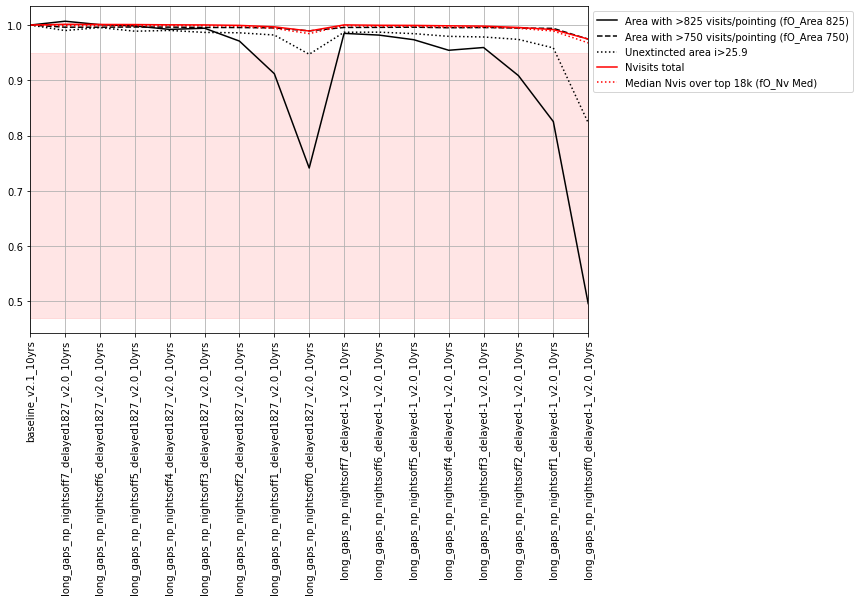

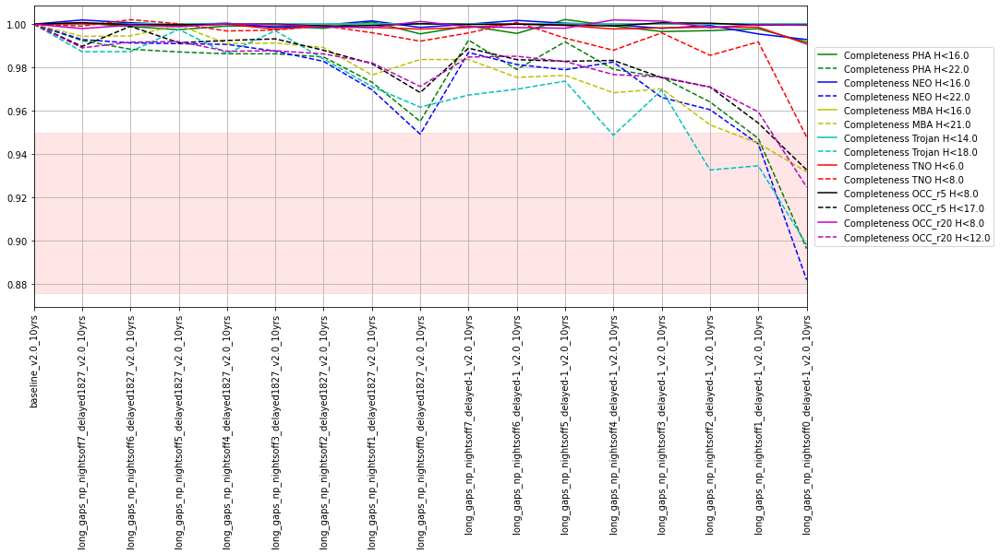

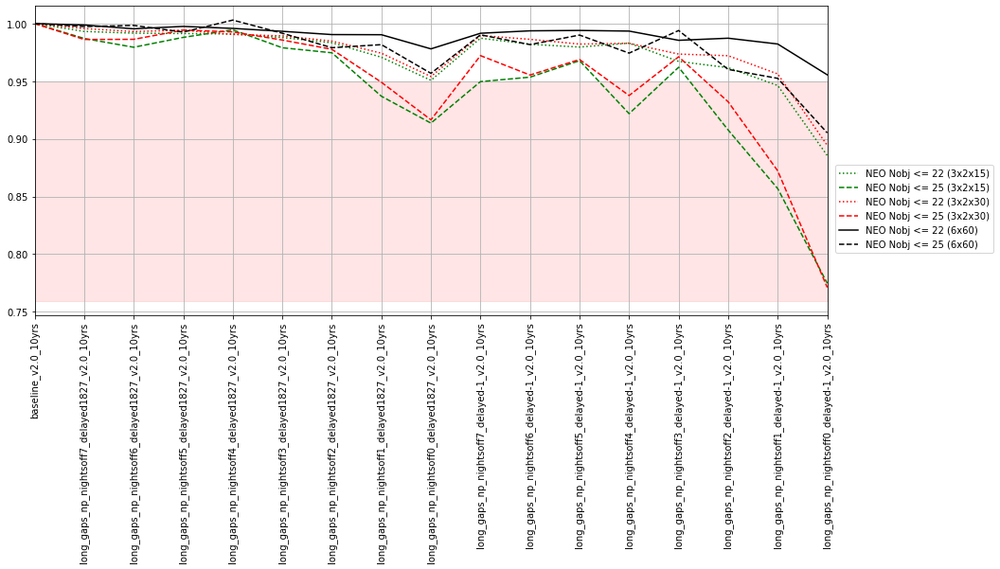

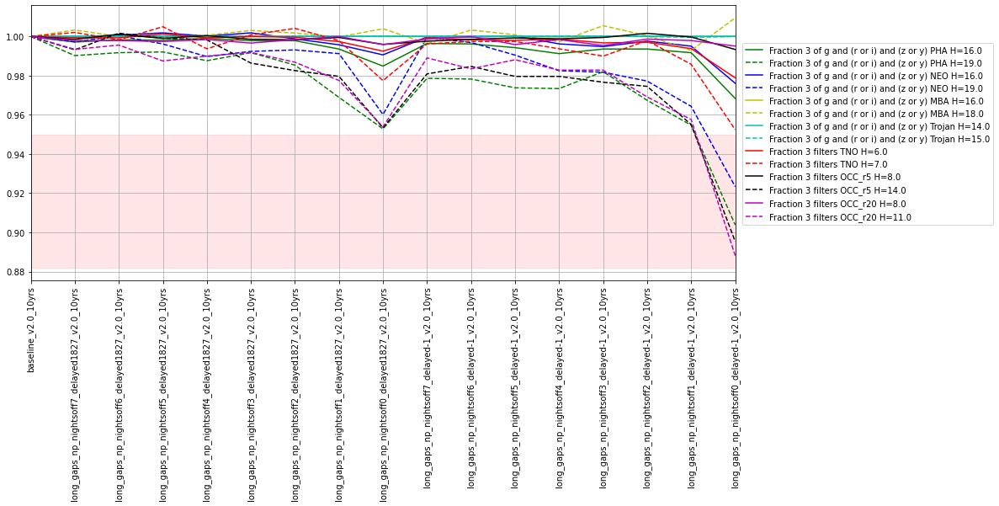

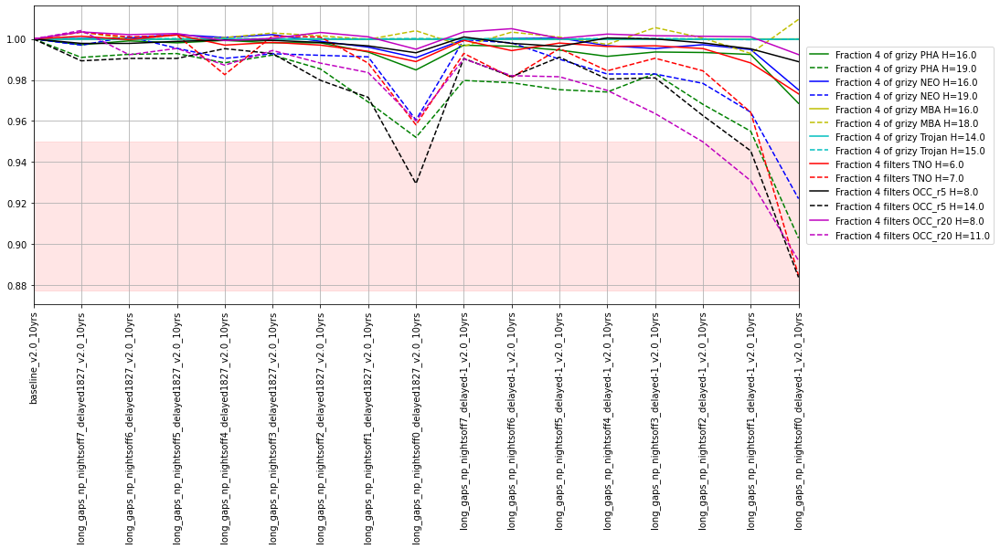

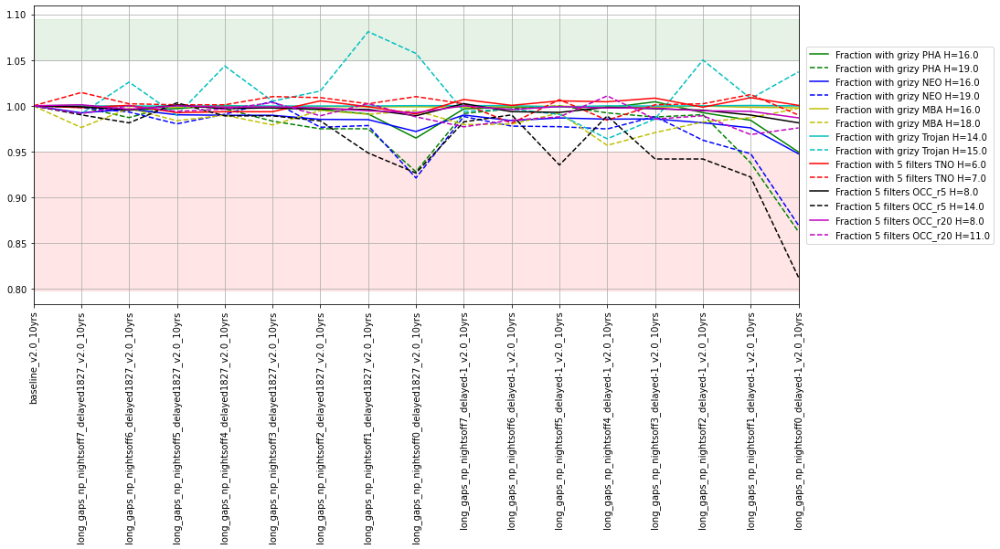

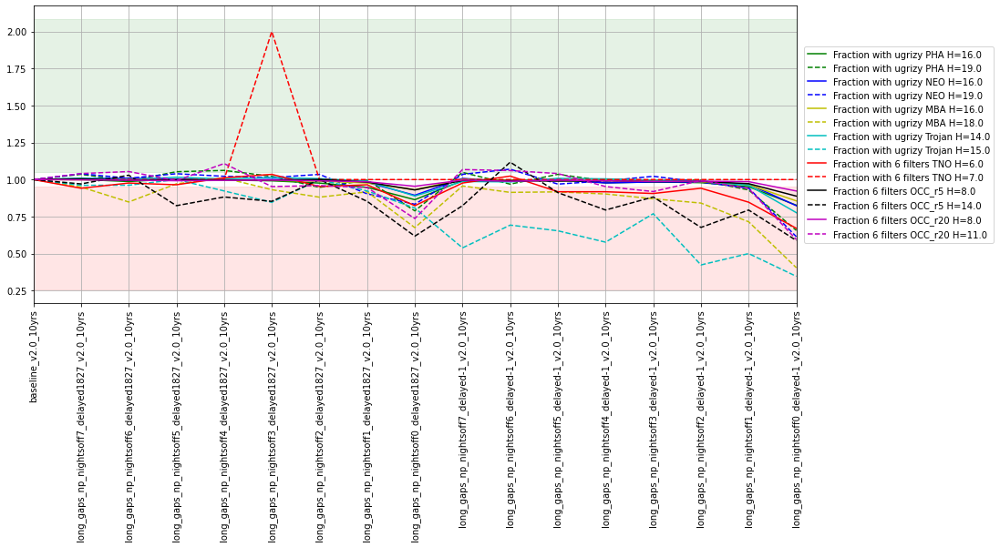

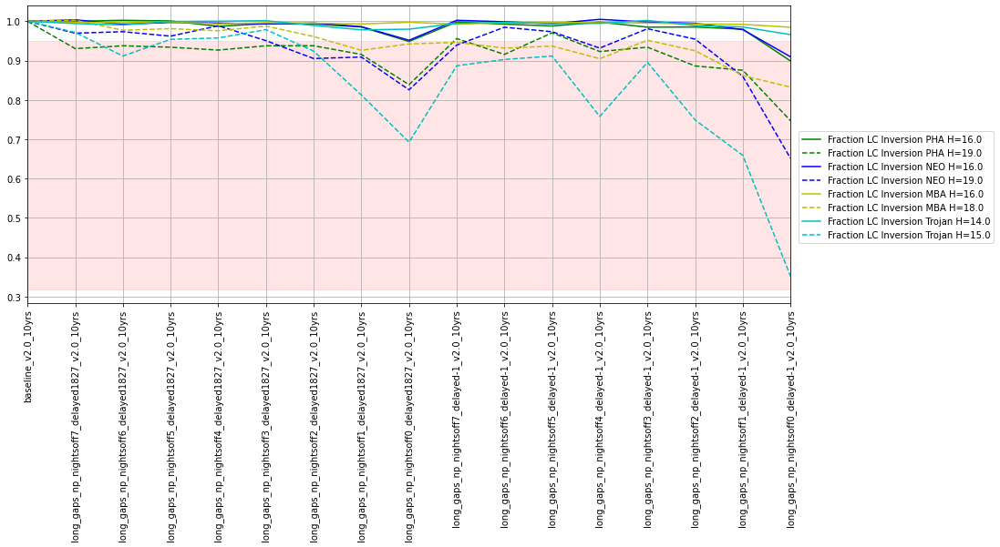

In [11]:
fam = 'long gaps no pairs'
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

---
**bluer balance** : The standard filter balance in the dust-free WFD in the baseline is {'u': 0.07, 'g': 0.09, 'r': 0.22, 'i': 0.22, 'z': 0.20, 'y': 0.20}. These simulations vary the filter balance, skewing it bluer. One simulation adds visits to g band,while the other adds visits to both u and g band, in each case by taking some visits from rizy.  
**version**: 2.0  
**runs**:  


,brief,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band
run,,,,,,,,,,,
bluer_indx0_v2.0_10yrs,"More g - filter ratio in WFD of {'u': 0.07, 'g': 0.12, 'r': 0.21, 'i': 0.21, 'z': 0.19, 'y': 0.20}",12849.59,16155.56,2088051.0,839.0,53.0,94.0,170.0,171.0,152.0,166.0
bluer_indx1_v2.0_10yrs,"More u and g - filter ratio in WFD of {'u': 0.08, 'g': 0.11, 'r': 0.21, 'i': 0.21, 'z': 0.19, 'y': 0.20}",12876.44,16210.12,2089107.0,839.0,61.0,86.0,170.0,171.0,152.0,167.0


---
**longer u visits** : The baseline survey uses 2x15s visits for all bands except u band. In the baseline, u band visits are 1x30s to reduce the effects of readnoise (which are most extreme in u, due to the low sky-background). These simulations extend the u band visit time further, to 1x50s. In one simulation, the total amount of survey time spent on u band is kept the same, so the number of visits is reduced accordingly. In the other simulation, more survey time is spent in u band in order to maintain the number of visits in u.  
**version**: 2.0  
**runs**:  


,brief,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band
run,,,,,,,,,,,
long_u1_v2.0_10yrs,"u band visits 1x50s, number of u visits same as baseline",17197.97,16420.78,2021286.0,866.0,52.0,67.0,171.0,174.0,155.0,161.0
long_u2_v2.0_10yrs,"u band visits 1x50s, fewer number of u visits",15840.83,16687.68,2040731.0,854.0,33.0,70.0,177.0,181.0,160.0,167.0


metric,Completeness PHA H<16.0,Completeness PHA H<22.0,Completeness NEO H<16.0,Completeness NEO H<22.0,Completeness MBA H<16.0,Completeness MBA H<21.0,Completeness Trojan H<14.0,Completeness Trojan H<18.0,Completeness TNO H<6.0,Completeness TNO H<8.0,Completeness OCC_r5 H<8.0,Completeness OCC_r5 H<17.0,Completeness OCC_r20 H<8.0,Completeness OCC_r20 H<12.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0,0.534662,1.0,0.427171,0.695976,0.471819,0.937400,0.629774,0.853935,0.598074
bluer_indx0_v2.0_10yrs,0.9380,0.590270,0.9288,0.571974,1.0,0.529990,1.0,0.420473,0.693743,0.465246,0.937535,0.630838,0.854735,0.595225
bluer_indx1_v2.0_10yrs,0.9410,0.586656,0.9280,0.566670,1.0,0.526093,1.0,0.412282,0.696328,0.468987,0.938400,0.628115,0.856400,0.596102
long_u1_v2.0_10yrs,0.9378,0.585145,0.9282,0.567217,1.0,0.529677,1.0,0.423776,0.695451,0.468040,0.939000,0.627534,0.854000,0.592482
long_u2_v2.0_10yrs,0.9394,0.593225,0.9314,0.581446,1.0,0.541587,1.0,0.434640,0.695742,0.472711,0.938800,0.635834,0.853400,0.599750


metric,NEO Nobj <= 22 (3x2x15),NEO Nobj <= 25 (3x2x15),NEO Nobj <= 22 (3x2x30),NEO Nobj <= 25 (3x2x30),NEO Nobj <= 22 (6x60),NEO Nobj <= 25 (6x60)
run,,,,,,
baseline_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
bluer_indx0_v2.0_10yrs,15575.900376,55903.214620,16762.139914,65140.937058,18865.744086,95134.740554
bluer_indx1_v2.0_10yrs,15435.916072,56724.696641,16670.104670,65741.832190,18780.309096,94316.911140
long_u1_v2.0_10yrs,15450.215213,55053.972146,16737.619544,64958.607071,18794.360682,92023.466321
long_u2_v2.0_10yrs,15827.549455,58292.285358,16932.764309,67218.080620,18905.826910,94587.754098


metric,Fraction 3 of g and (r or i) and (z or y) PHA H=16.0,Fraction 3 of g and (r or i) and (z or y) PHA H=19.0,Fraction 3 of g and (r or i) and (z or y) NEO H=16.0,Fraction 3 of g and (r or i) and (z or y) NEO H=19.0,Fraction 3 of g and (r or i) and (z or y) MBA H=16.0,Fraction 3 of g and (r or i) and (z or y) MBA H=18.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=14.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=15.0,Fraction 3 filters TNO H=6.0,Fraction 3 filters TNO H=7.0,Fraction 3 filters OCC_r5 H=8.0,Fraction 3 filters OCC_r5 H=14.0,Fraction 3 filters OCC_r20 H=8.0,Fraction 3 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0,0.901780,1.0,0.9996,0.6168,0.4794,0.8478,0.4718,0.7804,0.6418
bluer_indx0_v2.0_10yrs,0.8484,0.5454,0.8614,0.5484,1.0,0.901580,1.0,0.9998,0.6178,0.4804,0.8472,0.4602,0.7782,0.6472
bluer_indx1_v2.0_10yrs,0.8456,0.5398,0.8546,0.5398,1.0,0.899980,1.0,0.9994,0.6190,0.4776,0.8472,0.4590,0.7798,0.6446
long_u1_v2.0_10yrs,0.8392,0.5116,0.8506,0.5184,1.0,0.894779,1.0,0.9996,0.6154,0.4746,0.8436,0.4534,0.7768,0.6294
long_u2_v2.0_10yrs,0.8478,0.5342,0.8566,0.5356,1.0,0.900380,1.0,0.9998,0.6166,0.4798,0.8478,0.4676,0.7796,0.6400


metric,Fraction 4 of grizy PHA H=16.0,Fraction 4 of grizy PHA H=19.0,Fraction 4 of grizy NEO H=16.0,Fraction 4 of grizy NEO H=19.0,Fraction 4 of grizy MBA H=16.0,Fraction 4 of grizy MBA H=18.0,Fraction 4 of grizy Trojan H=14.0,Fraction 4 of grizy Trojan H=15.0,Fraction 4 filters TNO H=6.0,Fraction 4 filters TNO H=7.0,Fraction 4 filters OCC_r5 H=8.0,Fraction 4 filters OCC_r5 H=14.0,Fraction 4 filters OCC_r20 H=8.0,Fraction 4 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0,0.901780,1.0,0.9996,0.5978,0.4248,0.8302,0.3372,0.7608,0.3906
bluer_indx0_v2.0_10yrs,0.8476,0.5442,0.8598,0.5474,1.0,0.901580,1.0,0.9998,0.5990,0.4260,0.8306,0.3482,0.7618,0.3908
bluer_indx1_v2.0_10yrs,0.8452,0.5390,0.8538,0.5388,1.0,0.899980,1.0,0.9994,0.5990,0.4250,0.8286,0.3406,0.7618,0.3892
long_u1_v2.0_10yrs,0.8392,0.5110,0.8502,0.5182,1.0,0.894779,1.0,0.9996,0.5962,0.4184,0.8250,0.3218,0.7592,0.3832
long_u2_v2.0_10yrs,0.8478,0.5340,0.8564,0.5356,1.0,0.900380,1.0,0.9998,0.5992,0.4230,0.8294,0.3360,0.7622,0.3876


metric,Fraction with grizy PHA H=16.0,Fraction with grizy PHA H=19.0,Fraction with grizy NEO H=16.0,Fraction with grizy NEO H=19.0,Fraction with grizy MBA H=16.0,Fraction with grizy MBA H=18.0,Fraction with grizy Trojan H=14.0,Fraction with grizy Trojan H=15.0,Fraction with 5 filters TNO H=6.0,Fraction with 5 filters TNO H=7.0,Fraction 5 filters OCC_r5 H=8.0,Fraction 5 filters OCC_r5 H=14.0,Fraction 5 filters OCC_r20 H=8.0,Fraction 5 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786,0.7554,0.1826,0.6998,0.1658
bluer_indx0_v2.0_10yrs,0.7522,0.3392,0.7790,0.3456,0.995199,0.428286,0.9998,0.5666,0.4030,0.1792,0.7686,0.2258,0.7088,0.1702
bluer_indx1_v2.0_10yrs,0.7424,0.3278,0.7678,0.3402,0.995599,0.419884,0.9994,0.5118,0.4042,0.1796,0.7704,0.2202,0.7076,0.1708
long_u1_v2.0_10yrs,0.7150,0.2978,0.7460,0.3084,0.994799,0.416683,0.9996,0.5144,0.4050,0.1756,0.7460,0.1688,0.6960,0.1618
long_u2_v2.0_10yrs,0.7262,0.3160,0.7588,0.3308,0.995599,0.421684,0.9992,0.5408,0.4060,0.1758,0.7472,0.1826,0.6982,0.1680


metric,Fraction with ugrizy PHA H=16.0,Fraction with ugrizy PHA H=19.0,Fraction with ugrizy NEO H=16.0,Fraction with ugrizy NEO H=19.0,Fraction with ugrizy MBA H=16.0,Fraction with ugrizy MBA H=18.0,Fraction with ugrizy Trojan H=14.0,Fraction with ugrizy Trojan H=15.0,Fraction with 6 filters TNO H=6.0,Fraction with 6 filters TNO H=7.0,Fraction 6 filters OCC_r5 H=8.0,Fraction 6 filters OCC_r5 H=14.0,Fraction 6 filters OCC_r20 H=8.0,Fraction 6 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,0.0002,0.5992,0.0068,0.6104,0.0296
bluer_indx0_v2.0_10yrs,0.4532,0.0466,0.4674,0.0464,0.897780,0.053411,0.9252,0.0030,0.0166,0.0002,0.6162,0.0068,0.6166,0.0326
bluer_indx1_v2.0_10yrs,0.5002,0.0640,0.5254,0.0614,0.924185,0.060212,0.9686,0.0054,0.0172,0.0002,0.6356,0.0122,0.6332,0.0382
long_u1_v2.0_10yrs,0.4836,0.0594,0.4956,0.0614,0.942188,0.118824,0.9926,0.1092,0.0484,0.0014,0.5904,0.0090,0.6016,0.0514
long_u2_v2.0_10yrs,0.2834,0.0222,0.2868,0.0224,0.720544,0.039208,0.9116,0.0314,0.0308,0.0008,0.4214,0.0042,0.5006,0.0178


metric,Fraction LC Inversion PHA H=16.0,Fraction LC Inversion PHA H=19.0,Fraction LC Inversion NEO H=16.0,Fraction LC Inversion NEO H=19.0,Fraction LC Inversion MBA H=16.0,Fraction LC Inversion MBA H=18.0,Fraction LC Inversion Trojan H=14.0,Fraction LC Inversion Trojan H=15.0
run,,,,,,,,
baseline_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
bluer_indx0_v2.0_10yrs,0.4524,0.0440,0.4634,0.0458,0.934787,0.135227,0.9226,0.0832
bluer_indx1_v2.0_10yrs,0.4534,0.0468,0.4652,0.0468,0.935987,0.127826,0.9168,0.0742
long_u1_v2.0_10yrs,0.4522,0.0460,0.4640,0.0462,0.935387,0.129626,0.9274,0.0894
long_u2_v2.0_10yrs,0.4654,0.0510,0.4872,0.0482,0.944389,0.147630,0.9434,0.1040


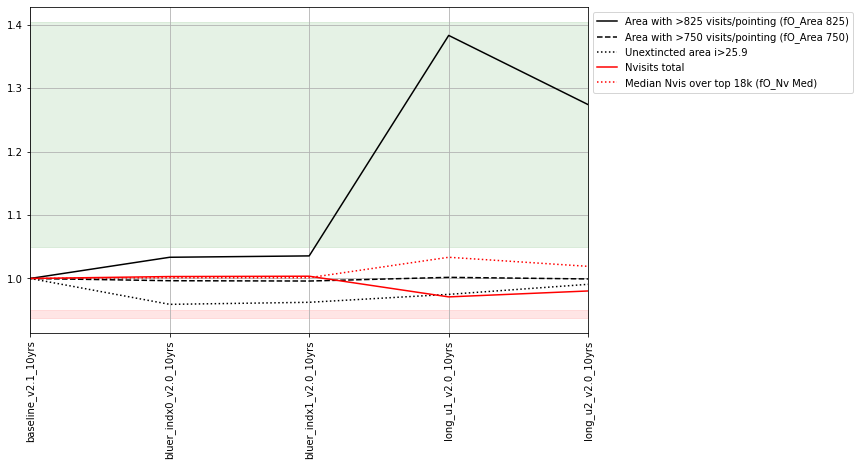

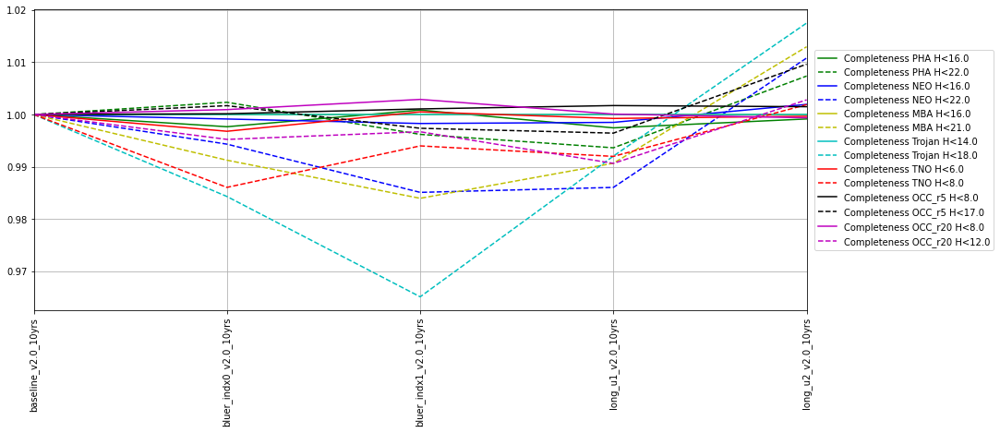

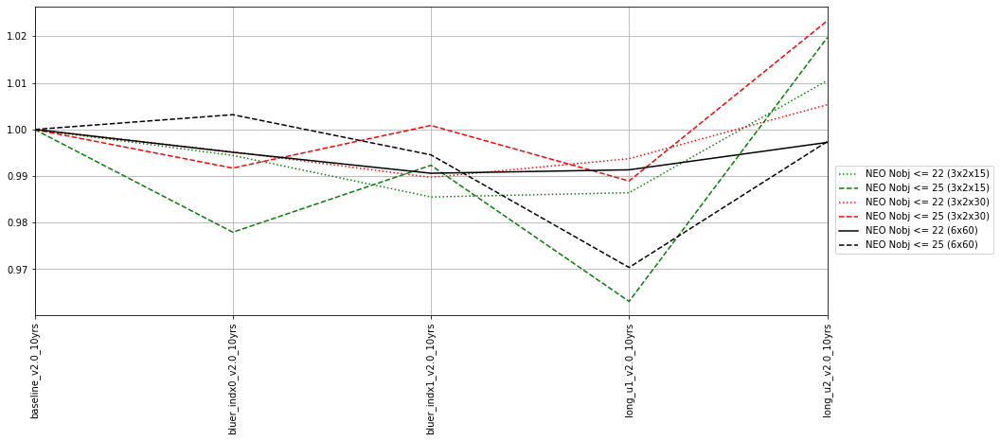

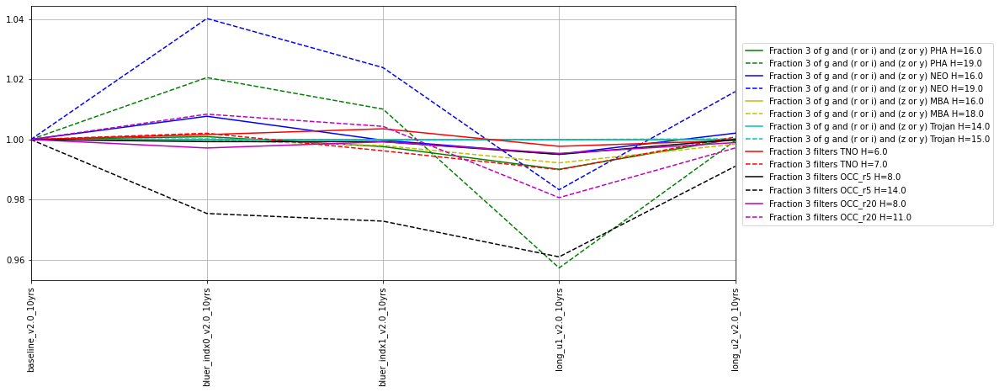

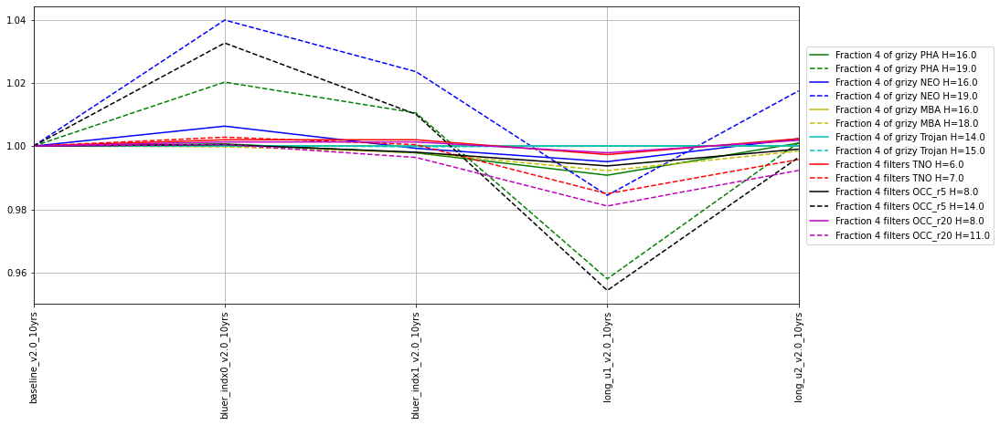

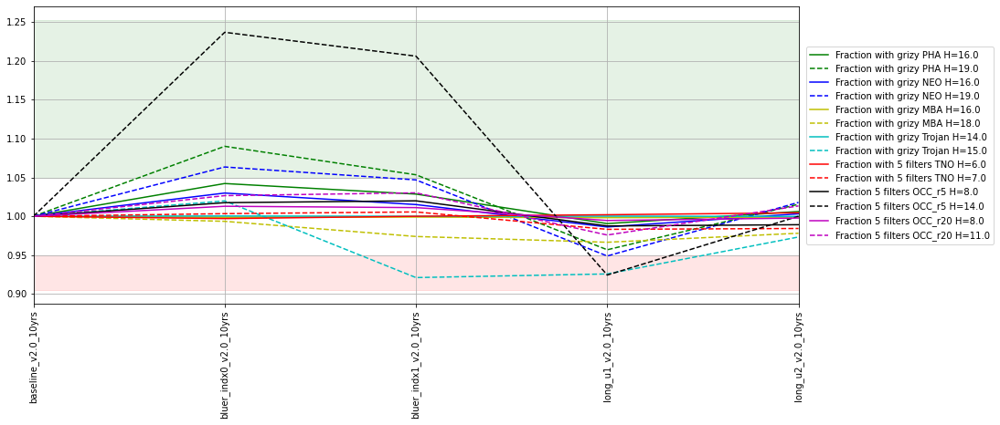

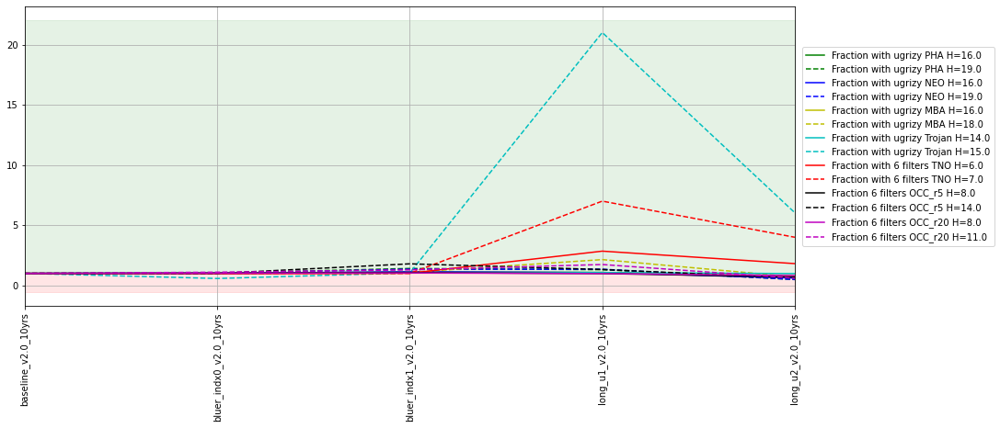

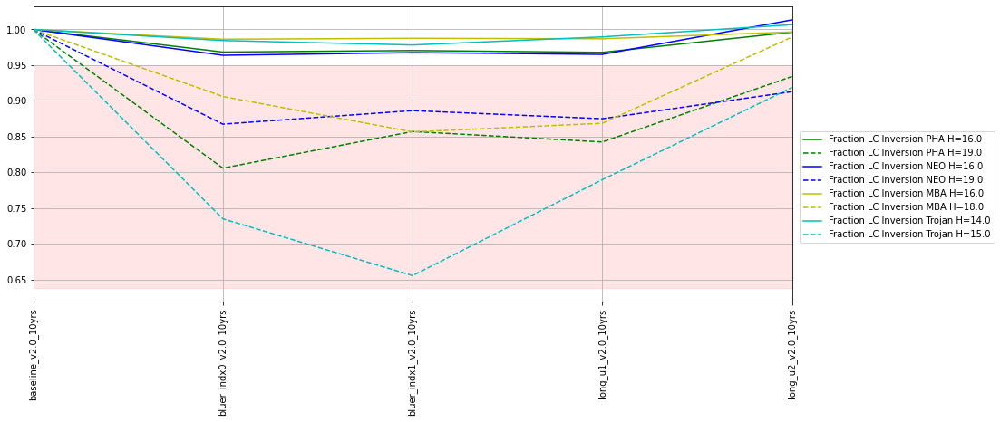

In [12]:
fam = ['bluer balance',  'longer u visits']
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

---
**vary gp** : These simulations investigate the effect of varying the amount of survey time spent on covering the background (non-WFD-level) Galactic Plane area. The baseline characteristics, including the ratio of visits over the remainder of the footprint, are kept the same.  
**version**: 2.0  
**runs**:  


,brief,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band
run,,,,,,,,,,,
vary_gp_gpfrac0.01_v2.0_10yrs,Dusty plane at 1% WFD level,16736.35,16818.61,2088147.0,861.0,55.0,71.0,182.0,185.0,165.0,171.0
vary_gp_gpfrac0.05_v2.0_10yrs,Dusty plane at 5% WFD level,16665.01,16706.14,2088534.0,861.0,55.0,71.0,182.0,185.0,164.0,171.0
vary_gp_gpfrac0.10_v2.0_10yrs,Dusty plane at 10% WFD level,16511.42,16810.21,2088477.0,859.0,55.0,71.0,182.0,185.0,164.0,170.0
vary_gp_gpfrac0.15_v2.0_10yrs,Dusty plane at 15% WFD level,15621.77,16739.71,2088838.0,853.0,54.0,71.0,181.0,183.0,163.0,169.0
vary_gp_gpfrac0.20_v2.0_10yrs,Dusty plane at 20% WFD level,14733.80,16736.35,2088077.0,847.0,54.0,70.0,179.0,182.0,162.0,168.0
vary_gp_gpfrac0.25_v2.0_10yrs,Dusty plane at 25% WFD level,13427.02,16636.48,2088389.0,841.0,54.0,70.0,178.0,181.0,161.0,167.0
vary_gp_gpfrac0.30_v2.0_10yrs,Dusty plane at 30% WFD level,11804.67,16665.01,2087314.0,834.0,54.0,69.0,176.0,179.0,160.0,166.0
vary_gp_gpfrac0.35_v2.0_10yrs,Dusty plane at 35% WFD level,9751.75,16700.26,2086873.0,827.0,53.0,69.0,174.0,177.0,158.0,165.0
vary_gp_gpfrac0.40_v2.0_10yrs,Dusty plane at 40% WFD level,7674.50,16560.94,2086160.0,820.0,53.0,70.0,173.0,176.0,156.0,163.0


---
**galactic plane footprint** : These simulations use the galactic plane priority map, contributed by LSST SMLV & TVS science collaborations, as the basis for further variations on galactic plane coverage. Instead of a "bulge area" as in the baseline and vary gp family, different levels of priority of the galactic plane map are covered at WFD levels. In addition, pencil beam fields are added or not, in various simulations.   
**version**: 2.1  
**runs**:  


,brief,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band
run,,,,,,,,,,,
plane_priority_priority1.2_pbf_v2.1_10yrs,"Select galactic plane priority map above 1.2 threshold value, without pencilbeams",6545.65,16936.11,2019424.0,815.0,53.0,67.0,174.0,176.0,155.0,160.0
plane_priority_priority0.9_pbf_v2.1_10yrs,"Select galactic plane priority map above 0.9 threshold value, without pencilbeams",5655.16,16839.59,2019086.0,811.0,53.0,67.0,174.0,176.0,154.0,159.0
plane_priority_priority0.6_pbf_v2.1_10yrs,"Select galactic plane priority map above 0.6 threshold value, without pencilbeams",2586.70,16633.96,2018906.0,795.0,51.0,65.0,171.0,172.0,152.0,155.0
plane_priority_priority0.4_pbf_v2.1_10yrs,"Select galactic plane priority map above 0.4 threshold value, without pencilbeams",604.29,16384.69,2019352.0,748.0,46.0,62.0,162.0,163.0,144.0,145.0
plane_priority_priority0.3_pbf_v2.1_10yrs,"Select galactic plane priority map above 0.3 threshold value, without pencilbeams",156.11,16008.69,2019186.0,727.0,45.0,61.0,157.0,159.0,141.0,139.0
plane_priority_priority0.2_pbf_v2.1_10yrs,"Select galactic plane priority map above 0.2 threshold value, without pencilbeams",367.61,15344.81,2018674.0,693.0,42.0,61.0,150.0,151.0,135.0,129.0
plane_priority_priority0.1_pbf_v2.1_10yrs,"Select galactic plane priority map above 0.1 threshold value, without pencilbeams",119.18,13434.57,2013032.0,646.0,37.0,89.0,140.0,140.0,127.0,51.0
plane_priority_priority1.2_pbt_v2.1_10yrs,"Select galactic plane priority map above 1.2 threshold value, with map pencilbeam fields",6545.65,16936.11,2019424.0,815.0,53.0,67.0,174.0,176.0,155.0,160.0
plane_priority_priority0.9_pbt_v2.1_10yrs,"Select galactic plane priority map above 0.9 threshold value, with map pencilbeam fields",4391.18,16814.41,2019098.0,806.0,52.0,66.0,173.0,174.0,154.0,158.0


metric,Completeness PHA H<16.0,Completeness PHA H<22.0,Completeness NEO H<16.0,Completeness NEO H<22.0,Completeness MBA H<16.0,Completeness MBA H<21.0,Completeness Trojan H<14.0,Completeness Trojan H<18.0,Completeness TNO H<6.0,Completeness TNO H<8.0,Completeness OCC_r5 H<8.0,Completeness OCC_r5 H<17.0,Completeness OCC_r20 H<8.0,Completeness OCC_r20 H<12.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0,0.534662,1.0,0.427171,0.695976,0.471819,0.937400,0.629774,0.853935,0.598074
vary_gp_gpfrac0.01_v2.0_10yrs,0.9430,0.587627,0.9316,0.574707,1.0,0.532590,1.0,0.420216,0.694629,0.470786,0.938090,0.626407,0.849600,0.593749
vary_gp_gpfrac0.05_v2.0_10yrs,0.9426,0.586857,0.9304,0.576471,1.0,0.530615,1.0,0.425146,0.695574,0.472052,0.938735,0.624909,0.851400,0.593866
vary_gp_gpfrac0.10_v2.0_10yrs,0.9448,0.588280,0.9288,0.574805,1.0,0.533930,1.0,0.426793,0.695184,0.469790,0.938200,0.629504,0.853600,0.592658
vary_gp_gpfrac0.15_v2.0_10yrs,0.9390,0.587037,0.9320,0.572491,1.0,0.530970,1.0,0.423047,0.696831,0.468749,0.940000,0.630162,0.851000,0.592051
vary_gp_gpfrac0.20_v2.0_10yrs,0.9422,0.592173,0.9300,0.573147,1.0,0.532039,1.0,0.426598,0.696912,0.472589,0.937600,0.630963,0.853600,0.596748
vary_gp_gpfrac0.25_v2.0_10yrs,0.9402,0.584509,0.9308,0.572149,1.0,0.527185,1.0,0.418841,0.695837,0.473340,0.938800,0.629347,0.852600,0.595273
vary_gp_gpfrac0.30_v2.0_10yrs,0.9404,0.588228,0.9322,0.576158,1.0,0.528298,1.0,0.416400,0.696246,0.470994,0.938400,0.628843,0.854490,0.596607
vary_gp_gpfrac0.35_v2.0_10yrs,0.9392,0.587838,0.9308,0.571671,1.0,0.527966,1.0,0.422899,0.695750,0.470669,0.939735,0.630173,0.855200,0.594031


metric,NEO Nobj <= 22 (3x2x15),NEO Nobj <= 25 (3x2x15),NEO Nobj <= 22 (3x2x30),NEO Nobj <= 25 (3x2x30),NEO Nobj <= 22 (6x60),NEO Nobj <= 25 (6x60)
run,,,,,,
baseline_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
vary_gp_gpfrac0.01_v2.0_10yrs,15649.422168,56349.382275,16765.305557,65315.252425,18792.396535,93467.714551
vary_gp_gpfrac0.05_v2.0_10yrs,15696.287286,56959.862435,16810.253077,65439.819835,18864.449936,93867.563241
vary_gp_gpfrac0.10_v2.0_10yrs,15651.248166,56666.788599,16768.939321,65389.704253,18828.757470,94750.185876
vary_gp_gpfrac0.15_v2.0_10yrs,15592.053009,55994.303546,16724.552754,65493.433682,18863.574128,93888.714009
vary_gp_gpfrac0.20_v2.0_10yrs,15608.271868,56047.967983,16803.781669,64987.905279,18929.031663,94381.022557
vary_gp_gpfrac0.25_v2.0_10yrs,15581.332823,57900.426835,16788.672233,66879.345178,18885.664586,94715.151340
vary_gp_gpfrac0.30_v2.0_10yrs,15688.616596,57685.956781,16829.540288,66791.693000,18907.710754,94782.395509
vary_gp_gpfrac0.35_v2.0_10yrs,15570.699645,56225.295362,16854.203735,65960.829739,18961.006663,96093.956766


metric,Fraction 3 of g and (r or i) and (z or y) PHA H=16.0,Fraction 3 of g and (r or i) and (z or y) PHA H=19.0,Fraction 3 of g and (r or i) and (z or y) NEO H=16.0,Fraction 3 of g and (r or i) and (z or y) NEO H=19.0,Fraction 3 of g and (r or i) and (z or y) MBA H=16.0,Fraction 3 of g and (r or i) and (z or y) MBA H=18.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=14.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=15.0,Fraction 3 filters TNO H=6.0,Fraction 3 filters TNO H=7.0,Fraction 3 filters OCC_r5 H=8.0,Fraction 3 filters OCC_r5 H=14.0,Fraction 3 filters OCC_r20 H=8.0,Fraction 3 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0000,0.901780,1.0,0.9996,0.6168,0.4794,0.8478,0.4718,0.7804,0.6418
vary_gp_gpfrac0.01_v2.0_10yrs,0.8460,0.5310,0.8566,0.5304,1.0000,0.901180,1.0,0.9996,0.6100,0.4732,0.8384,0.4654,0.7716,0.6318
vary_gp_gpfrac0.05_v2.0_10yrs,0.8446,0.5316,0.8558,0.5326,1.0000,0.902781,1.0,0.9996,0.6110,0.4736,0.8396,0.4664,0.7736,0.6290
vary_gp_gpfrac0.10_v2.0_10yrs,0.8456,0.5300,0.8544,0.5308,1.0000,0.902981,1.0,0.9996,0.6100,0.4742,0.8404,0.4666,0.7720,0.6280
vary_gp_gpfrac0.15_v2.0_10yrs,0.8472,0.5356,0.8550,0.5294,1.0000,0.902781,1.0,0.9996,0.6142,0.4734,0.8438,0.4706,0.7762,0.6322
vary_gp_gpfrac0.20_v2.0_10yrs,0.8460,0.5252,0.8568,0.5322,1.0000,0.905781,1.0,0.9998,0.6168,0.4816,0.8448,0.4660,0.7776,0.6374
vary_gp_gpfrac0.25_v2.0_10yrs,0.8474,0.5324,0.8566,0.5292,1.0000,0.902781,1.0,0.9998,0.6164,0.4788,0.8466,0.4672,0.7780,0.6344
vary_gp_gpfrac0.30_v2.0_10yrs,0.8438,0.5292,0.8550,0.5274,1.0000,0.906981,1.0,0.9998,0.6176,0.4828,0.8486,0.4712,0.7816,0.6408
vary_gp_gpfrac0.35_v2.0_10yrs,0.8440,0.5312,0.8572,0.5306,1.0000,0.903781,1.0,0.9998,0.6166,0.4794,0.8526,0.4738,0.7822,0.6422


metric,Fraction 4 of grizy PHA H=16.0,Fraction 4 of grizy PHA H=19.0,Fraction 4 of grizy NEO H=16.0,Fraction 4 of grizy NEO H=19.0,Fraction 4 of grizy MBA H=16.0,Fraction 4 of grizy MBA H=18.0,Fraction 4 of grizy Trojan H=14.0,Fraction 4 of grizy Trojan H=15.0,Fraction 4 filters TNO H=6.0,Fraction 4 filters TNO H=7.0,Fraction 4 filters OCC_r5 H=8.0,Fraction 4 filters OCC_r5 H=14.0,Fraction 4 filters OCC_r20 H=8.0,Fraction 4 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0000,0.901780,1.0,0.9996,0.5978,0.4248,0.8302,0.3372,0.7608,0.3906
vary_gp_gpfrac0.01_v2.0_10yrs,0.8452,0.5302,0.8564,0.5304,1.0000,0.901180,1.0,0.9996,0.5886,0.4204,0.8224,0.3422,0.7552,0.3886
vary_gp_gpfrac0.05_v2.0_10yrs,0.8444,0.5314,0.8558,0.5324,1.0000,0.902781,1.0,0.9996,0.5892,0.4182,0.8214,0.3404,0.7580,0.3848
vary_gp_gpfrac0.10_v2.0_10yrs,0.8456,0.5296,0.8538,0.5304,1.0000,0.902981,1.0,0.9996,0.5908,0.4178,0.8214,0.3414,0.7560,0.3854
vary_gp_gpfrac0.15_v2.0_10yrs,0.8472,0.5354,0.8544,0.5284,1.0000,0.902581,1.0,0.9996,0.5932,0.4178,0.8270,0.3408,0.7580,0.3868
vary_gp_gpfrac0.20_v2.0_10yrs,0.8454,0.5246,0.8566,0.5318,1.0000,0.905781,1.0,0.9998,0.5960,0.4212,0.8270,0.3382,0.7602,0.3864
vary_gp_gpfrac0.25_v2.0_10yrs,0.8474,0.5318,0.8566,0.5288,1.0000,0.902781,1.0,0.9998,0.5978,0.4248,0.8266,0.3358,0.7610,0.3928
vary_gp_gpfrac0.30_v2.0_10yrs,0.8438,0.5292,0.8550,0.5272,1.0000,0.906981,1.0,0.9998,0.6002,0.4276,0.8296,0.3352,0.7622,0.3928
vary_gp_gpfrac0.35_v2.0_10yrs,0.8432,0.5302,0.8566,0.5296,1.0000,0.903781,1.0,0.9998,0.5978,0.4290,0.8334,0.3386,0.7658,0.3922


metric,Fraction with grizy PHA H=16.0,Fraction with grizy PHA H=19.0,Fraction with grizy NEO H=16.0,Fraction with grizy NEO H=19.0,Fraction with grizy MBA H=16.0,Fraction with grizy MBA H=18.0,Fraction with grizy Trojan H=14.0,Fraction with grizy Trojan H=15.0,Fraction with 5 filters TNO H=6.0,Fraction with 5 filters TNO H=7.0,Fraction 5 filters OCC_r5 H=8.0,Fraction 5 filters OCC_r5 H=14.0,Fraction 5 filters OCC_r20 H=8.0,Fraction 5 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786,0.7554,0.1826,0.6998,0.1658
vary_gp_gpfrac0.01_v2.0_10yrs,0.7204,0.3122,0.7508,0.3302,0.994999,0.432286,0.9994,0.5852,0.3988,0.1760,0.7380,0.1854,0.6906,0.1690
vary_gp_gpfrac0.05_v2.0_10yrs,0.7248,0.3174,0.7516,0.3326,0.994999,0.433287,0.9994,0.5836,0.3992,0.1750,0.7428,0.1852,0.6896,0.1672
vary_gp_gpfrac0.10_v2.0_10yrs,0.7234,0.3166,0.7560,0.3274,0.995599,0.420884,0.9998,0.5554,0.3998,0.1770,0.7416,0.1870,0.6920,0.1670
vary_gp_gpfrac0.15_v2.0_10yrs,0.7234,0.3166,0.7490,0.3258,0.995599,0.423085,0.9996,0.5058,0.3998,0.1762,0.7476,0.1852,0.6924,0.1664
vary_gp_gpfrac0.20_v2.0_10yrs,0.7258,0.3178,0.7480,0.3270,0.994599,0.423885,0.9994,0.5018,0.4054,0.1762,0.7482,0.1840,0.6982,0.1668
vary_gp_gpfrac0.25_v2.0_10yrs,0.7226,0.3116,0.7540,0.3244,0.996399,0.427686,0.9996,0.5628,0.4078,0.1782,0.7506,0.1770,0.6990,0.1688
vary_gp_gpfrac0.30_v2.0_10yrs,0.7238,0.3110,0.7496,0.3210,0.995199,0.418484,0.9990,0.5232,0.4056,0.1784,0.7570,0.1840,0.7006,0.1632
vary_gp_gpfrac0.35_v2.0_10yrs,0.7264,0.3152,0.7582,0.3250,0.995199,0.415083,0.9992,0.5384,0.4060,0.1768,0.7578,0.1844,0.7002,0.1666


metric,Fraction with ugrizy PHA H=16.0,Fraction with ugrizy PHA H=19.0,Fraction with ugrizy NEO H=16.0,Fraction with ugrizy NEO H=19.0,Fraction with ugrizy MBA H=16.0,Fraction with ugrizy MBA H=18.0,Fraction with ugrizy Trojan H=14.0,Fraction with ugrizy Trojan H=15.0,Fraction with 6 filters TNO H=6.0,Fraction with 6 filters TNO H=7.0,Fraction 6 filters OCC_r5 H=8.0,Fraction 6 filters OCC_r5 H=14.0,Fraction 6 filters OCC_r20 H=8.0,Fraction 6 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,2.000000e-04,0.5992,0.0068,0.6104,0.0296
vary_gp_gpfrac0.01_v2.0_10yrs,0.4532,0.0504,0.4732,0.0466,0.902781,0.056411,0.9522,0.0046,0.0170,2.000000e-04,0.5874,0.0054,0.5966,0.0332
vary_gp_gpfrac0.05_v2.0_10yrs,0.4570,0.0464,0.4670,0.0478,0.902180,0.055411,0.9372,0.0046,0.0160,2.000000e-04,0.5868,0.0054,0.6012,0.0320
vary_gp_gpfrac0.10_v2.0_10yrs,0.4568,0.0472,0.4732,0.0504,0.899780,0.053411,0.9312,0.0032,0.0188,2.000000e-04,0.5924,0.0062,0.5996,0.0314
vary_gp_gpfrac0.15_v2.0_10yrs,0.4480,0.0488,0.4700,0.0448,0.895579,0.054811,0.9362,0.0044,0.0166,2.000000e-04,0.5966,0.0072,0.6032,0.0314
vary_gp_gpfrac0.20_v2.0_10yrs,0.4480,0.0474,0.4716,0.0468,0.890378,0.050810,0.9478,0.0034,0.0168,2.000000e-04,0.5998,0.0072,0.6046,0.0328
vary_gp_gpfrac0.25_v2.0_10yrs,0.4430,0.0490,0.4616,0.0496,0.906981,0.047009,0.9522,0.0040,0.0180,2.000000e-04,0.5948,0.0060,0.6092,0.0324
vary_gp_gpfrac0.30_v2.0_10yrs,0.4464,0.0478,0.4620,0.0470,0.896579,0.054211,0.9418,0.0048,0.0158,2.000000e-04,0.5984,0.0054,0.6090,0.0294
vary_gp_gpfrac0.35_v2.0_10yrs,0.4456,0.0484,0.4654,0.0492,0.895779,0.052410,0.9418,0.0038,0.0168,2.000000e-04,0.5982,0.0056,0.6082,0.0306


metric,Fraction LC Inversion PHA H=16.0,Fraction LC Inversion PHA H=19.0,Fraction LC Inversion NEO H=16.0,Fraction LC Inversion NEO H=19.0,Fraction LC Inversion MBA H=16.0,Fraction LC Inversion MBA H=18.0,Fraction LC Inversion Trojan H=14.0,Fraction LC Inversion Trojan H=15.0
run,,,,,,,,
baseline_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
vary_gp_gpfrac0.01_v2.0_10yrs,0.4638,0.0550,0.4878,0.0536,0.948390,0.151430,0.9356,0.1110
vary_gp_gpfrac0.05_v2.0_10yrs,0.4670,0.0572,0.4830,0.0548,0.945989,0.150630,0.9408,0.1148
vary_gp_gpfrac0.10_v2.0_10yrs,0.4708,0.0546,0.4852,0.0536,0.947389,0.158032,0.9350,0.1178
vary_gp_gpfrac0.15_v2.0_10yrs,0.4714,0.0558,0.4874,0.0538,0.943789,0.150630,0.9404,0.1100
vary_gp_gpfrac0.20_v2.0_10yrs,0.4726,0.0560,0.4936,0.0520,0.943989,0.149430,0.9404,0.1126
vary_gp_gpfrac0.25_v2.0_10yrs,0.4678,0.0524,0.4870,0.0518,0.942789,0.145429,0.9390,0.1160
vary_gp_gpfrac0.30_v2.0_10yrs,0.4738,0.0518,0.4838,0.0514,0.944589,0.141828,0.9390,0.1090
vary_gp_gpfrac0.35_v2.0_10yrs,0.4620,0.0504,0.4806,0.0508,0.944789,0.140828,0.9314,0.0920


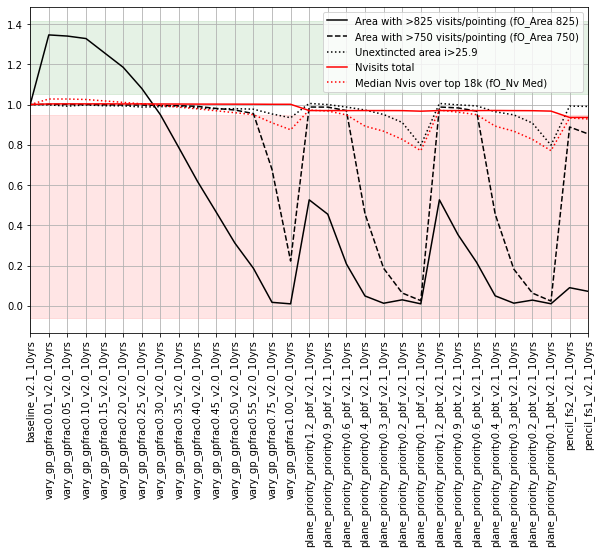

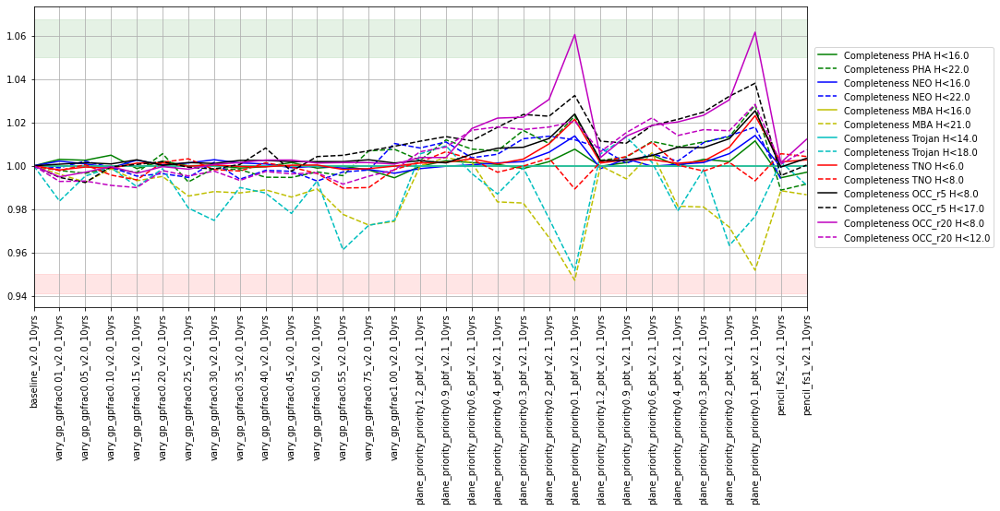

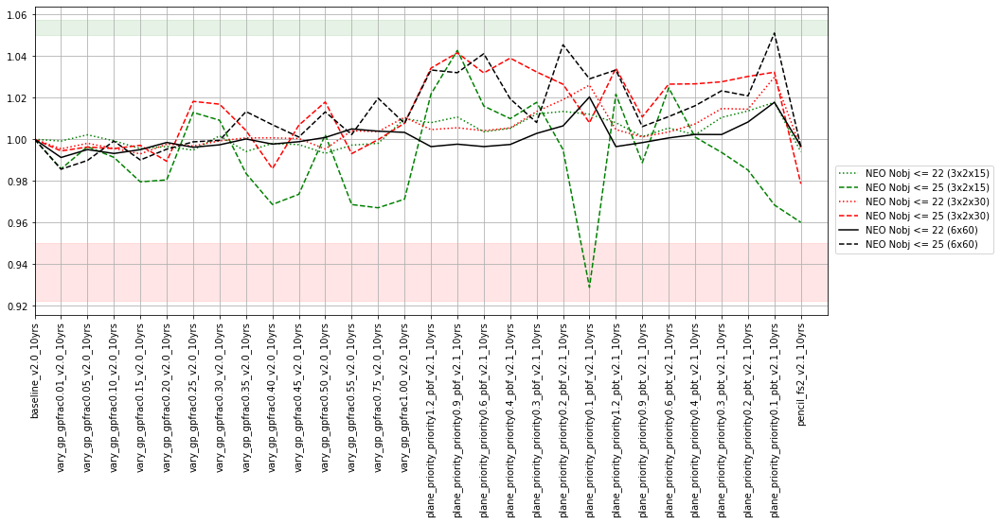

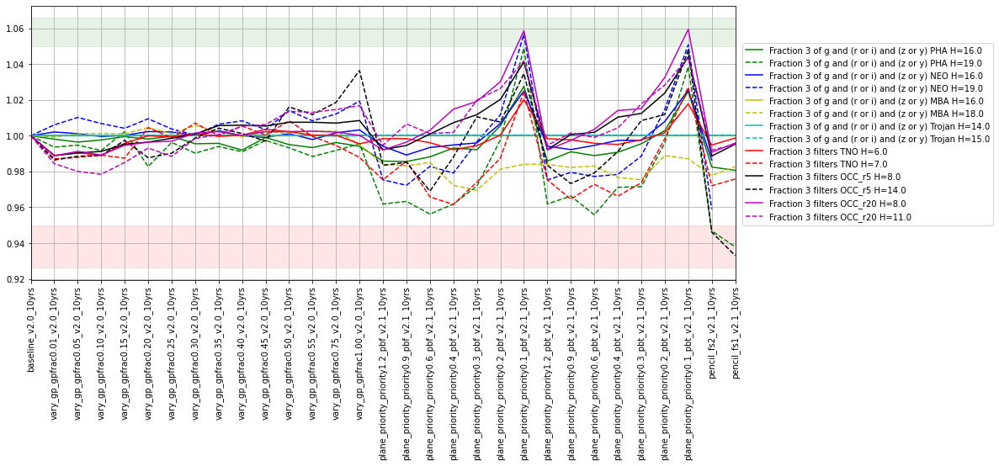

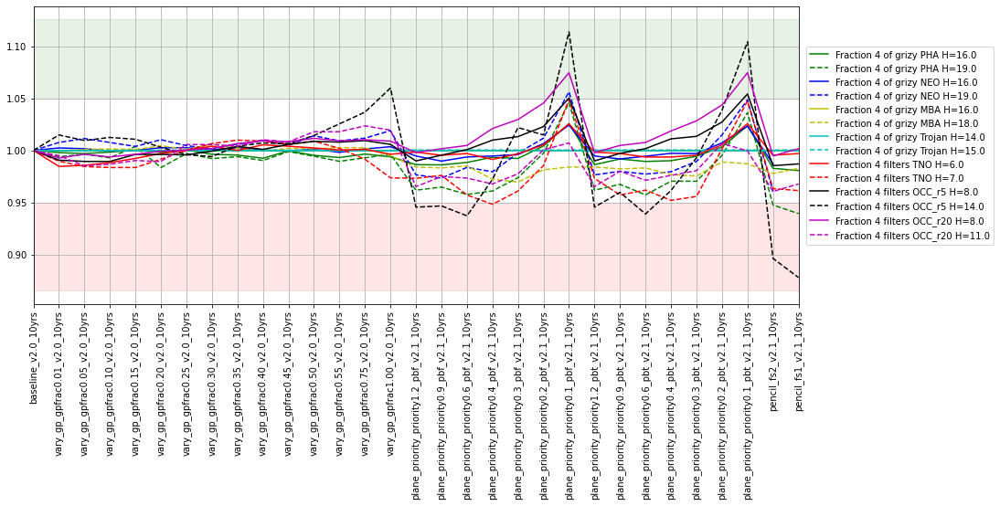

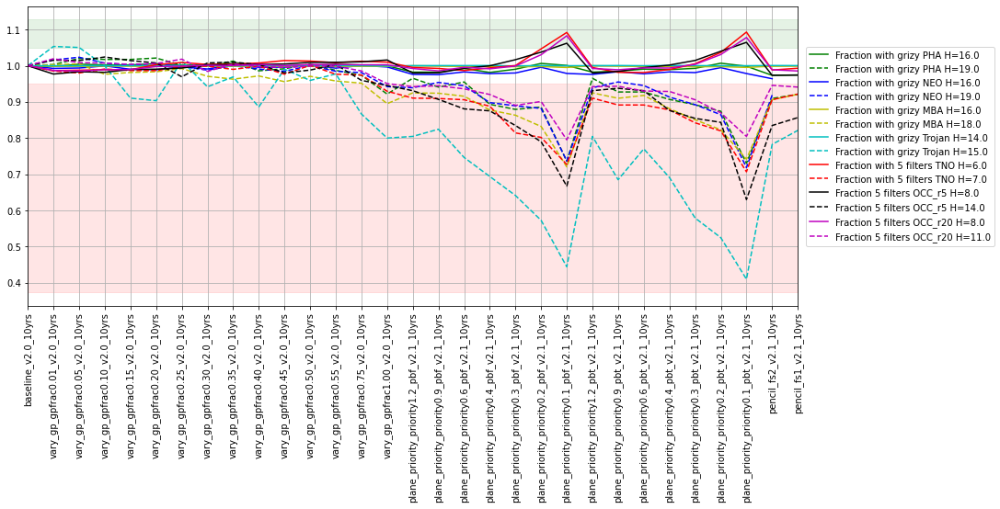

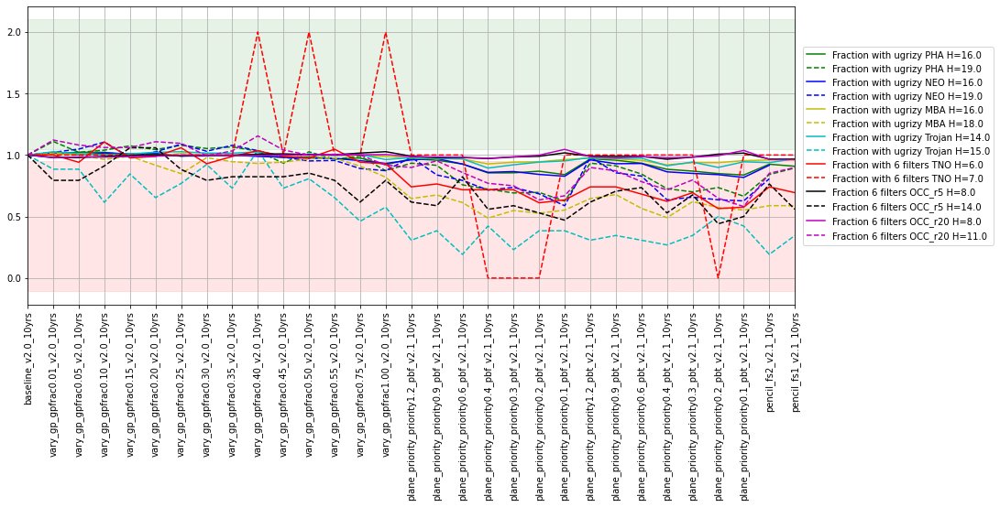

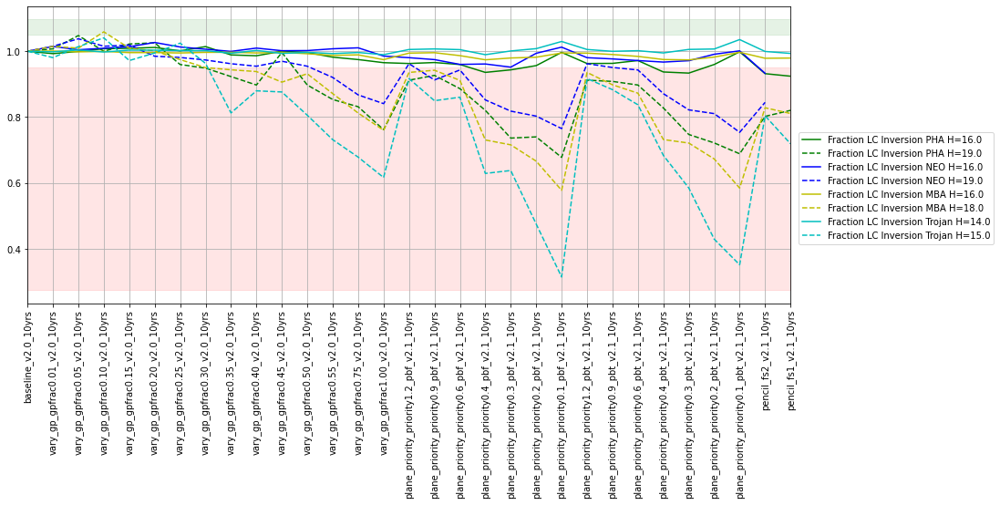

In [13]:
fam = ['vary gp', 'galactic plane footprint']
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

---
**vary expt** : The baseline survey strategy uses 2x15s visits for grizy filters, and 1x30s visits for u band. The simulations in this family vary the exposure time per visit from 20 to 40 seconds, to evaluate the impact on various metrics of varying individual image depth (the "shave_" runs). In addition, there is one simulation (`vary_expt_v2.0_10yrs`) which uses variable exposure time per visit to attempt to make the individual image depth consistent - each visit in this simulation could have an exposure time of between 20 to 100 seconds.  
**version**: --  
**runs**:  


,brief,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band
run,,,,,,,,,,,
shave_20_v2.1_10yrs,Reduce exposure time per visit to 20 seconds,19186.25,15422.02,2791414.0,1125.0,73.0,93.0,242.0,244.0,215.0,222.0
shave_22_v2.1_10yrs,Reduce exposure time per visit to 22 seconds,19074.63,15961.69,2611966.0,1053.0,68.0,87.0,226.0,228.0,200.0,208.0
shave_25_v2.1_10yrs,Reduce exposure time per visit to 25 seconds,18796.82,16501.35,2383592.0,961.0,62.0,79.0,206.0,208.0,183.0,189.0
shave_28_v2.1_10yrs,Reduce exposure time per visit to 29 seconds,18151.40,16810.21,2192248.0,884.0,57.0,72.0,189.0,191.0,168.0,174.0
shave_30_v2.1_10yrs,Keep exposure time per visit at 30 seconds,12524.78,17008.29,2081086.0,838.0,55.0,69.0,179.0,181.0,159.0,165.0
shave_32_v2.1_10yrs,Extend exposure time per visit to 32 seconds,2982.85,17111.52,1980338.0,797.0,51.0,65.0,170.0,172.0,151.0,157.0
shave_35_v2.1_10yrs,Extend exposure time per visit to 35 seconds,143.52,17180.34,1847269.0,744.0,48.0,61.0,158.0,161.0,141.0,147.0
shave_38_v2.1_10yrs,Extend exposure time per visit to 38 seconds,109.11,17224.82,1729706.0,696.0,45.0,57.0,148.0,150.0,131.0,138.0
shave_40_v2.1_10yrs,Extend exposure time per visit to 40 seconds,108.27,17265.95,1660675.0,667.0,43.0,55.0,142.0,144.0,126.0,131.0


metric,Completeness PHA H<16.0,Completeness PHA H<22.0,Completeness NEO H<16.0,Completeness NEO H<22.0,Completeness MBA H<16.0,Completeness MBA H<21.0,Completeness Trojan H<14.0,Completeness Trojan H<18.0,Completeness TNO H<6.0,Completeness TNO H<8.0,Completeness OCC_r5 H<8.0,Completeness OCC_r5 H<17.0,Completeness OCC_r20 H<8.0,Completeness OCC_r20 H<12.0
run,,,,,,,,,,,,,,
baseline_v2.1_10yrs,0.9394,0.596009,0.9296,0.581853,1.0,0.542863,1.0,0.437629,0.699244,0.479611,0.938400,0.640160,0.855200,0.604698
shave_20_v2.1_10yrs,0.9588,0.619975,0.9422,0.600424,1.0,0.510176,1.0,0.385379,0.688367,0.430677,0.940326,0.633091,0.859451,0.560028
shave_22_v2.1_10yrs,0.9558,0.620424,0.9406,0.600734,1.0,0.519718,1.0,0.397567,0.690414,0.444112,0.940075,0.635642,0.860200,0.574714
shave_25_v2.1_10yrs,0.9478,0.611000,0.9358,0.591381,1.0,0.527981,1.0,0.412096,0.693869,0.454278,0.939600,0.641310,0.859526,0.587747
shave_28_v2.1_10yrs,0.9410,0.600938,0.9312,0.587443,1.0,0.546722,1.0,0.436572,0.698181,0.473136,0.938800,0.639836,0.856926,0.601284
shave_30_v2.1_10yrs,0.9392,0.596612,0.9314,0.580323,1.0,0.546895,1.0,0.445476,0.699379,0.480212,0.938000,0.641541,0.857075,0.610511
shave_32_v2.1_10yrs,0.9364,0.590677,0.9274,0.581580,1.0,0.551382,1.0,0.453518,0.701044,0.486026,0.937800,0.638923,0.855400,0.613628
shave_35_v2.1_10yrs,0.9338,0.583781,0.9244,0.572392,1.0,0.557519,1.0,0.454010,0.703352,0.496514,0.937926,0.638633,0.854000,0.624362
shave_38_v2.1_10yrs,0.9286,0.574365,0.9196,0.563431,1.0,0.564001,1.0,0.472778,0.704069,0.503182,0.935326,0.635802,0.854000,0.632209


metric,NEO Nobj <= 22 (3x2x15),NEO Nobj <= 25 (3x2x15),NEO Nobj <= 22 (3x2x30),NEO Nobj <= 25 (3x2x30),NEO Nobj <= 22 (6x60),NEO Nobj <= 25 (6x60)
run,,,,,,
baseline_v2.1_10yrs,15837.376542,57914.501791,17040.210805,67295.599983,18997.647487,98395.324798
shave_20_v2.1_10yrs,16332.812367,66449.623769,17164.671330,74120.989818,18888.929468,100322.863167
shave_22_v2.1_10yrs,16340.153235,66481.474066,17246.852914,73811.149167,18965.240376,102123.633858
shave_25_v2.1_10yrs,16091.400681,63354.077321,17163.410939,71868.376646,18977.519760,101670.426140
shave_28_v2.1_10yrs,15984.820409,62239.598223,17086.167060,71351.698826,18944.896584,98982.773143
shave_30_v2.1_10yrs,15798.763023,62044.141121,17000.161831,71495.365043,18996.384491,99829.964794
shave_32_v2.1_10yrs,15829.749940,59646.429683,17007.522605,69314.468227,18995.212362,97815.370881
shave_35_v2.1_10yrs,15586.286073,55643.235362,16824.528681,64967.335178,18913.296245,95774.425015
shave_38_v2.1_10yrs,15348.493675,53891.067081,16695.724317,64954.841226,18812.626659,93826.985346


metric,Fraction 3 of g and (r or i) and (z or y) PHA H=16.0,Fraction 3 of g and (r or i) and (z or y) PHA H=19.0,Fraction 3 of g and (r or i) and (z or y) NEO H=16.0,Fraction 3 of g and (r or i) and (z or y) NEO H=19.0,Fraction 3 of g and (r or i) and (z or y) MBA H=16.0,Fraction 3 of g and (r or i) and (z or y) MBA H=18.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=14.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=15.0,Fraction 3 filters TNO H=6.0,Fraction 3 filters TNO H=7.0,Fraction 3 filters OCC_r5 H=8.0,Fraction 3 filters OCC_r5 H=14.0,Fraction 3 filters OCC_r20 H=8.0,Fraction 3 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.1_10yrs,0.8408,0.5236,0.8540,0.5246,1.0,0.896179,1.0,1.0000,0.6146,0.4678,0.8474,0.4706,0.7782,0.6412
shave_20_v2.1_10yrs,0.8824,0.5822,0.8860,0.5794,1.0,0.841168,1.0,0.9992,0.5982,0.4108,0.8772,0.5606,0.7988,0.5808
shave_22_v2.1_10yrs,0.8714,0.5748,0.8798,0.5686,1.0,0.861172,1.0,1.0000,0.6034,0.4332,0.8670,0.5414,0.7954,0.5974
shave_25_v2.1_10yrs,0.8638,0.5560,0.8698,0.5520,1.0,0.877375,1.0,1.0000,0.6078,0.4482,0.8608,0.5150,0.7908,0.6254
shave_28_v2.1_10yrs,0.8506,0.5392,0.8616,0.5366,1.0,0.893379,1.0,0.9998,0.6142,0.4640,0.8522,0.4904,0.7830,0.6392
shave_30_v2.1_10yrs,0.8436,0.5270,0.8568,0.5318,1.0,0.898580,1.0,1.0000,0.6148,0.4710,0.8468,0.4750,0.7786,0.6412
shave_32_v2.1_10yrs,0.8350,0.5154,0.8476,0.5194,1.0,0.901380,1.0,1.0000,0.6198,0.4826,0.8418,0.4546,0.7760,0.6488
shave_35_v2.1_10yrs,0.8248,0.5010,0.8340,0.4980,1.0,0.903381,1.0,1.0000,0.6232,0.4870,0.8320,0.4300,0.7676,0.6498
shave_38_v2.1_10yrs,0.8108,0.4812,0.8278,0.4874,1.0,0.913183,1.0,1.0000,0.6244,0.4962,0.8204,0.4068,0.7618,0.6508


metric,Fraction 4 of grizy PHA H=16.0,Fraction 4 of grizy PHA H=19.0,Fraction 4 of grizy NEO H=16.0,Fraction 4 of grizy NEO H=19.0,Fraction 4 of grizy MBA H=16.0,Fraction 4 of grizy MBA H=18.0,Fraction 4 of grizy Trojan H=14.0,Fraction 4 of grizy Trojan H=15.0,Fraction 4 filters TNO H=6.0,Fraction 4 filters TNO H=7.0,Fraction 4 filters OCC_r5 H=8.0,Fraction 4 filters OCC_r5 H=14.0,Fraction 4 filters OCC_r20 H=8.0,Fraction 4 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.1_10yrs,0.8402,0.5234,0.8538,0.5242,1.0,0.896179,1.0,1.0000,0.5982,0.4150,0.8294,0.3340,0.7630,0.3838
shave_20_v2.1_10yrs,0.8822,0.5804,0.8858,0.5786,1.0,0.841168,1.0,0.9992,0.5800,0.3610,0.8636,0.4282,0.7872,0.3180
shave_22_v2.1_10yrs,0.8710,0.5736,0.8796,0.5682,1.0,0.861172,1.0,1.0000,0.5852,0.3796,0.8546,0.4114,0.7842,0.3374
shave_25_v2.1_10yrs,0.8636,0.5556,0.8696,0.5514,1.0,0.877375,1.0,1.0000,0.5908,0.3942,0.8472,0.3816,0.7762,0.3540
shave_28_v2.1_10yrs,0.8502,0.5388,0.8614,0.5366,1.0,0.893379,1.0,0.9998,0.5958,0.4134,0.8358,0.3550,0.7692,0.3764
shave_30_v2.1_10yrs,0.8432,0.5264,0.8562,0.5316,1.0,0.898580,1.0,1.0000,0.5972,0.4170,0.8286,0.3316,0.7620,0.3834
shave_32_v2.1_10yrs,0.8340,0.5144,0.8476,0.5192,1.0,0.901380,1.0,1.0000,0.5994,0.4236,0.8228,0.3112,0.7582,0.3950
shave_35_v2.1_10yrs,0.8240,0.5006,0.8340,0.4978,1.0,0.903381,1.0,1.0000,0.6000,0.4282,0.8082,0.2900,0.7532,0.4078
shave_38_v2.1_10yrs,0.8106,0.4810,0.8274,0.4872,1.0,0.913183,1.0,1.0000,0.6016,0.4314,0.7970,0.2668,0.7444,0.4178


metric,Fraction with grizy PHA H=16.0,Fraction with grizy PHA H=19.0,Fraction with grizy NEO H=16.0,Fraction with grizy NEO H=19.0,Fraction with grizy MBA H=16.0,Fraction with grizy MBA H=18.0,Fraction with grizy Trojan H=14.0,Fraction with grizy Trojan H=15.0,Fraction with 5 filters TNO H=6.0,Fraction with 5 filters TNO H=7.0,Fraction 5 filters OCC_r5 H=8.0,Fraction 5 filters OCC_r5 H=14.0,Fraction 5 filters OCC_r20 H=8.0,Fraction 5 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.1_10yrs,0.7144,0.2988,0.7454,0.3116,0.994999,0.405681,1.0000,0.4578,0.3988,0.1612,0.7480,0.1784,0.6966,0.1576
shave_20_v2.1_10yrs,0.7822,0.3636,0.8058,0.3770,0.995399,0.365673,1.0000,0.2084,0.3872,0.1050,0.7994,0.2716,0.7212,0.1432
shave_22_v2.1_10yrs,0.7686,0.3578,0.7910,0.3606,0.994599,0.378276,1.0000,0.2464,0.3914,0.1200,0.7892,0.2512,0.7168,0.1476
shave_25_v2.1_10yrs,0.7496,0.3330,0.7762,0.3418,0.994799,0.390278,1.0000,0.3342,0.3948,0.1394,0.7716,0.2232,0.7110,0.1532
shave_28_v2.1_10yrs,0.7320,0.3204,0.7592,0.3258,0.995999,0.394479,0.9994,0.4018,0.3996,0.1506,0.7570,0.1948,0.7014,0.1550
shave_30_v2.1_10yrs,0.7196,0.3052,0.7488,0.3178,0.995999,0.401080,0.9998,0.4608,0.4026,0.1598,0.7482,0.1828,0.6978,0.1586
shave_32_v2.1_10yrs,0.7076,0.2936,0.7336,0.3032,0.995199,0.409682,0.9998,0.4924,0.4054,0.1714,0.7378,0.1660,0.6892,0.1606
shave_35_v2.1_10yrs,0.6930,0.2788,0.7188,0.2914,0.995799,0.413883,1.0000,0.5522,0.4038,0.1802,0.7220,0.1432,0.6812,0.1638
shave_38_v2.1_10yrs,0.6748,0.2630,0.6992,0.2644,0.995599,0.420884,1.0000,0.5862,0.4032,0.1918,0.7028,0.1264,0.6740,0.1682


metric,Fraction with ugrizy PHA H=16.0,Fraction with ugrizy PHA H=19.0,Fraction with ugrizy NEO H=16.0,Fraction with ugrizy NEO H=19.0,Fraction with ugrizy MBA H=16.0,Fraction with ugrizy MBA H=18.0,Fraction with ugrizy Trojan H=14.0,Fraction with ugrizy Trojan H=15.0,Fraction with 6 filters TNO H=6.0,Fraction with 6 filters TNO H=7.0,Fraction 6 filters OCC_r5 H=8.0,Fraction 6 filters OCC_r5 H=14.0,Fraction 6 filters OCC_r20 H=8.0,Fraction 6 filters OCC_r20 H=11.0
run,,,,,,,,,,,,,,
baseline_v2.1_10yrs,0.4386,0.0476,0.4500,0.0454,0.884777,0.042809,0.9182,0.0020,0.0136,2.000000e-04,0.5988,0.0056,0.6056,0.0278
shave_20_v2.1_10yrs,0.5122,0.0650,0.5330,0.0550,0.844169,0.023605,0.7220,0.0014,0.0060,2.656295e-18,0.6800,0.0148,0.6506,0.0258
shave_22_v2.1_10yrs,0.4986,0.0564,0.5190,0.0540,0.852170,0.027405,0.7596,0.0018,0.0078,2.656295e-18,0.6578,0.0112,0.6404,0.0266
shave_25_v2.1_10yrs,0.4710,0.0524,0.4892,0.0500,0.865573,0.030406,0.8480,0.0020,0.0098,2.656295e-18,0.6358,0.0088,0.6266,0.0274
shave_28_v2.1_10yrs,0.4488,0.0490,0.4688,0.0464,0.883177,0.041408,0.9044,0.0014,0.0118,2.000000e-04,0.6170,0.0076,0.6118,0.0288
shave_30_v2.1_10yrs,0.4408,0.0444,0.4562,0.0442,0.882577,0.037808,0.8882,0.0020,0.0124,2.000000e-04,0.5974,0.0062,0.6028,0.0290
shave_32_v2.1_10yrs,0.4234,0.0398,0.4418,0.0420,0.878576,0.042008,0.9194,0.0026,0.0146,2.000000e-04,0.5806,0.0050,0.5960,0.0270
shave_35_v2.1_10yrs,0.4002,0.0356,0.4202,0.0346,0.878576,0.040008,0.9272,0.0020,0.0172,2.000000e-04,0.5560,0.0046,0.5832,0.0286
shave_38_v2.1_10yrs,0.3774,0.0324,0.3872,0.0314,0.859572,0.042008,0.9302,0.0026,0.0192,2.000000e-04,0.5280,0.0032,0.5636,0.0248


metric,Fraction LC Inversion PHA H=16.0,Fraction LC Inversion PHA H=19.0,Fraction LC Inversion NEO H=16.0,Fraction LC Inversion NEO H=19.0,Fraction LC Inversion MBA H=16.0,Fraction LC Inversion MBA H=18.0,Fraction LC Inversion Trojan H=14.0,Fraction LC Inversion Trojan H=15.0
run,,,,,,,,
baseline_v2.1_10yrs,0.4662,0.0546,0.4812,0.0548,0.946789,0.155031,0.9428,0.1186
shave_20_v2.1_10yrs,0.5828,0.0994,0.5974,0.0920,0.979196,0.194039,0.9642,0.1484
shave_22_v2.1_10yrs,0.5516,0.0898,0.5684,0.0824,0.972394,0.188838,0.9610,0.1372
shave_25_v2.1_10yrs,0.5238,0.0758,0.5420,0.0746,0.963193,0.171434,0.9588,0.1170
shave_28_v2.1_10yrs,0.4886,0.0622,0.5050,0.0614,0.956191,0.163233,0.9520,0.1372
shave_30_v2.1_10yrs,0.4694,0.0560,0.4824,0.0566,0.945389,0.147029,0.9454,0.1226
shave_32_v2.1_10yrs,0.4484,0.0494,0.4628,0.0498,0.940388,0.143629,0.9440,0.1198
shave_35_v2.1_10yrs,0.4218,0.0418,0.4280,0.0374,0.922384,0.127826,0.9182,0.1190
shave_38_v2.1_10yrs,0.3896,0.0300,0.3980,0.0302,0.892378,0.117624,0.9220,0.1010


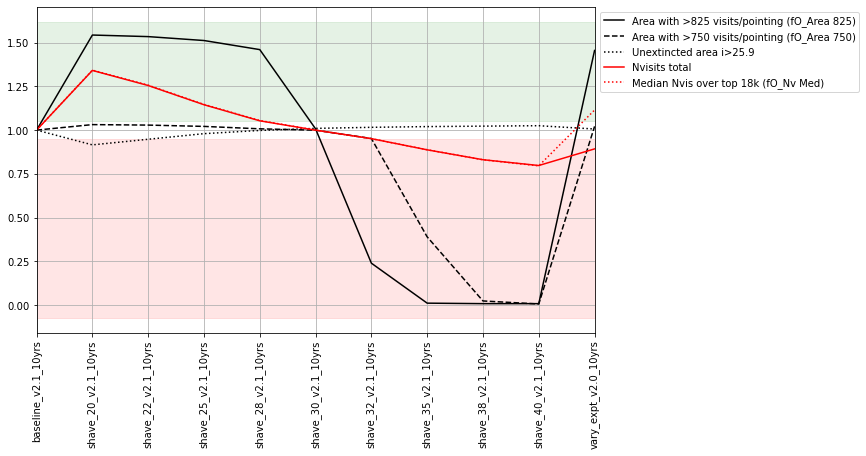

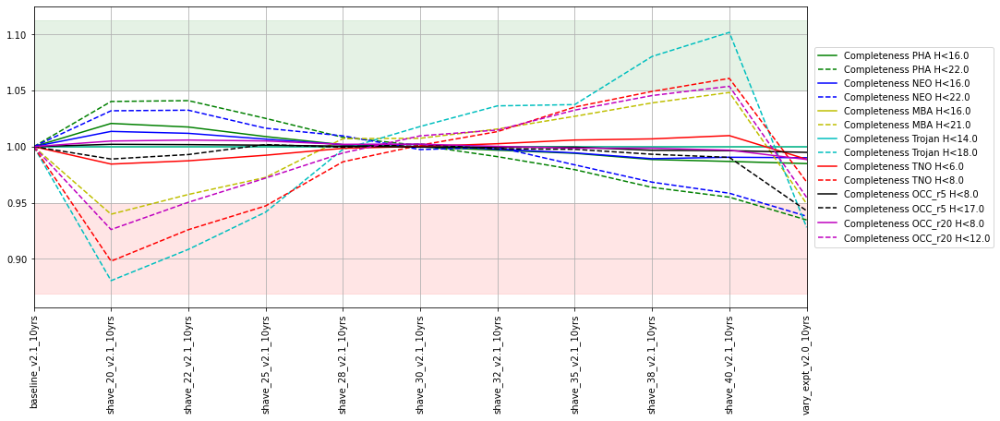

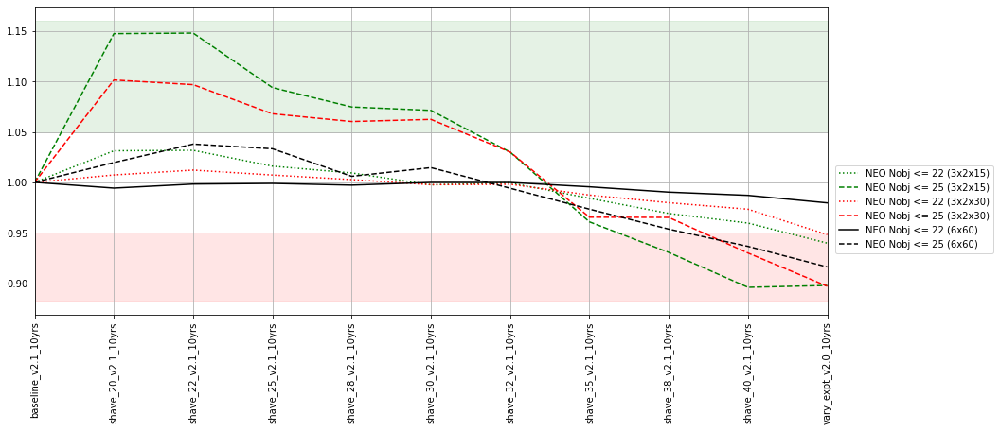

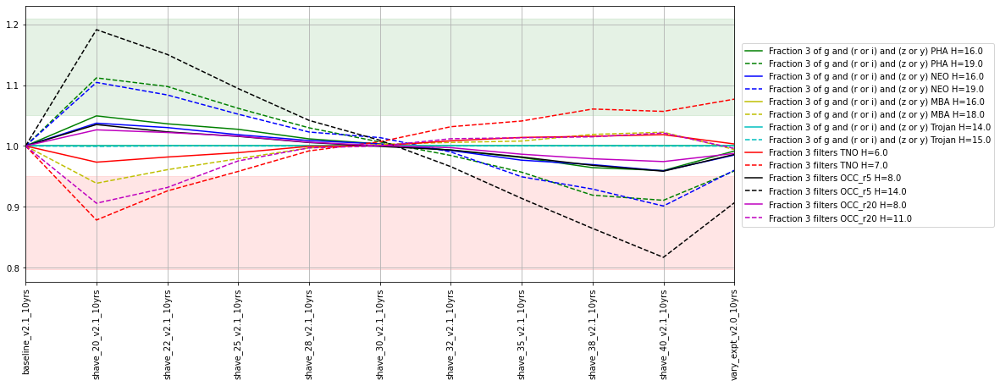

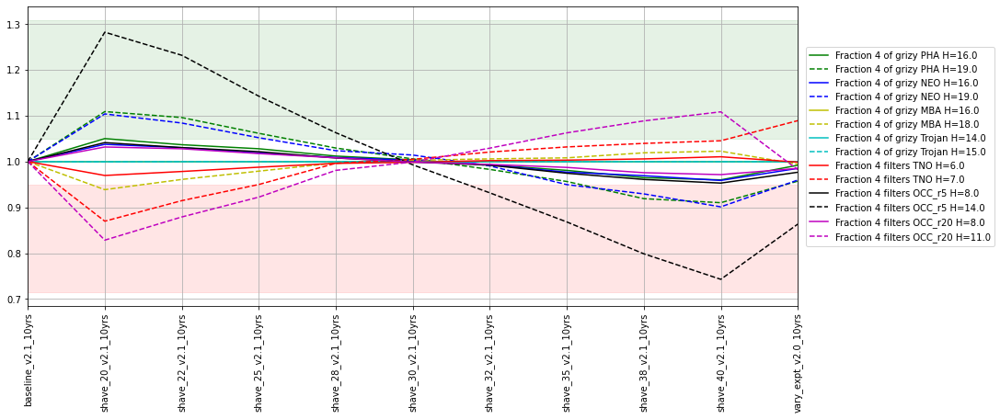

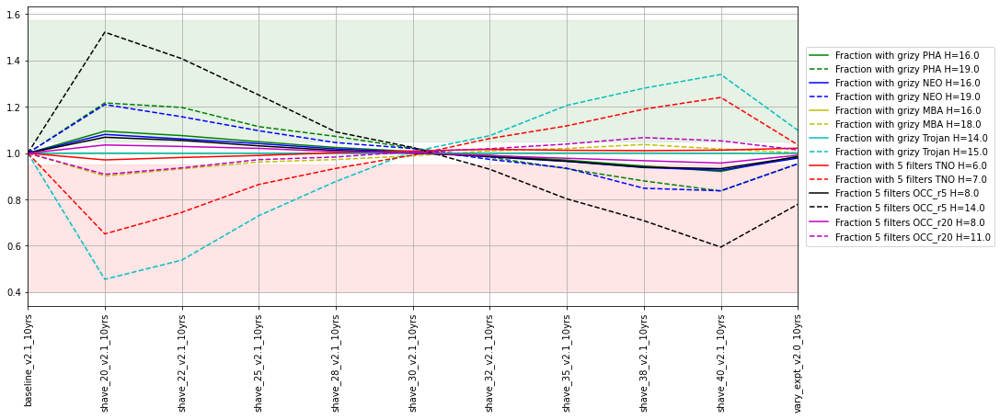

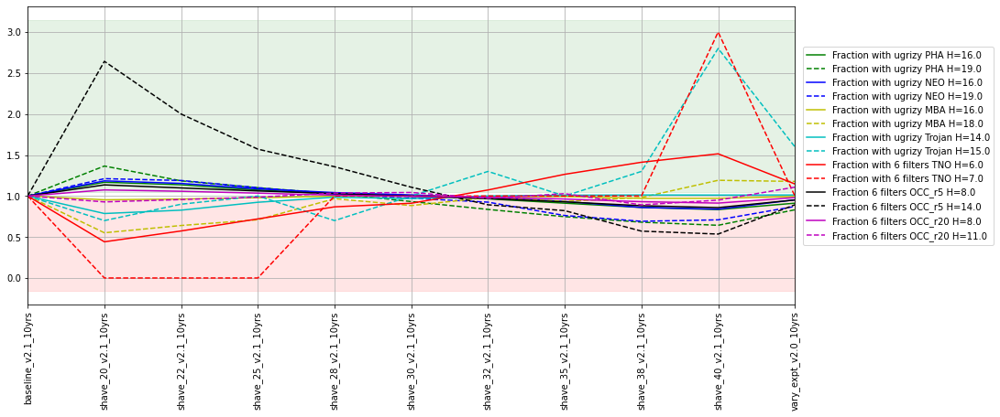

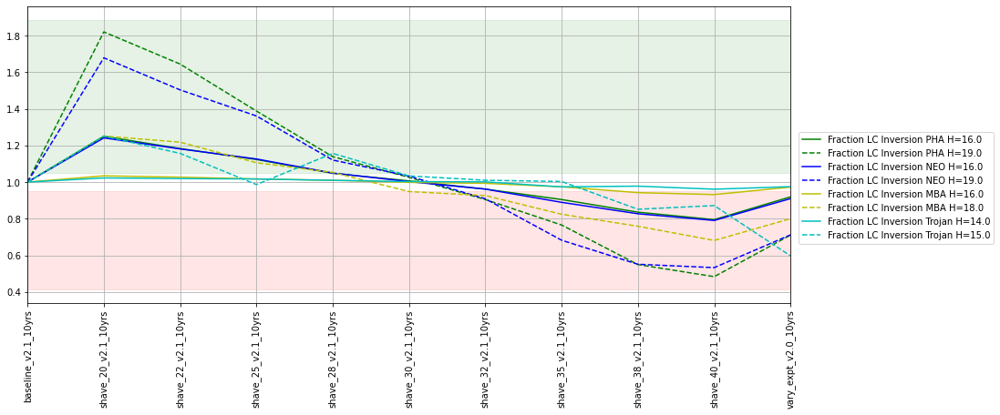

In [14]:
fam = ['vary expt']
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

In [15]:
fam = ['vary_expt']
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

KeyError: "None of [Index(['vary_expt'], dtype='object', name='family')] are in the [index]"

In [ ]:
fam = ['good seeing']
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

In [ ]:
fam = ['suppress repeats']
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

In [ ]:
fam = ['technical']
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

In [ ]:
fam = [d for d in families.index if 'ddf' in d]
fam = ['ddf percent', 'ddf quad subfilter']
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

In [ ]:
# Basic 'general' metrics for a subset of runs
tt = families.explode(["run", "brief", "filepath"])[['run', 'brief', 'reference']].reset_index().set_index('run')

def describe_runs(these_runs):
    baseline_run = tt['reference'].loc[these_runs].iloc[0]
    if baseline_run not in these_runs:
        these_runs = [baseline_run] + these_runs
    d = summaries.loc[these_runs, metrics.loc['short']['metric']]
    d.columns = metrics.loc['short']['short_name'].values
    d['Briefly'] = tt['brief']
    IPython.display.display(d)
    mset = 'area'
    fig, ax = maf.plot_run_metric(  # pylint: disable=invalid-name
        summaries.loc[these_runs, :], 
        metric_set=metrics.loc[mset],
        baseline_run=baseline_run,
        vertical_quantity="value",
        horizontal_quantity="run",
        metric_label_map=metrics.loc[mset]['short_name']
    )
    plt.xlim(0, len(d)-1)
    xlims = plt.xlim()
    if plt.ylim()[0] < 0.50:
        plt.ylim(bottom=0.50)
    if plt.ylim()[1] > 1.5:
        plt.ylim(top=1.5)
    plt.fill_between(xlims, 1.05, plt.ylim()[1], color='g', alpha=0.1)
    plt.fill_between(xlims, 0.95, plt.ylim()[0], color='r', alpha=0.1)

# Show and plot set of solar system specific metric outputs
def sso_runs(these_runs, mset):
    baseline_run = tt['reference'].loc[these_runs].iloc[0]
    if baseline_run not in these_runs:
        these_runs = [baseline_run] + these_runs
    fig, ax = maf.plot_run_metric(  # pylint: disable=invalid-name
            summaries.loc[these_runs, :], 
            metric_set=metrics.loc[mset],
            baseline_run=baseline_run,
            vertical_quantity="value",
            horizontal_quantity="run",
            metric_label_map=metrics.loc[mset]['short_name']
        )
    d = summaries.loc[these_runs, metrics.loc[mset]['metric']]
    d.columns = metrics.loc[mset]['short_name']
    plt.xlim(0, len(d)-1)
    xlims = plt.xlim()
    if plt.ylim()[0] < 0.50:
        plt.ylim(bottom=0.50)
    if plt.ylim()[1] > 1.5:
        plt.ylim(top=1.5)
    plt.fill_between(xlims, 1.05, plt.ylim()[1], color='g', alpha=0.1)
    plt.fill_between(xlims, 0.95, plt.ylim()[0], color='r', alpha=0.1)
    return d

In [ ]:
these_runs = [r for r in tt.index if 'twilight' in r]
describe_runs(these_runs)
for mset in sso_metrics:
    d = sso_runs(these_runs, mset)
    IPython.display.display(d)